## Import all the necessary libraries

In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import warnings
warnings.filterwarnings(action="ignore")

## Import the source file

In [2]:
df_new=pd.read_csv('application_data.csv')
df_new.head()

,SK_ID_CURR,TARGET,NAME_CONTRACT_TYPE,CODE_GENDER,FLAG_OWN_CAR,FLAG_OWN_REALTY,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT,AMT_ANNUITY,...,FLAG_DOCUMENT_18,FLAG_DOCUMENT_19,FLAG_DOCUMENT_20,FLAG_DOCUMENT_21,AMT_REQ_CREDIT_BUREAU_HOUR,AMT_REQ_CREDIT_BUREAU_DAY,AMT_REQ_CREDIT_BUREAU_WEEK,AMT_REQ_CREDIT_BUREAU_MON,AMT_REQ_CREDIT_BUREAU_QRT,AMT_REQ_CREDIT_BUREAU_YEAR
0,100002,1,Cash loans,M,N,Y,0,202500.0,406597.5,24700.5,...,0,0,0,0,0.0,0.0,0.0,0.0,0.0,1.0
1,100003,0,Cash loans,F,N,N,0,270000.0,1293502.5,35698.5,...,0,0,0,0,0.0,0.0,0.0,0.0,0.0,0.0
2,100004,0,Revolving loans,M,Y,Y,0,67500.0,135000.0,6750.0,...,0,0,0,0,0.0,0.0,0.0,0.0,0.0,0.0
3,100006,0,Cash loans,F,N,Y,0,135000.0,312682.5,29686.5,...,0,0,0,0,NaN,NaN,NaN,NaN,NaN,NaN
4,100007,0,Cash loans,M,N,Y,0,121500.0,513000.0,21865.5,...,0,0,0,0,0.0,0.0,0.0,0.0,0.0,0.0


In [3]:
col=pd.read_csv('columns_description.csv',encoding='windows-1252')
col   

,Unnamed: 0,Table,Row,Description,Special
0,1,application_data,SK_ID_CURR,ID of loan in our sample,NaN
1,2,application_data,TARGET,Target variable (1 - client with payment diffi...,NaN
2,5,application_data,NAME_CONTRACT_TYPE,Identification if loan is cash or revolving,NaN
3,6,application_data,CODE_GENDER,Gender of the client,NaN
4,7,application_data,FLAG_OWN_CAR,Flag if the client owns a car,NaN
...,...,...,...,...,...
155,209,previous_application.csv,DAYS_FIRST_DUE,Relative to application date of current applic...,time only relative to the application
156,210,previous_application.csv,DAYS_LAST_DUE_1ST_VERSION,Relative to application date of current applic...,time only relative to the application
157,211,previous_application.csv,DAYS_LAST_DUE,Relative to application date of current applic...,time only relative to the application
158,212,previous_application.csv,DAYS_TERMINATION,Relative to application date of current applic...,time only relative to the application


## Check Datatype of all the columns

In [4]:
df_new.dtypes

SK_ID_CURR                      int64
TARGET                          int64
NAME_CONTRACT_TYPE             object
CODE_GENDER                    object
FLAG_OWN_CAR                   object
                               ...   
AMT_REQ_CREDIT_BUREAU_DAY     float64
AMT_REQ_CREDIT_BUREAU_WEEK    float64
AMT_REQ_CREDIT_BUREAU_MON     float64
AMT_REQ_CREDIT_BUREAU_QRT     float64
AMT_REQ_CREDIT_BUREAU_YEAR    float64
Length: 122, dtype: object

Data type of all the columns are correct there no need of type casting in any column

## Checking the number of columns and row in the columns

In [5]:
df_new.info(verbose=True)

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 307511 entries, 0 to 307510
Data columns (total 122 columns):
 #    Column                        Dtype  
---   ------                        -----  
 0    SK_ID_CURR                    int64  
 1    TARGET                        int64  
 2    NAME_CONTRACT_TYPE            object 
 3    CODE_GENDER                   object 
 4    FLAG_OWN_CAR                  object 
 5    FLAG_OWN_REALTY               object 
 6    CNT_CHILDREN                  int64  
 7    AMT_INCOME_TOTAL              float64
 8    AMT_CREDIT                    float64
 9    AMT_ANNUITY                   float64
 10   AMT_GOODS_PRICE               float64
 11   NAME_TYPE_SUITE               object 
 12   NAME_INCOME_TYPE              object 
 13   NAME_EDUCATION_TYPE           object 
 14   NAME_FAMILY_STATUS            object 
 15   NAME_HOUSING_TYPE             object 
 16   REGION_POPULATION_RELATIVE    float64
 17   DAYS_BIRTH                    int64  
 18   DA

## Handling null values

In [6]:
df_new.isnull().mean() * 100

SK_ID_CURR                     0.000000
TARGET                         0.000000
NAME_CONTRACT_TYPE             0.000000
CODE_GENDER                    0.000000
FLAG_OWN_CAR                   0.000000
                                ...    
AMT_REQ_CREDIT_BUREAU_DAY     13.501631
AMT_REQ_CREDIT_BUREAU_WEEK    13.501631
AMT_REQ_CREDIT_BUREAU_MON     13.501631
AMT_REQ_CREDIT_BUREAU_QRT     13.501631
AMT_REQ_CREDIT_BUREAU_YEAR    13.501631
Length: 122, dtype: float64

Dropping columns have null values percentage greater than 40

In [7]:
missing_percentage = df_new.isnull().mean() * 100
columns_to_drop = missing_percentage[missing_percentage <40].index
df = df_new[columns_to_drop]

In [8]:
pd.set_option('display.max_columns', None)
pd.set_option('display.max_rows', 200)

In [9]:
## Column with percentage null values less than40%
(df.isnull().mean()*100).sort_values(ascending= False).head(10)

OCCUPATION_TYPE               31.345545
EXT_SOURCE_3                  19.825307
AMT_REQ_CREDIT_BUREAU_YEAR    13.501631
AMT_REQ_CREDIT_BUREAU_QRT     13.501631
AMT_REQ_CREDIT_BUREAU_MON     13.501631
AMT_REQ_CREDIT_BUREAU_WEEK    13.501631
AMT_REQ_CREDIT_BUREAU_DAY     13.501631
AMT_REQ_CREDIT_BUREAU_HOUR    13.501631
NAME_TYPE_SUITE                0.420148
OBS_30_CNT_SOCIAL_CIRCLE       0.332021
dtype: float64

* The percentage of missing values in the columns below is small. Instead of imputing them, drop the null values (the percentage of null values is between 0 and 1). Dropping these null values will not impact the analysis results.

In [10]:
(df.isnull().mean()*100)[((df.isnull().mean()*100)>0)&((df.isnull().mean()*100)<1)]

AMT_ANNUITY                 0.003902
AMT_GOODS_PRICE             0.090403
NAME_TYPE_SUITE             0.420148
CNT_FAM_MEMBERS             0.000650
EXT_SOURCE_2                0.214626
OBS_30_CNT_SOCIAL_CIRCLE    0.332021
DEF_30_CNT_SOCIAL_CIRCLE    0.332021
OBS_60_CNT_SOCIAL_CIRCLE    0.332021
DEF_60_CNT_SOCIAL_CIRCLE    0.332021
DAYS_LAST_PHONE_CHANGE      0.000325
dtype: float64

In [11]:
df.dropna(subset=['AMT_ANNUITY','AMT_GOODS_PRICE','NAME_TYPE_SUITE','CNT_FAM_MEMBERS','EXT_SOURCE_2','OBS_30_CNT_SOCIAL_CIRCLE','DEF_30_CNT_SOCIAL_CIRCLE','OBS_60_CNT_SOCIAL_CIRCLE','DEF_60_CNT_SOCIAL_CIRCLE','DAYS_LAST_PHONE_CHANGE'],inplace=True)

##  Handling columns with null values percentage between 0 and 40

In [12]:
(df.isnull().mean()*100)[((df.isnull().mean()*100)>0)]

OCCUPATION_TYPE               31.338353
EXT_SOURCE_3                  19.784849
AMT_REQ_CREDIT_BUREAU_HOUR    13.498790
AMT_REQ_CREDIT_BUREAU_DAY     13.498790
AMT_REQ_CREDIT_BUREAU_WEEK    13.498790
AMT_REQ_CREDIT_BUREAU_MON     13.498790
AMT_REQ_CREDIT_BUREAU_QRT     13.498790
AMT_REQ_CREDIT_BUREAU_YEAR    13.498790
dtype: float64

## OCCUPATION_TYPE

* In the Occupation type, null values are associated with higher income. The missingness likely depends on the higher income value. This falls under MNAR (missing not at random), as people with higher income tend to hide their occupation. Therefore, we will not impute the missing values or drop them because it can skew the data, and dropping the data would result in data loss.

In [13]:
count_null=df[(df.OCCUPATION_TYPE.isnull()) & (df.AMT_INCOME_TOTAL>100000)&(df.AMT_INCOME_TOTAL<300000)]
count_null.shape

(63201, 73)

In [14]:
count_null=df[(df.OCCUPATION_TYPE.isnull()) & (df.AMT_INCOME_TOTAL>50000)&(df.AMT_INCOME_TOTAL<100000)]
count_null.shape

(24041, 73)

In [15]:
count_null=df[(df.OCCUPATION_TYPE.isnull()) & (df.AMT_INCOME_TOTAL>25000)&(df.AMT_INCOME_TOTAL<50000)]
count_null.shape

(2908, 73)

In [16]:
count_null=df[(df.OCCUPATION_TYPE.isnull()) & (df.AMT_INCOME_TOTAL>0)&(df.AMT_INCOME_TOTAL<25000)]
count_null.shape

(0, 73)

Number of missing values in OCCUPATION_TYPE is '95435'.

In [17]:
df['OCCUPATION_TYPE'].isnull().sum()

95435

In [18]:
df['OCCUPATION_TYPE'].value_counts()

OCCUPATION_TYPE
Laborers                 54730
Sales staff              31790
Core staff               27263
Managers                 21114
Drivers                  18456
High skill tech staff    11261
Accountants               9698
Medicine staff            8459
Security staff            6667
Cooking staff             5898
Cleaning staff            4615
Private service staff     2629
Low-skill Laborers        2077
Waiters/barmen staff      1335
Secretaries               1293
Realty agents              742
HR staff                   558
IT staff                   511
Name: count, dtype: int64

##  EXT_SOURCE_3 

In [19]:
df['EXT_SOURCE_3'].isnull().value_counts(normalize='True')*100

EXT_SOURCE_3
False    80.215151
True     19.784849
Name: proportion, dtype: float64

In [20]:
df['EXT_SOURCE_3'].describe()

count    244280.000000
mean          0.510764
std           0.194843
min           0.000527
25%           0.370650
50%           0.535276
75%           0.669057
max           0.896010
Name: EXT_SOURCE_3, dtype: float64

* The EXT_SOURCE_3 column represents the credit score of the customer; the higher the score, the lower the credit risk. In the EXT_SOURCE_3 column, the percentage of missing values is very high, around 19%. Imputing these values can affect the integrity of the data; therefore, we will not impute the null values.

## Handling columns with null values percentage less than 19%

In [21]:
(df.isnull().mean()*100)[((df.isnull().mean()*100)>0)&((df.isnull().mean()*100)<19)]

AMT_REQ_CREDIT_BUREAU_HOUR    13.49879
AMT_REQ_CREDIT_BUREAU_DAY     13.49879
AMT_REQ_CREDIT_BUREAU_WEEK    13.49879
AMT_REQ_CREDIT_BUREAU_MON     13.49879
AMT_REQ_CREDIT_BUREAU_QRT     13.49879
AMT_REQ_CREDIT_BUREAU_YEAR    13.49879
dtype: float64

* Information in the above columns helps lenders assess the recent credit behavior of an applicant. Multiple inquiries within a short period may indicate a borrower applying for multiple credit products simultaneously, which could be a sign of financial distress or high credit risk. Since these columns play a crucial role in assessing the risk of credit, imputing 13% of the NaN values can impact the data results; hence, we are dropping the idea of imputing these null values.

## Handling invalid data

## CODE_GENDER

In [22]:
df['CODE_GENDER'].value_counts()

CODE_GENDER
F      200482
M      104045
XNA         4
Name: count, dtype: int64

* In CODE_GENDER column there is invalid entry 'XNA'.This is a categorical column therefore imputing the invalid entry with mode value

In [23]:
df['CODE_GENDER'] = df['CODE_GENDER'].replace('XNA',df['CODE_GENDER'].mode()[0] )

* The values in the 'DAYS_BIRTH' column are negative and represent age in months. By converting it into years, the analysis will become easier.

In [24]:
df['DAYS_BIRTH'] =df['DAYS_BIRTH'].abs()
df['DAYS_BIRTH'] = (df['DAYS_BIRTH'] / 365).astype('int64')
df['DAYS_BIRTH'].value_counts().head()

DAYS_BIRTH
38    8785
37    8711
39    8682
40    8543
36    8534
Name: count, dtype: int64

Dealing similarly with the column DAYS_EMPLOYED and DAYS_REGISTRATION 

## DAYS_EMPLOYED

In [25]:
df['DAYS_EMPLOYED'].value_counts()

DAYS_EMPLOYED
 365243    54852
-200         154
-224         149
-199         149
-230         147
           ...  
-16364         1
-12554         1
-11727         1
-9915          1
-8694          1
Name: count, Length: 12556, dtype: int64

In [26]:
df['DAYS_EMPLOYED'] =df['DAYS_EMPLOYED'].abs()
df['DAYS_EMPLOYED'] = (df['DAYS_EMPLOYED'] / 365).astype('int64')
df['DAYS_EMPLOYED'].value_counts().head()

DAYS_EMPLOYED
1000    54852
1       31516
2       29340
0       27564
3       24870
Name: count, dtype: int64

* The DAYS_EMPLOYED column describes how many years customers have been employed before applying for the loan. We can see an invalid value of 1000 years for 54,852 entries.

Check the customers with invalid values

In [27]:
df[df['DAYS_EMPLOYED'] == 1000]['OCCUPATION_TYPE'].value_counts()

Series([], Name: count, dtype: int64)

In [28]:
df[df['DAYS_EMPLOYED'] == 1000]['NAME_INCOME_TYPE'].value_counts()

NAME_INCOME_TYPE
Pensioner     54833
Unemployed       19
Name: count, dtype: int64

* The invalid inputs are present where the value in the column NAME_INCOME_TYPE is 'Pensioner' or 'Unemployed'. For such customers, a valid value for DAYS_EMPLOYED is 0.

In [29]:
df['DAYS_EMPLOYED'].replace(1000,0,inplace=True)

In [30]:
df['DAYS_EMPLOYED'].value_counts().head()

DAYS_EMPLOYED
0    82416
1    31516
2    29340
3    24870
4    21544
Name: count, dtype: int64

* The DAYS_EMPLOYED column also provides information regarding OCCUPATION_TYPE. Where the values in column NAME_INCOME_TYPE are 'Pensioner' or 'Unemployed', their occupation type can be imputed as 'Retired' and 'Unemployed', respectively. The remaining null values can be kept as 'Unknown'.

In [31]:
new=df[(df['DAYS_EMPLOYED']==1000)&(df['OCCUPATION_TYPE'].isnull==True)]
new.head()

,SK_ID_CURR,TARGET,NAME_CONTRACT_TYPE,CODE_GENDER,FLAG_OWN_CAR,FLAG_OWN_REALTY,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT,AMT_ANNUITY,AMT_GOODS_PRICE,NAME_TYPE_SUITE,NAME_INCOME_TYPE,NAME_EDUCATION_TYPE,NAME_FAMILY_STATUS,NAME_HOUSING_TYPE,REGION_POPULATION_RELATIVE,DAYS_BIRTH,DAYS_EMPLOYED,DAYS_REGISTRATION,DAYS_ID_PUBLISH,FLAG_MOBIL,FLAG_EMP_PHONE,FLAG_WORK_PHONE,FLAG_CONT_MOBILE,FLAG_PHONE,FLAG_EMAIL,OCCUPATION_TYPE,CNT_FAM_MEMBERS,REGION_RATING_CLIENT,REGION_RATING_CLIENT_W_CITY,WEEKDAY_APPR_PROCESS_START,HOUR_APPR_PROCESS_START,REG_REGION_NOT_LIVE_REGION,REG_REGION_NOT_WORK_REGION,LIVE_REGION_NOT_WORK_REGION,REG_CITY_NOT_LIVE_CITY,REG_CITY_NOT_WORK_CITY,LIVE_CITY_NOT_WORK_CITY,ORGANIZATION_TYPE,EXT_SOURCE_2,EXT_SOURCE_3,OBS_30_CNT_SOCIAL_CIRCLE,DEF_30_CNT_SOCIAL_CIRCLE,OBS_60_CNT_SOCIAL_CIRCLE,DEF_60_CNT_SOCIAL_CIRCLE,DAYS_LAST_PHONE_CHANGE,FLAG_DOCUMENT_2,FLAG_DOCUMENT_3,FLAG_DOCUMENT_4,FLAG_DOCUMENT_5,FLAG_DOCUMENT_6,FLAG_DOCUMENT_7,FLAG_DOCUMENT_8,FLAG_DOCUMENT_9,FLAG_DOCUMENT_10,FLAG_DOCUMENT_11,FLAG_DOCUMENT_12,FLAG_DOCUMENT_13,FLAG_DOCUMENT_14,FLAG_DOCUMENT_15,FLAG_DOCUMENT_16,FLAG_DOCUMENT_17,FLAG_DOCUMENT_18,FLAG_DOCUMENT_19,FLAG_DOCUMENT_20,FLAG_DOCUMENT_21,AMT_REQ_CREDIT_BUREAU_HOUR,AMT_REQ_CREDIT_BUREAU_DAY,AMT_REQ_CREDIT_BUREAU_WEEK,AMT_REQ_CREDIT_BUREAU_MON,AMT_REQ_CREDIT_BUREAU_QRT,AMT_REQ_CREDIT_BUREAU_YEAR


In [32]:
df.loc[(df['DAYS_EMPLOYED'] == 1000) & (df['NAME_INCOME_TYPE'] == 'Pensioner'), 'OCCUPATION_TYPE'] = df.loc[(df['DAYS_EMPLOYED'] == 1000) & (df['NAME_INCOME_TYPE'] == 'Pensioner'), 'OCCUPATION_TYPE'].fillna('RETIRED')

In [33]:
df.loc[(df['DAYS_EMPLOYED'] == 1000) & (df['NAME_INCOME_TYPE'] == 'Unemployed'), 'OCCUPATION_TYPE'] = df.loc[(df['DAYS_EMPLOYED'] == 1000) & (df['NAME_INCOME_TYPE'] == 'Unemployed'), 'OCCUPATION_TYPE'].fillna('UNEMPLOYED')

In [34]:
df['OCCUPATION_TYPE'].isnull().sum()

95435

In [35]:
df.loc[ (df['NAME_INCOME_TYPE'] == 'Pensioner'), 'OCCUPATION_TYPE'] = df.loc[ (df['NAME_INCOME_TYPE'] == 'Pensioner'), 'OCCUPATION_TYPE'].fillna('RETIRED')

In [36]:
df['OCCUPATION_TYPE']=df['OCCUPATION_TYPE'].fillna('UNKNOWN')

In [37]:
df['OCCUPATION_TYPE'].value_counts()

OCCUPATION_TYPE
RETIRED                  54839
Laborers                 54730
UNKNOWN                  40596
Sales staff              31790
Core staff               27263
Managers                 21114
Drivers                  18456
High skill tech staff    11261
Accountants               9698
Medicine staff            8459
Security staff            6667
Cooking staff             5898
Cleaning staff            4615
Private service staff     2629
Low-skill Laborers        2077
Waiters/barmen staff      1335
Secretaries               1293
Realty agents              742
HR staff                   558
IT staff                   511
Name: count, dtype: int64

DAYS_REGISTRATION column will be treated similarly as DAYS_BIRTH

## DAYS_REGISTRATION

In [38]:
df['DAYS_REGISTRATION'].value_counts().head()

DAYS_REGISTRATION
-1.0    113
-7.0     97
-6.0     95
-2.0     91
-4.0     90
Name: count, dtype: int64

In [39]:
df['DAYS_REGISTRATION'] =df['DAYS_REGISTRATION'].abs()
df['DAYS_REGISTRATION'] = (df['DAYS_REGISTRATION']/365).astype('int32')

In [40]:
df['DAYS_REGISTRATION'].value_counts().head()

DAYS_REGISTRATION
0     16659
1     15395
2     14840
3     12877
12    12842
Name: count, dtype: int64

## REGION_POPULATION_RELATIVE

In [41]:
df['REGION_POPULATION_RELATIVE'].value_counts().head()

REGION_POPULATION_RELATIVE
0.035792    16259
0.046220    13269
0.030755    12055
0.025164    11853
0.026392    11452
Name: count, dtype: int64

* The REGION_POPULATION_RELATIVE column contains values that indicate the population density of the client’s region relative to other regions in the dataset. The values in this column are normalized between 0 and 1. Check for invalid values less than 0 or greater than 1

In [42]:
df[(df['REGION_POPULATION_RELATIVE']<0)|(df['REGION_POPULATION_RELATIVE']>1)]

,SK_ID_CURR,TARGET,NAME_CONTRACT_TYPE,CODE_GENDER,FLAG_OWN_CAR,FLAG_OWN_REALTY,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT,AMT_ANNUITY,AMT_GOODS_PRICE,NAME_TYPE_SUITE,NAME_INCOME_TYPE,NAME_EDUCATION_TYPE,NAME_FAMILY_STATUS,NAME_HOUSING_TYPE,REGION_POPULATION_RELATIVE,DAYS_BIRTH,DAYS_EMPLOYED,DAYS_REGISTRATION,DAYS_ID_PUBLISH,FLAG_MOBIL,FLAG_EMP_PHONE,FLAG_WORK_PHONE,FLAG_CONT_MOBILE,FLAG_PHONE,FLAG_EMAIL,OCCUPATION_TYPE,CNT_FAM_MEMBERS,REGION_RATING_CLIENT,REGION_RATING_CLIENT_W_CITY,WEEKDAY_APPR_PROCESS_START,HOUR_APPR_PROCESS_START,REG_REGION_NOT_LIVE_REGION,REG_REGION_NOT_WORK_REGION,LIVE_REGION_NOT_WORK_REGION,REG_CITY_NOT_LIVE_CITY,REG_CITY_NOT_WORK_CITY,LIVE_CITY_NOT_WORK_CITY,ORGANIZATION_TYPE,EXT_SOURCE_2,EXT_SOURCE_3,OBS_30_CNT_SOCIAL_CIRCLE,DEF_30_CNT_SOCIAL_CIRCLE,OBS_60_CNT_SOCIAL_CIRCLE,DEF_60_CNT_SOCIAL_CIRCLE,DAYS_LAST_PHONE_CHANGE,FLAG_DOCUMENT_2,FLAG_DOCUMENT_3,FLAG_DOCUMENT_4,FLAG_DOCUMENT_5,FLAG_DOCUMENT_6,FLAG_DOCUMENT_7,FLAG_DOCUMENT_8,FLAG_DOCUMENT_9,FLAG_DOCUMENT_10,FLAG_DOCUMENT_11,FLAG_DOCUMENT_12,FLAG_DOCUMENT_13,FLAG_DOCUMENT_14,FLAG_DOCUMENT_15,FLAG_DOCUMENT_16,FLAG_DOCUMENT_17,FLAG_DOCUMENT_18,FLAG_DOCUMENT_19,FLAG_DOCUMENT_20,FLAG_DOCUMENT_21,AMT_REQ_CREDIT_BUREAU_HOUR,AMT_REQ_CREDIT_BUREAU_DAY,AMT_REQ_CREDIT_BUREAU_WEEK,AMT_REQ_CREDIT_BUREAU_MON,AMT_REQ_CREDIT_BUREAU_QRT,AMT_REQ_CREDIT_BUREAU_YEAR


* REGION_POPULATION_RELATIVE column contains all the valid values

## Handling the outliers

## CNT_CHILDREN 

Checking the distribution of CNT_CHILDREN column whether their are outliers or not using boxplot and distplot

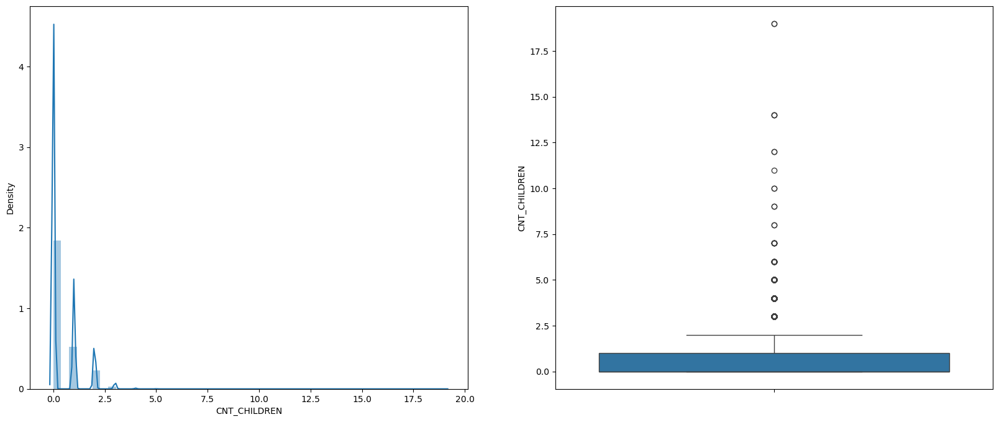

In [43]:
plt.subplots(1,2 ,figsize = (20,8))
plt.subplot(121)
sns.distplot(df['CNT_CHILDREN'])
plt.subplot(122)
sns.boxplot(df['CNT_CHILDREN'])
plt.show()

* We can clearly see in distplot data is not evenly distributed it is completely right skewed, and in the boxplot we can see the outliers very clearly

Using percentile method to remove the outliers

In [44]:
upper_limit=df['CNT_CHILDREN'].quantile(0.99)
lower_limit=df['CNT_CHILDREN'].quantile(0.1)
print(upper_limit)
print(lower_limit)

3.0
0.0


Capping involves changing the outliers' values to the upper or lower limit. By capping the values instead of trimming them, we can avoid data loss.

In [45]:
df.loc[df['CNT_CHILDREN']>upper_limit,'CNT_CHILDREN']=upper_limit
df.loc[df['CNT_CHILDREN']<lower_limit,'CNT_CHILDREN']=lower_limit

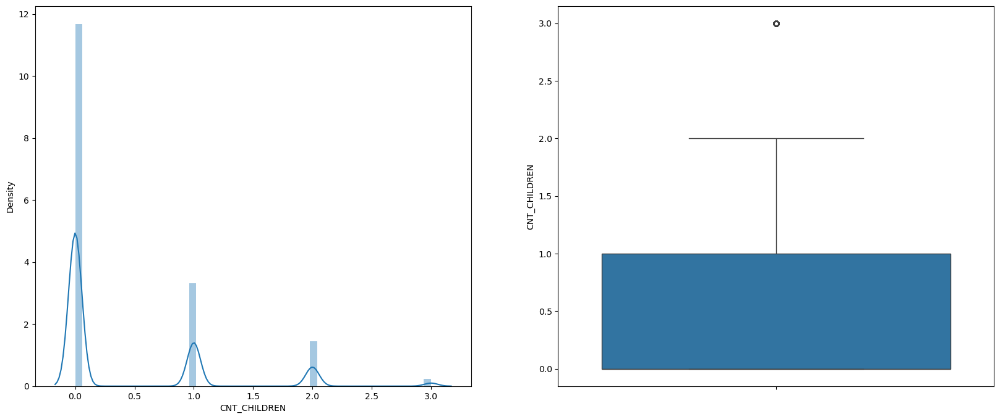

In [46]:
plt.subplots(1,2 ,figsize = (20,8))
plt.subplot(121)
sns.distplot(df['CNT_CHILDREN'])
plt.subplot(122)
sns.boxplot(df['CNT_CHILDREN'])
plt.show()

In [47]:
df['CNT_CHILDREN'].describe()

count    304531.000000
mean          0.414473
std           0.707191
min           0.000000
25%           0.000000
50%           0.000000
75%           1.000000
max           3.000000
Name: CNT_CHILDREN, dtype: float64

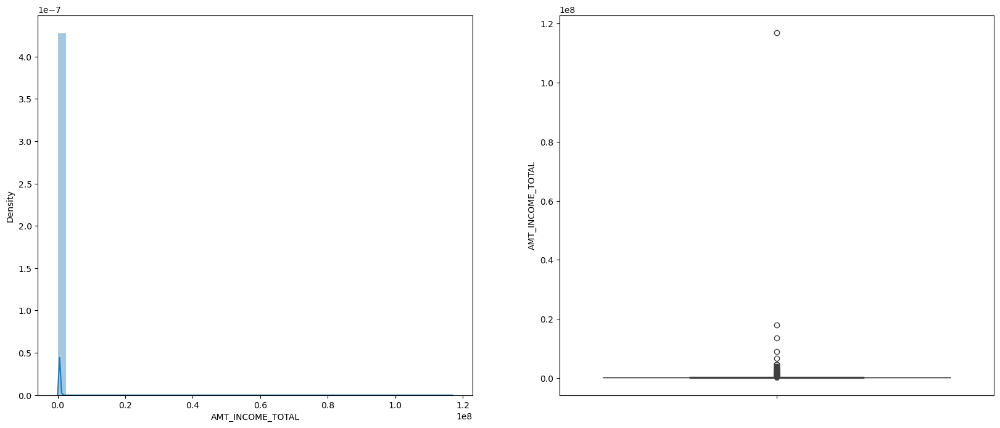

In [48]:
plt.subplots(1,2 ,figsize = (20,8))
plt.subplot(121)
sns.distplot(df['AMT_INCOME_TOTAL'])
plt.subplot(122)
sns.boxplot(df['AMT_INCOME_TOTAL'])
plt.show()

## AMT_INCOME_TOTAL

In [49]:
df['AMT_INCOME_TOTAL'].describe(percentiles = [0.75,0.99,0.999])

count    3.045310e+05
mean     1.686634e+05
std      2.378910e+05
min      2.565000e+04
50%      1.476000e+05
75%      2.025000e+05
99%      4.545000e+05
99.9%    9.000000e+05
max      1.170000e+08
Name: AMT_INCOME_TOTAL, dtype: float64

Maximum percentage of data lies within 900000 that means anything greater than this is an outlier

Using Z-score method to remove the outliers

In [50]:
upper_limit=df['AMT_INCOME_TOTAL'].mean()+3*df['AMT_INCOME_TOTAL'].std()
lower_limit=df['AMT_INCOME_TOTAL'].mean()-3*df['AMT_INCOME_TOTAL'].std()
print(upper_limit)
print(lower_limit)

882336.4284486697
-545009.5358204317


Capping the outliers in column AMT_INCOME_TOTAL

In [51]:
df.loc[df['AMT_INCOME_TOTAL']>upper_limit,'AMT_INCOME_TOTAL']=upper_limit
df.loc[df['AMT_INCOME_TOTAL']<lower_limit,'AMT_INCOME_TOTAL']=lower_limit

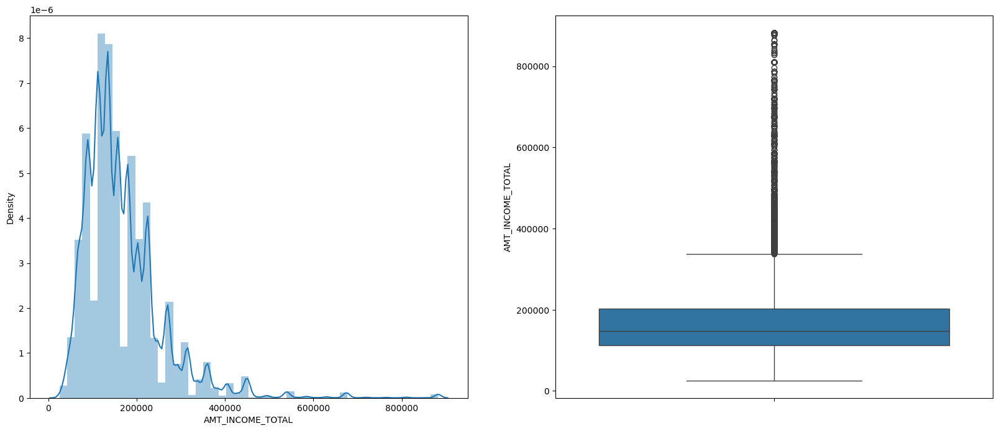

In [52]:
plt.subplots(1,2 ,figsize = (20,8))
plt.subplot(121)
sns.distplot(df['AMT_INCOME_TOTAL'])
plt.subplot(122)
sns.boxplot(df['AMT_INCOME_TOTAL'])
plt.show()

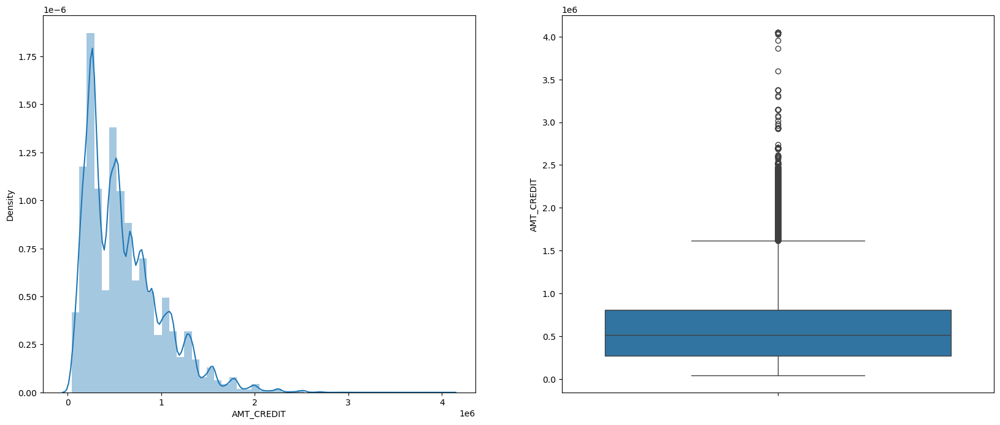

In [53]:
plt.subplots(1,2 ,figsize = (20,8))
plt.subplot(121)
sns.distplot(df['AMT_CREDIT'])
plt.subplot(122)
sns.boxplot(df['AMT_CREDIT'])
plt.show()

## AMT_CREDIT

In [54]:
df['AMT_CREDIT'].describe()

count    3.045310e+05
mean     5.995592e+05
std      4.021453e+05
min      4.500000e+04
25%      2.700000e+05
50%      5.172660e+05
75%      8.086500e+05
max      4.050000e+06
Name: AMT_CREDIT, dtype: float64

In [55]:
upper_limit=df['AMT_CREDIT'].quantile(0.99)
lower_limit=df['AMT_CREDIT'].quantile(0.1)
print(upper_limit)
print(lower_limit)

1845000.0
180000.0


In [56]:
df.loc[df['AMT_CREDIT']>upper_limit,'AMT_CREDIT']=upper_limit
df.loc[df['AMT_CREDIT']<lower_limit,'AMT_CREDIT']=lower_limit

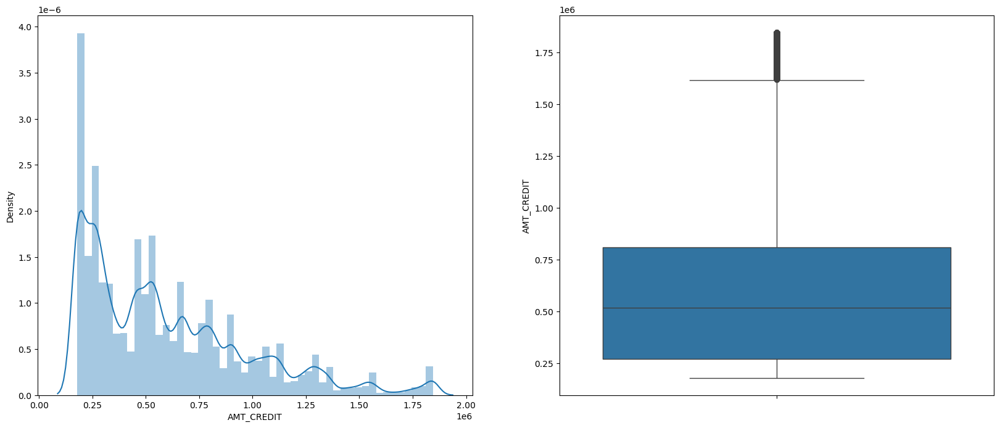

In [57]:
plt.subplots(1,2 ,figsize = (20,8))
plt.subplot(121)
sns.distplot(df['AMT_CREDIT'])
plt.subplot(122)
sns.boxplot(df['AMT_CREDIT'])
plt.show()

## AMT_ANNUITY

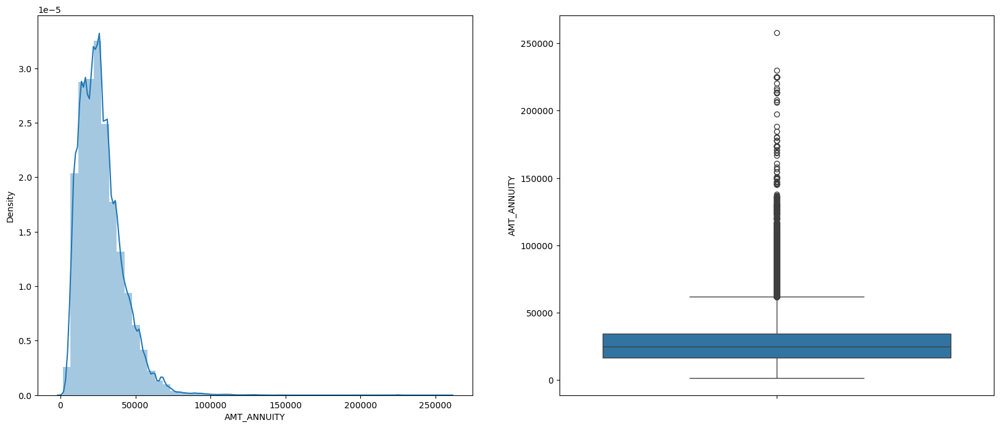

In [58]:
plt.subplots(1,2 ,figsize = (20,8))
plt.subplot(121)
sns.distplot(df['AMT_ANNUITY'])
plt.subplot(122)
sns.boxplot(df['AMT_ANNUITY'])
plt.show()

In [59]:
upper_limit=df['AMT_ANNUITY'].quantile(0.99)
lower_limit=df['AMT_ANNUITY'].quantile(0.1)
print(upper_limit)
print(lower_limit)

70015.5
11101.5


In [60]:
df.loc[df['AMT_ANNUITY']>upper_limit,'AMT_ANNUITY']=upper_limit
df.loc[df['AMT_ANNUITY']<lower_limit,'AMT_ANNUITY']=lower_limit

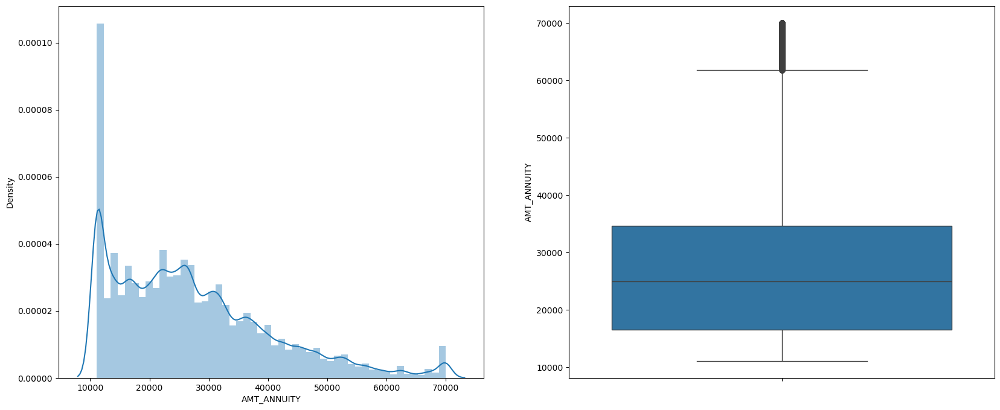

In [61]:
plt.subplots(1,2 ,figsize = (20,8))
plt.subplot(121)
sns.distplot(df['AMT_ANNUITY'])
plt.subplot(122)
sns.boxplot(df['AMT_ANNUITY'])
plt.show()

## AMT_GOODS_PRICE

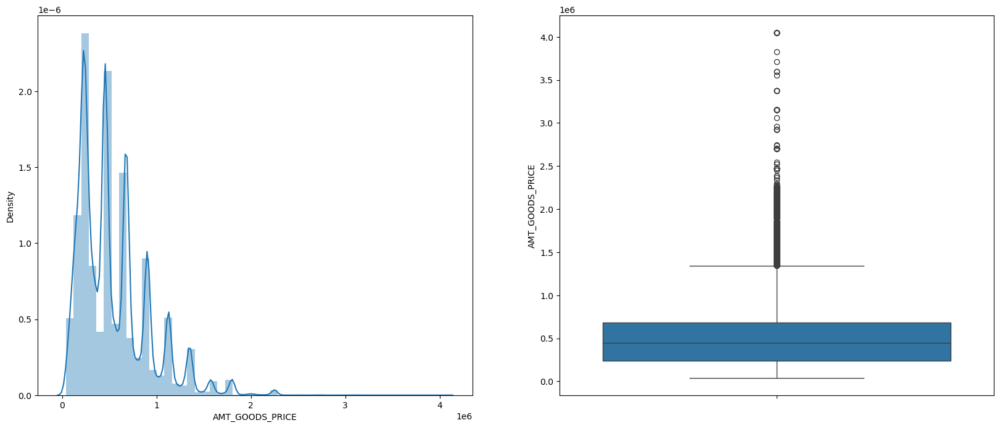

In [62]:
plt.subplots(1,2 ,figsize = (20,8))
plt.subplot(121)
sns.distplot(df['AMT_GOODS_PRICE'])
plt.subplot(122)
sns.boxplot(df['AMT_GOODS_PRICE'])
plt.show()

In [63]:
upper_limit=df['AMT_GOODS_PRICE'].quantile(0.99)
lower_limit=df['AMT_GOODS_PRICE'].quantile(0.1)
print(upper_limit)
print(lower_limit)

1800000.0
180000.0


In [64]:
df.loc[df['AMT_GOODS_PRICE']>upper_limit,'AMT_GOODS_PRICE']=upper_limit
df.loc[df['AMT_GOODS_PRICE']<lower_limit,'AMT_GOODS_PRICE']=lower_limit

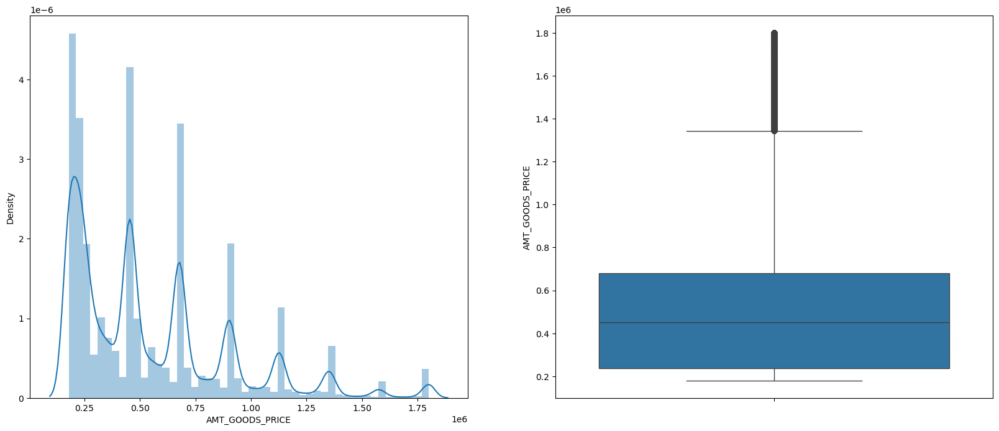

In [65]:
plt.subplots(1,2 ,figsize = (20,8))
plt.subplot(121)
sns.distplot(df['AMT_GOODS_PRICE'])
plt.subplot(122)
sns.boxplot(df['AMT_GOODS_PRICE'])
plt.show()

## Checking the Data imbalance 

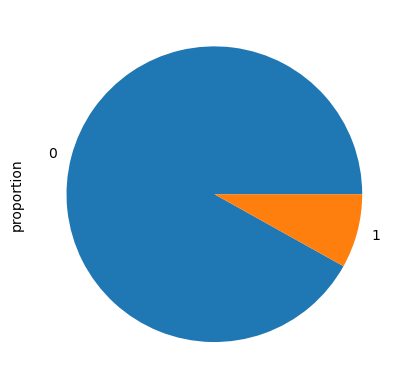

In [66]:
df['TARGET'].value_counts(normalize='TRUE').plot.pie()
plt.show()

In [67]:
df.TARGET.value_counts(normalize='TRUE')*100

TARGET
0    91.900004
1     8.099996
Name: proportion, dtype: float64

## Data imbalance ratio 

* Data imbalance ratio is approximately 20:1 which means we have 20 sample of customer payment on time in comparison of 1 sample of customer facing payment difficulty

## Drop Unnecessary columns

In [68]:
df.drop(columns=['FLAG_DOCUMENT_2','FLAG_DOCUMENT_3','FLAG_DOCUMENT_4','FLAG_DOCUMENT_5','FLAG_DOCUMENT_6','FLAG_DOCUMENT_7','FLAG_DOCUMENT_8','FLAG_DOCUMENT_9','FLAG_DOCUMENT_10'],inplace=True)

In [69]:
df.drop(columns=['FLAG_DOCUMENT_11','FLAG_DOCUMENT_12','FLAG_DOCUMENT_13','FLAG_DOCUMENT_14','FLAG_DOCUMENT_15','FLAG_DOCUMENT_16','FLAG_DOCUMENT_17','FLAG_DOCUMENT_18','FLAG_DOCUMENT_19','FLAG_DOCUMENT_20','FLAG_DOCUMENT_21'],inplace=True)

In [70]:
df.nunique().head

<bound method NDFrame.head of SK_ID_CURR                     304531
TARGET                              2
NAME_CONTRACT_TYPE                  2
CODE_GENDER                         2
FLAG_OWN_CAR                        2
FLAG_OWN_REALTY                     2
CNT_CHILDREN                        4
AMT_INCOME_TOTAL                 2453
AMT_CREDIT                       4862
AMT_ANNUITY                     10803
AMT_GOODS_PRICE                   822
NAME_TYPE_SUITE                     7
NAME_INCOME_TYPE                    8
NAME_EDUCATION_TYPE                 5
NAME_FAMILY_STATUS                  5
NAME_HOUSING_TYPE                   6
REGION_POPULATION_RELATIVE         81
DAYS_BIRTH                         50
DAYS_EMPLOYED                      50
DAYS_REGISTRATION                  66
DAYS_ID_PUBLISH                  6167
FLAG_MOBIL                          1
FLAG_EMP_PHONE                      2
FLAG_WORK_PHONE                     2
FLAG_CONT_MOBILE                    2
FLAG_PHONE          

## Split the data into two parts one with payment difficult and other one with payment on time

In [71]:
df_true=df[df['TARGET']==1]
df_false=df[df['TARGET']==0]

## UNIVARIATE ANALYSIS

## Analysing CODE_GENDER 

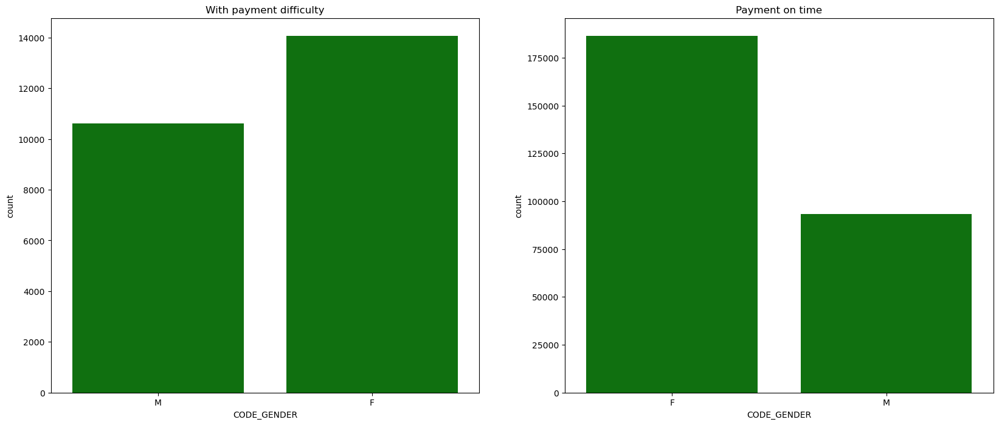

In [72]:
plt.subplots(1,2,figsize=(20,8))
plt.subplot(1,2,1)
sns.countplot(x='CODE_GENDER',data=df_true,color='green')
plt.title('With payment difficulty')
plt.subplot(1,2,2)
sns.countplot(x='CODE_GENDER',data=df_false,color='green')
plt.title('Payment on time')
plt.show()

In [73]:
df.groupby('CODE_GENDER')['TARGET'].value_counts(normalize='True')*100

CODE_GENDER  TARGET
F            0         92.985545
             1          7.014455
M            0         89.808256
             1         10.191744
Name: proportion, dtype: float64

* Female applicants outnumber male applicants. The percentage of male applicants with payment difficulty is around 10%, while that of females is 7%. There is not much difference in the percentage of payment difficulties based on gender; it's almost the same.

## OCCUPATION_TYPE

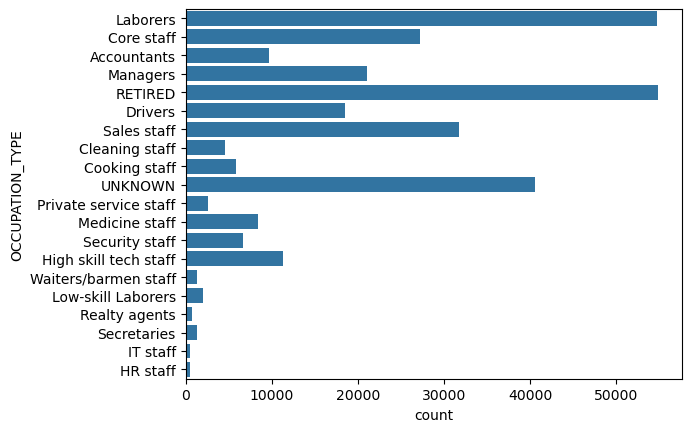

In [74]:
sns.countplot(df['OCCUPATION_TYPE'])
plt.show()

* Laborers are in maximum number followed by retired applicants 

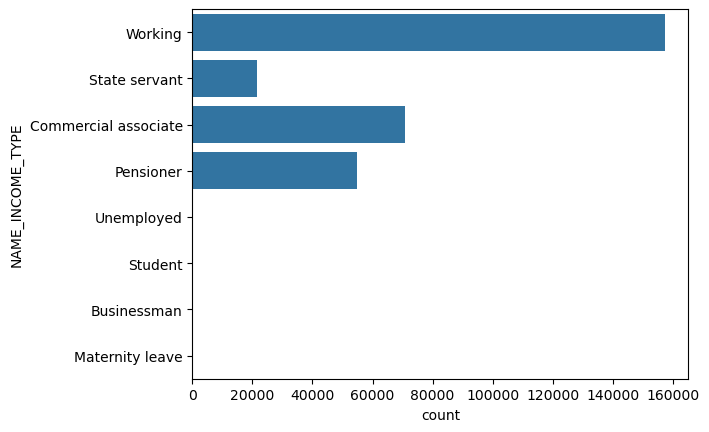

In [75]:
sns.countplot(df['NAME_INCOME_TYPE'])
plt.show()

* Working are maximum in count followed by commercial associate.

## BIVARIATE ANALYSIS

## Analysis between OCCUPATION_TYPE and CODE_GENDER

<Axes: xlabel='OCCUPATION_TYPE'>

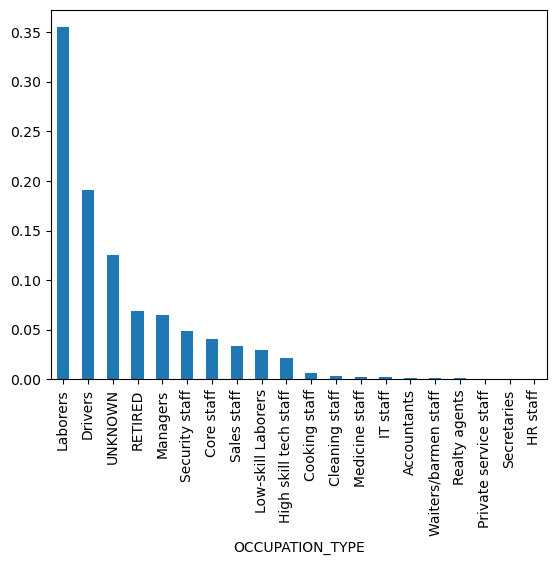

In [76]:
df_income_occup_diff = df[(df['TARGET'] == 1) & (df['CODE_GENDER'] == 'M')]
df_income_occup_diff.OCCUPATION_TYPE.value_counts(normalize='TRUE').plot.bar()

* Male with occupations as laborers and drivers are facing more payment difficulty

<Axes: xlabel='OCCUPATION_TYPE'>

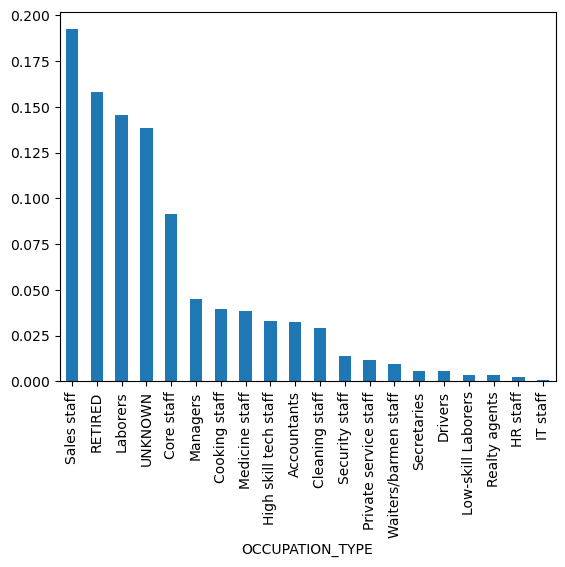

In [77]:
df_income_occup_diff = df[(df['TARGET'] == 1) & (df['CODE_GENDER'] == 'F')]
df_income_occup_diff.OCCUPATION_TYPE.value_counts(normalize='TRUE').plot.bar()

* Female with occupations as Sales staff and Retired are facing more payment difficulty

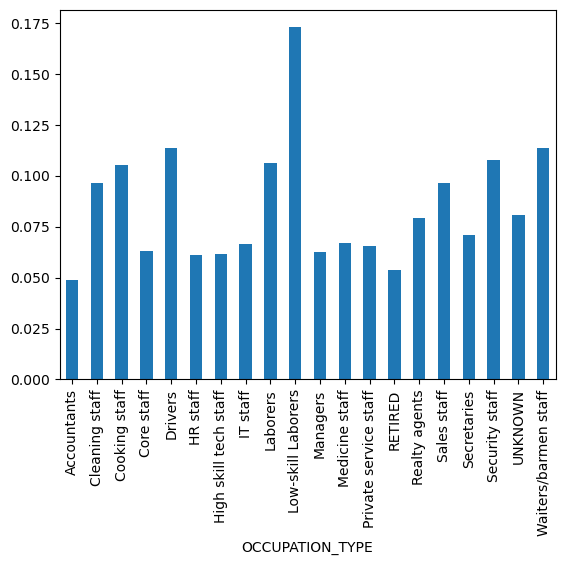

In [78]:
df.groupby('OCCUPATION_TYPE')['TARGET'].mean().plot.bar()
plt.show()

* Low-skill laborers are having highest percentage of payment difficulty followed by Drivers, Waiters/Barmen staff,laborers and security staff.

## Analysis between NAME_CONTRACT_TYPE and TARGET column

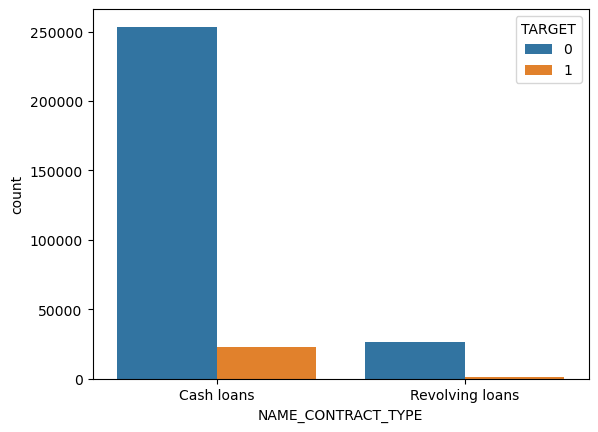

In [79]:
sns.countplot(data=df,x='NAME_CONTRACT_TYPE',hue='TARGET')
plt.show()

In [80]:
df.groupby('NAME_CONTRACT_TYPE')['TARGET'].value_counts(normalize='True')*100

NAME_CONTRACT_TYPE  TARGET
Cash loans          0         91.640668
                    1          8.359332
Revolving loans     0         94.469518
                    1          5.530482
Name: proportion, dtype: float64

* There is not much percentage difference between cash loans and revolving loans regarding payment difficulties. In cash loans, 8% of customers experience payment difficulties, while in revolving loans, there are 5%.

## Analysing OCCUPATION_TYPE vs FLAG_OWN_CAR 

<Axes: xlabel='OCCUPATION_TYPE'>

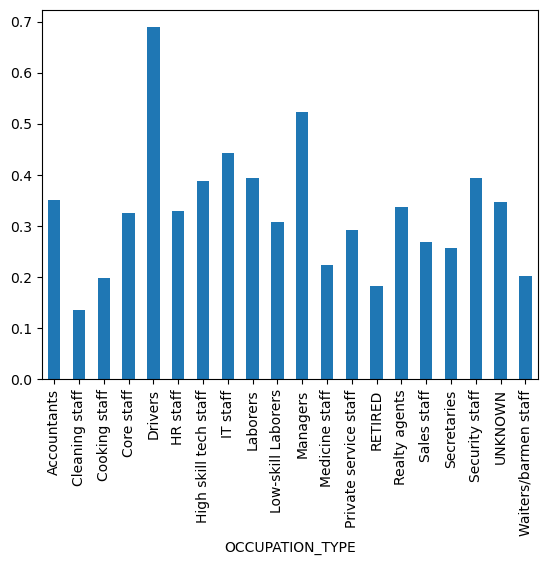

In [81]:
df['FLAG_OWN_CAR'] = df['FLAG_OWN_CAR'].apply(lambda x: 1 if x == 'Y' else 0)
df.groupby('OCCUPATION_TYPE')['FLAG_OWN_CAR'].mean().plot.bar()

## Analysis between FLAG_OWN_REALTY and OCCUPATION_TYPE

<Axes: xlabel='OCCUPATION_TYPE'>

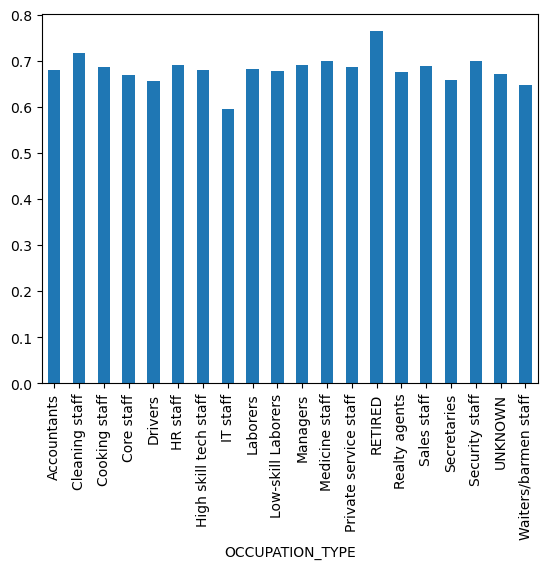

In [82]:
df['FLAG_OWN_REALTY'] = df['FLAG_OWN_REALTY'].apply(lambda x: 1 if x == 'Y' else 0)
df.groupby('OCCUPATION_TYPE')['FLAG_OWN_REALTY'].mean().plot.bar()

* Maximum number of customers owns the house

## Analysis FLAG_OWN_CAR vs FLAG_OWN_REALTY vs TARGET

In [83]:
df.groupby(['FLAG_OWN_CAR','FLAG_OWN_REALTY'])['TARGET'].value_counts(normalize='True')*100

FLAG_OWN_CAR  FLAG_OWN_REALTY  TARGET
0             0                0         90.946859
                               1          9.053141
              1                0         91.702857
                               1          8.297143
1             0                0         92.923058
                               1          7.076942
              1                0         92.642271
                               1          7.357729
Name: proportion, dtype: float64

* FLAG_OWN_CAR and FLAG_OWN_REALTY have not much effect on payment difficulties

## Analysis NAME_INCOME_TYPE vs TARGET

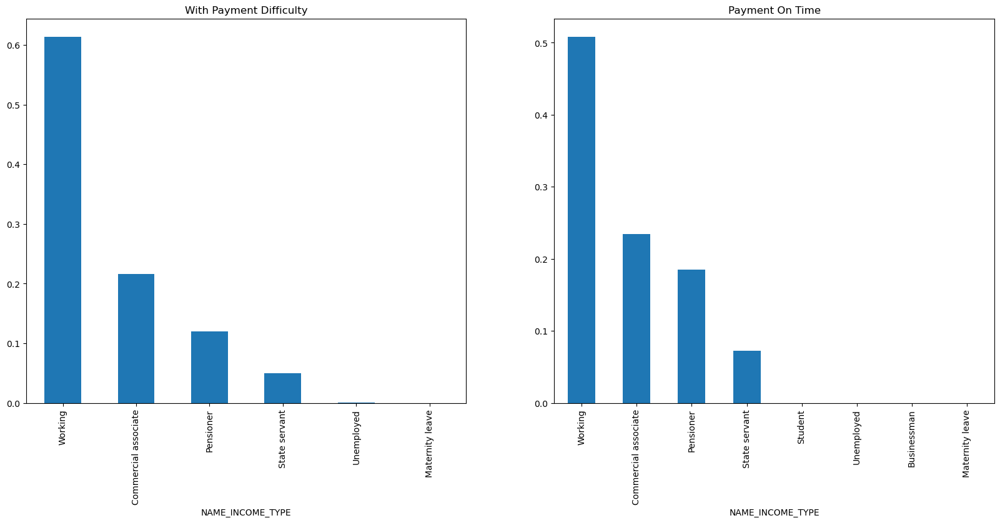

In [84]:
plt.subplots(1,2,figsize=(20,8))
plt.subplot(1,2,1)
df_true['NAME_INCOME_TYPE'].value_counts(normalize=True).plot.bar()
plt.title('With Payment Difficulty')

plt.subplot(1,2,2)
df_false['NAME_INCOME_TYPE'].value_counts(normalize=True).plot.bar()
plt.title('Payment On Time')
plt.show()

* Pensioners and commercial associates mostly make payments on time. Customers from the working class face the highest payment difficulties. Customers with income types such as businessmen, unemployed individuals, students, and those on maternity leave have zero instances of making payments on time, but their numbers are few; hence, they show weak correlation.

## Analysis CNT_CHILDREN vs TARGET

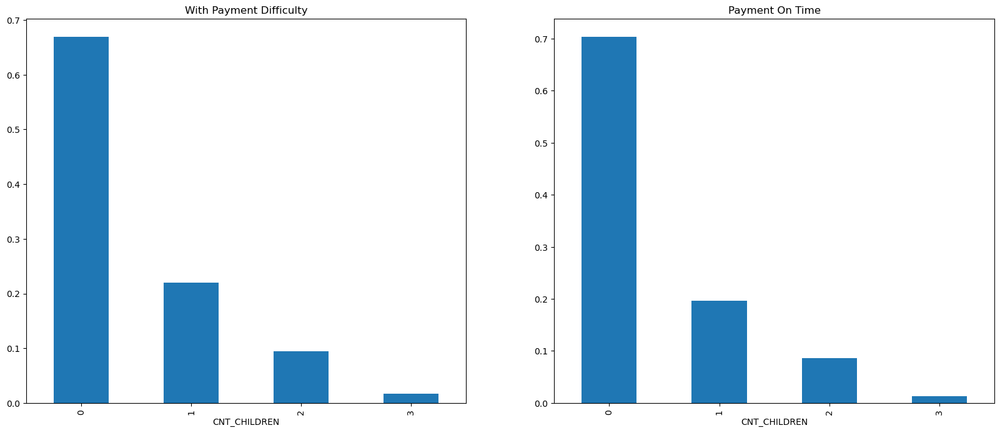

In [85]:
plt.subplots(1,2,figsize=(20,8))
plt.subplot(1,2,1)
df_true['CNT_CHILDREN'].value_counts(normalize=True).plot.bar()
plt.title('With Payment Difficulty')
plt.subplot(1,2,2)
df_false['CNT_CHILDREN'].value_counts(normalize=True).plot.bar()
plt.title('Payment On Time')
plt.show()

* Count of childern has not much effect on payment difficulties

## Analysis 'NAME_EDUCATION_TYPE vs TARGET

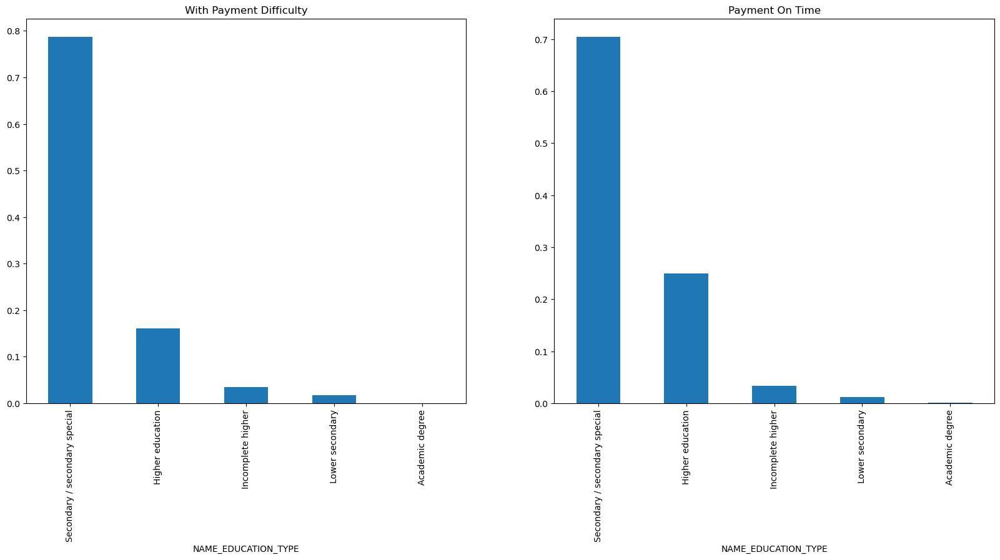

In [86]:
plt.subplots(1,2,figsize=(20,8))
plt.subplot(1,2,1)
df_true['NAME_EDUCATION_TYPE'].value_counts(normalize=True).plot.bar()
plt.title('With Payment Difficulty')
plt.xticks(rotation=90)
plt.subplot(1,2,2)
df_false['NAME_EDUCATION_TYPE'].value_counts(normalize=True).plot.bar()
plt.title('Payment On Time')
plt.xticks(rotation=90)
plt.show()

* Customer with Higher education has done maximum number of payments on time

## Analysis NAME_FAMILY_STATUS vs TARGET

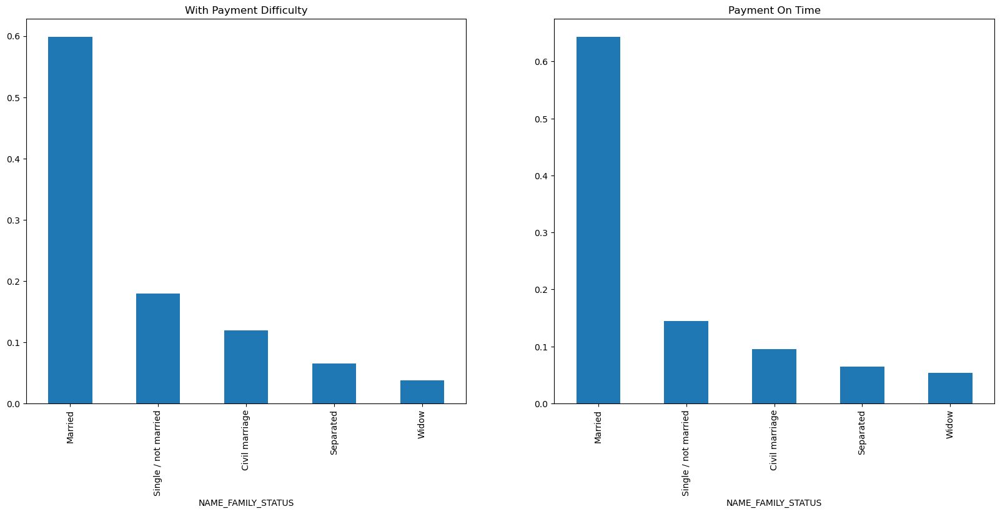

In [87]:
plt.subplots(1,2,figsize=(20,8))
plt.subplot(1,2,1)
df_true['NAME_FAMILY_STATUS'].value_counts(normalize=True).plot.bar()
plt.title('With Payment Difficulty')
plt.subplot(1,2,2)
df_false['NAME_FAMILY_STATUS'].value_counts(normalize=True).plot.bar()
plt.title('Payment On Time')
plt.show()

* Singles or those not married are facing payment difficulties. Among married individuals, around 59% are facing payment difficulties, while 63% are making payments on time.

## Analysis NAME_HOUSING_TYPE vs TARGET

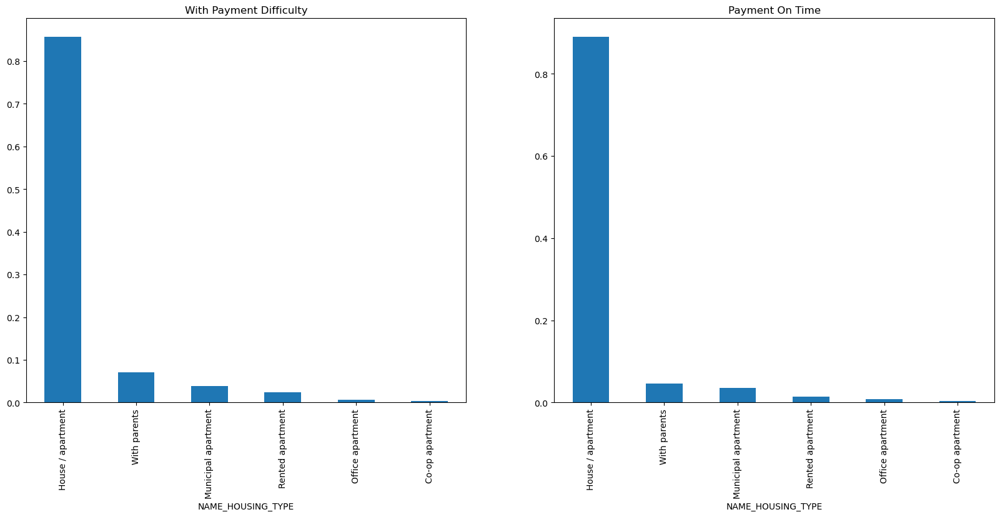

In [88]:
plt.subplots(1,2,figsize=(20,8))
plt.subplot(1,2,1)
df_true['NAME_HOUSING_TYPE'].value_counts(normalize=True).plot.bar()
plt.title('With Payment Difficulty')
plt.subplot(1,2,2)
df_false['NAME_HOUSING_TYPE'].value_counts(normalize=True).plot.bar()
plt.title('Payment On Time')
plt.show()

* Customers With parents are not doing payments on time

## SEGMENTED NUMERIC BIVARIATE ANALYSIS

## Income_Bins

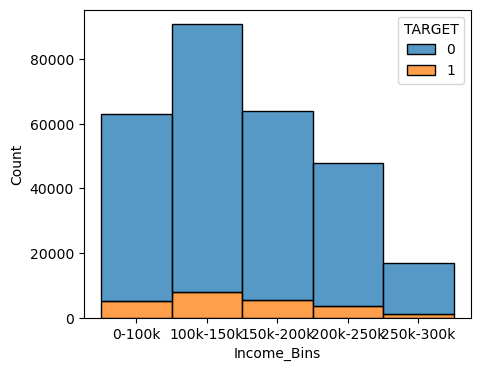

In [89]:
bins = [0, 100000, 150000, 200000, 250000, 300000]
# Create bin labels
bin_labels = ['0-100k', '100k-150k', '150k-200k', '200k-250k', '250k-300k']
# Bin the data using pd.cut
df['Income_Bins'] = pd.cut(df['AMT_INCOME_TOTAL'], bins=bins, labels=bin_labels)
# Print the resulting DataFrame to verify
# Plotting the histogram of the binned data
plt.figure(figsize=(5, 4))
sns.histplot(data=df,x='Income_Bins',hue='TARGET',multiple='stack')
plt.show()

In [90]:
## split Target into two parts
df_true=df[df['TARGET']==1]
df_false=df[df['TARGET']==0]

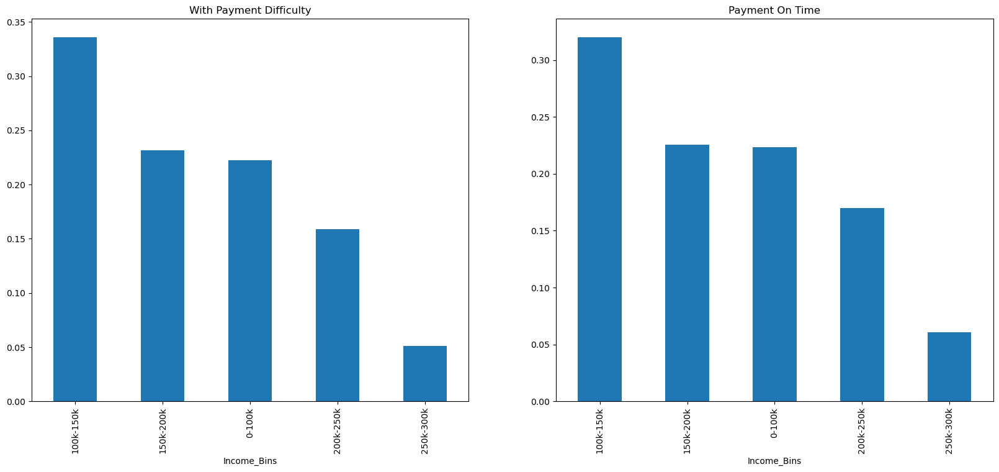

In [91]:
plt.subplots(1,2,figsize=(20,8))
plt.subplot(1,2,1)
df_true['Income_Bins'].value_counts(normalize=True).plot.bar()
plt.title('With Payment Difficulty')
plt.subplot(1,2,2)
df_false['Income_Bins'].value_counts(normalize=True).plot.bar()
plt.title('Payment On Time')
plt.show()

* As the customers income increases percentage of difficulty in payments decreases.

## CREDIT_Bins

In [92]:
df['AMT_CREDIT'].max()

1845000.0

In [93]:
df['AMT_CREDIT'].min()

180000.0

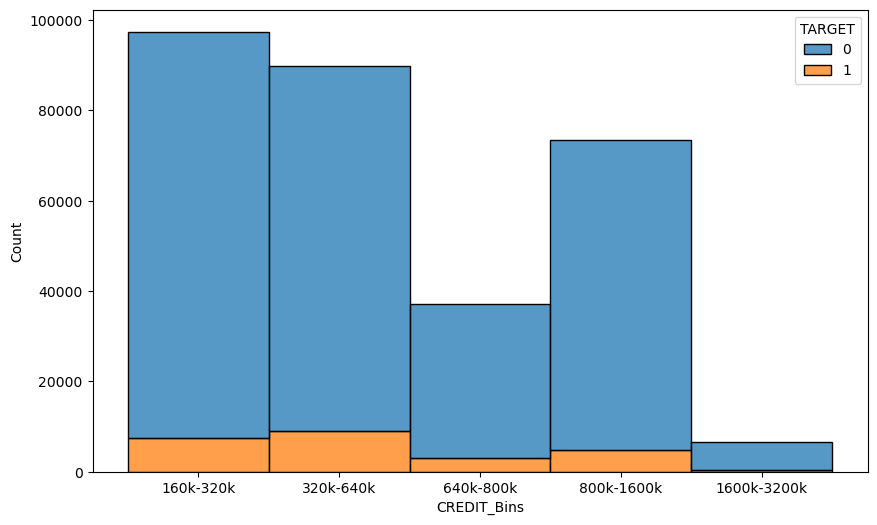

In [94]:
bins = [ 160000, 320000, 640000, 800000,1600000,3200000]
# Create bin labels
bin_labels = [ '160k-320k', '320k-640k', '640k-800k','800k-1600k', '1600k-3200k']
# Bin the data using pd.cut
df['CREDIT_Bins'] = pd.cut(df['AMT_CREDIT'], bins=bins, labels=bin_labels)
# Print the resulting DataFrame to verify
# Plotting the histogram of the binned data
plt.figure(figsize=(10, 6))
sns.histplot(data=df,x='CREDIT_Bins',hue='TARGET',multiple='stack')
plt.show()

* Maximum number of customers with payment difficulty lies in the range of 320k-640k.Customer in the range 1600k-3200k are having very less percetange of payment difficulty,And also customers withe credits greater than 640k are doing there payments on time

## ANNUITY_Bins

In [95]:
df['AMT_ANNUITY'].value_counts()

AMT_ANNUITY
11101.5    30481
13500.0     5288
70015.5     3048
37800.0     1602
26217.0     1449
           ...  
56295.0        1
50935.5        1
55768.5        1
58306.5        1
58770.0        1
Name: count, Length: 10803, dtype: int64

In [96]:
df['AMT_ANNUITY'].max()

70015.5

In [97]:
df['AMT_ANNUITY'].min()

11101.5

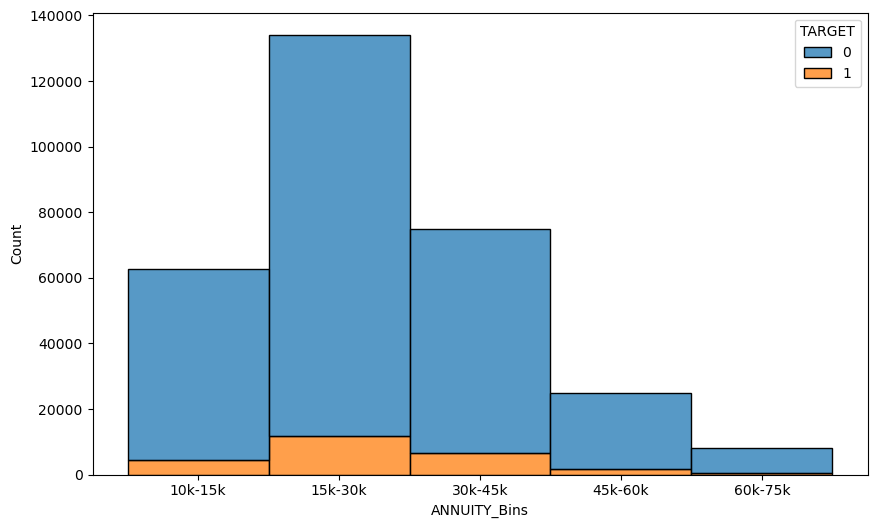

In [98]:
bins = [ 10000, 15000,30000 ,45000,60000,75000]
# Create bin labels
bin_labels = [ '10k-15k', '15k-30k', '30k-45k','45k-60k', '60k-75k']
# Bin the data using pd.cut
df['ANNUITY_Bins'] = pd.cut(df['AMT_ANNUITY'], bins=bins, labels=bin_labels)
# Print the resulting DataFrame to verify
# Plotting the histogram of the binned data
plt.figure(figsize=(10, 6))
sns.histplot(data=df,x='ANNUITY_Bins',hue='TARGET',multiple='stack')
plt.show()

* Customers Annuity in the range of 15k-30k are doing their payments on time

## AGE_Bins

In [99]:
## Days_birth column is negative and age is given in no. of days we have converted it into positive and age inte years

In [100]:
df[df['DAYS_BIRTH']>0].head(2)

,SK_ID_CURR,TARGET,NAME_CONTRACT_TYPE,CODE_GENDER,FLAG_OWN_CAR,FLAG_OWN_REALTY,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT,AMT_ANNUITY,AMT_GOODS_PRICE,NAME_TYPE_SUITE,NAME_INCOME_TYPE,NAME_EDUCATION_TYPE,NAME_FAMILY_STATUS,NAME_HOUSING_TYPE,REGION_POPULATION_RELATIVE,DAYS_BIRTH,DAYS_EMPLOYED,DAYS_REGISTRATION,DAYS_ID_PUBLISH,FLAG_MOBIL,FLAG_EMP_PHONE,FLAG_WORK_PHONE,FLAG_CONT_MOBILE,FLAG_PHONE,FLAG_EMAIL,OCCUPATION_TYPE,CNT_FAM_MEMBERS,REGION_RATING_CLIENT,REGION_RATING_CLIENT_W_CITY,WEEKDAY_APPR_PROCESS_START,HOUR_APPR_PROCESS_START,REG_REGION_NOT_LIVE_REGION,REG_REGION_NOT_WORK_REGION,LIVE_REGION_NOT_WORK_REGION,REG_CITY_NOT_LIVE_CITY,REG_CITY_NOT_WORK_CITY,LIVE_CITY_NOT_WORK_CITY,ORGANIZATION_TYPE,EXT_SOURCE_2,EXT_SOURCE_3,OBS_30_CNT_SOCIAL_CIRCLE,DEF_30_CNT_SOCIAL_CIRCLE,OBS_60_CNT_SOCIAL_CIRCLE,DEF_60_CNT_SOCIAL_CIRCLE,DAYS_LAST_PHONE_CHANGE,AMT_REQ_CREDIT_BUREAU_HOUR,AMT_REQ_CREDIT_BUREAU_DAY,AMT_REQ_CREDIT_BUREAU_WEEK,AMT_REQ_CREDIT_BUREAU_MON,AMT_REQ_CREDIT_BUREAU_QRT,AMT_REQ_CREDIT_BUREAU_YEAR,Income_Bins,CREDIT_Bins,ANNUITY_Bins
0,100002,1,Cash loans,M,0,1,0,202500.0,406597.5,24700.5,351000.0,Unaccompanied,Working,Secondary / secondary special,Single / not married,House / apartment,0.018801,25,1,9,-2120,1,1,0,1,1,0,Laborers,1.0,2,2,WEDNESDAY,10,0,0,0,0,0,0,Business Entity Type 3,0.262949,0.139376,2.0,2.0,2.0,2.0,-1134.0,0.0,0.0,0.0,0.0,0.0,1.0,200k-250k,320k-640k,15k-30k
1,100003,0,Cash loans,F,0,0,0,270000.0,1293502.5,35698.5,1129500.0,Family,State servant,Higher education,Married,House / apartment,0.003541,45,3,3,-291,1,1,0,1,1,0,Core staff,2.0,1,1,MONDAY,11,0,0,0,0,0,0,School,0.622246,NaN,1.0,0.0,1.0,0.0,-828.0,0.0,0.0,0.0,0.0,0.0,0.0,250k-300k,800k-1600k,30k-45k


In [101]:
df['DAYS_BIRTH'].max()

69

In [102]:
df['DAYS_BIRTH'].min()

20

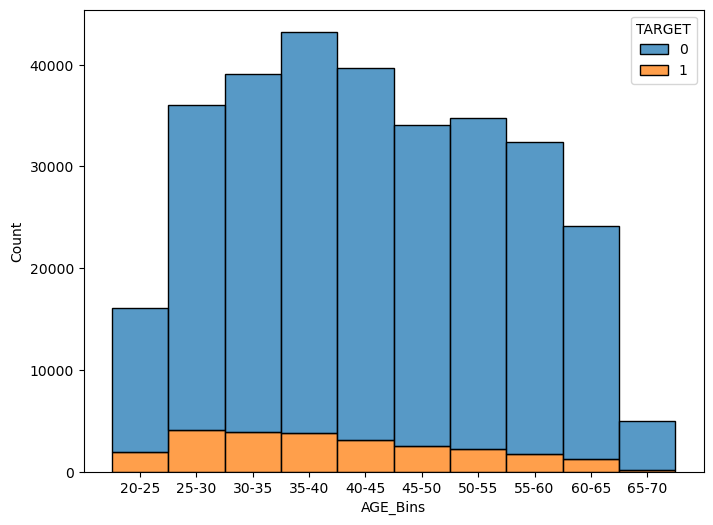

In [103]:
bins = [20,25 ,30,35, 40,45, 50,55, 60,65, 70]
# Create bin labels
bin_labels = ['20-25','25-30', '30-35','35-40', '40-45','45-50', '50-55','55-60', '60-65','65-70']
# Bin the data using pd.cut
df['AGE_Bins'] = pd.cut(df['DAYS_BIRTH'], bins=bins, labels=bin_labels)
# Print the resulting DataFrame to verify
# Plotting the histogram of the binned data
plt.figure(figsize=(8, 6))
sns.histplot(data=df,x='AGE_Bins',hue='TARGET',multiple='stack')
plt.show()

* Customer with age in the range of 35-40 are doing their payments on time,where as customers in the of 25-30 are facing difficulty doing payments on time.Age greater than 40, percentage of payment with difficulty decreases

## EMPLOYED_Bins

In [104]:
df['DAYS_EMPLOYED'].max()

49

In [105]:
df['DAYS_EMPLOYED'].min()

0

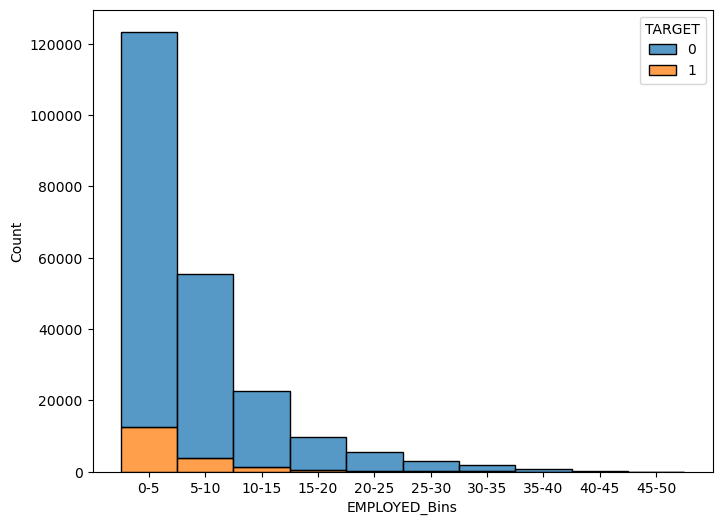

In [106]:
bins = [0,5,10,15,20,25,30,35,40,45,50]
# Create bin labels
bin_labels = ['0-5','5-10', '10-15','15-20', '20-25','25-30', '30-35','35-40', '40-45','45-50']
# Bin the data using pd.cut
df['EMPLOYED_Bins'] = pd.cut(df['DAYS_EMPLOYED'], bins=bins, labels=bin_labels)
# Print the resulting DataFrame to verify
# Plotting the histogram of the binned data
plt.figure(figsize=(8, 6))
sns.histplot(data=df,x='EMPLOYED_Bins',hue='TARGET',multiple='stack')
plt.show()

* Customer employed for less than 5 years are facing maximum number of payment difficulty.Customers employed for more than 10 years tend to higher chances of repaying loan on time

## AMT_GOODS_Bins

In [107]:
df['AMT_GOODS_PRICE'].max()

1800000.0

In [108]:
df['AMT_GOODS_PRICE'].min()

180000.0

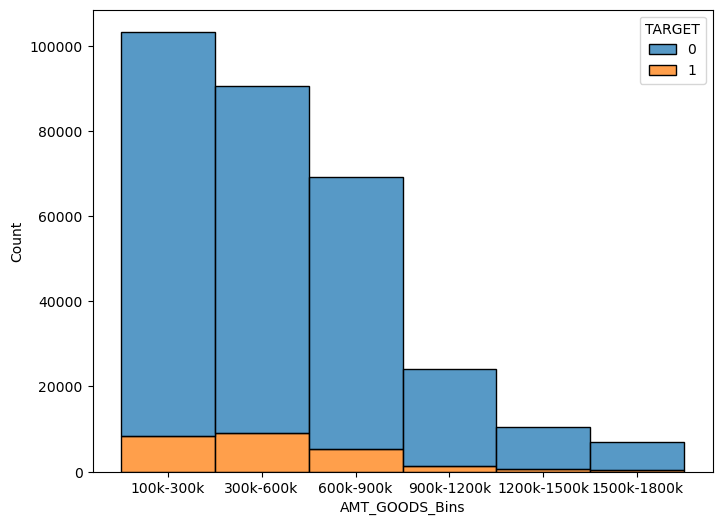

In [109]:
bins = [100000,300000,600000,900000,1200000,1500000,1800000]
# Create bin labels
bin_labels = ['100k-300k','300k-600k', '600k-900k','900k-1200k', '1200k-1500k','1500k-1800k']
# Bin the data using pd.cut
df['AMT_GOODS_Bins'] = pd.cut(df['AMT_GOODS_PRICE'], bins=bins, labels=bin_labels)
# Print the resulting DataFrame to verify
# Plotting the histogram of the binned data
plt.figure(figsize=(8, 6))
sns.histplot(data=df,x='AMT_GOODS_Bins',hue='TARGET',multiple='stack')
plt.show()

* Customer greater than 900k are facing less difficulty in payments, where as customers in the range of 300k-600k facing more payment difficulty

In [110]:
(df['AMT_REQ_CREDIT_BUREAU_HOUR'].value_counts(normalize='True')*100).head(2)

AMT_REQ_CREDIT_BUREAU_HOUR
0.0    99.390714
1.0     0.584231
Name: proportion, dtype: float64

In [111]:
(df['AMT_REQ_CREDIT_BUREAU_DAY'].value_counts(normalize='True')*100).head(2)

AMT_REQ_CREDIT_BUREAU_DAY
0.0    99.440064
1.0     0.486670
Name: proportion, dtype: float64

In [112]:
(df['AMT_REQ_CREDIT_BUREAU_WEEK'].value_counts(normalize='True')*100).head(3)

AMT_REQ_CREDIT_BUREAU_WEEK
0.0    96.774769
1.0     3.103374
2.0     0.074785
Name: proportion, dtype: float64

In [113]:
(df['AMT_REQ_CREDIT_BUREAU_MON'].value_counts(normalize='True')*100).head(4)

AMT_REQ_CREDIT_BUREAU_MON
0.0    83.494987
1.0    12.514853
2.0     2.025639
3.0     0.750884
Name: proportion, dtype: float64

In [114]:
(df['AMT_REQ_CREDIT_BUREAU_QRT'].value_counts(normalize='True')*100).head(4)

AMT_REQ_CREDIT_BUREAU_QRT
0.0    80.924976
1.0    12.785899
2.0     5.424356
3.0     0.645729
Name: proportion, dtype: float64

In [115]:
(df['AMT_REQ_CREDIT_BUREAU_YEAR'].value_counts(normalize='True')*100).head()

AMT_REQ_CREDIT_BUREAU_YEAR
0.0    26.800241
1.0    23.869594
2.0    18.924316
3.0    12.685680
4.0     7.814807
Name: proportion, dtype: float64

* A higher number of inquiries indicates that a person is seeking credit, which can impact their credit score and classify them as a high-risk borrower. Here, there are four columns containing information regarding the frequency of inquiries on a daily, weekly, monthly, and yearly basis. In all columns except for yearly, there isn't much observed distribution. Therefore, we will drop all columns except for the yearly inquiries.

In [116]:
df.drop(columns=['AMT_REQ_CREDIT_BUREAU_HOUR','AMT_REQ_CREDIT_BUREAU_DAY','AMT_REQ_CREDIT_BUREAU_WEEK','AMT_REQ_CREDIT_BUREAU_MON','AMT_REQ_CREDIT_BUREAU_MON','AMT_REQ_CREDIT_BUREAU_QRT'],inplace=True)

In [117]:
df['EXT_SOURCE_3'].value_counts()

EXT_SOURCE_3
0.746300    1442
0.713631    1297
0.694093    1266
0.670652    1179
0.652897    1144
            ... 
0.021492       1
0.019468       1
0.023062       1
0.014556       1
0.043227       1
Name: count, Length: 814, dtype: int64

In [118]:
df_true=df[df['TARGET']==1]
df_false=df[df['TARGET']==0]

## Correlation of customers with payment difficulty

In [119]:
numeric_df_true = df_true.select_dtypes(include=['number'])
categorical_df_true = df_true.select_dtypes(include=['category', 'object'])

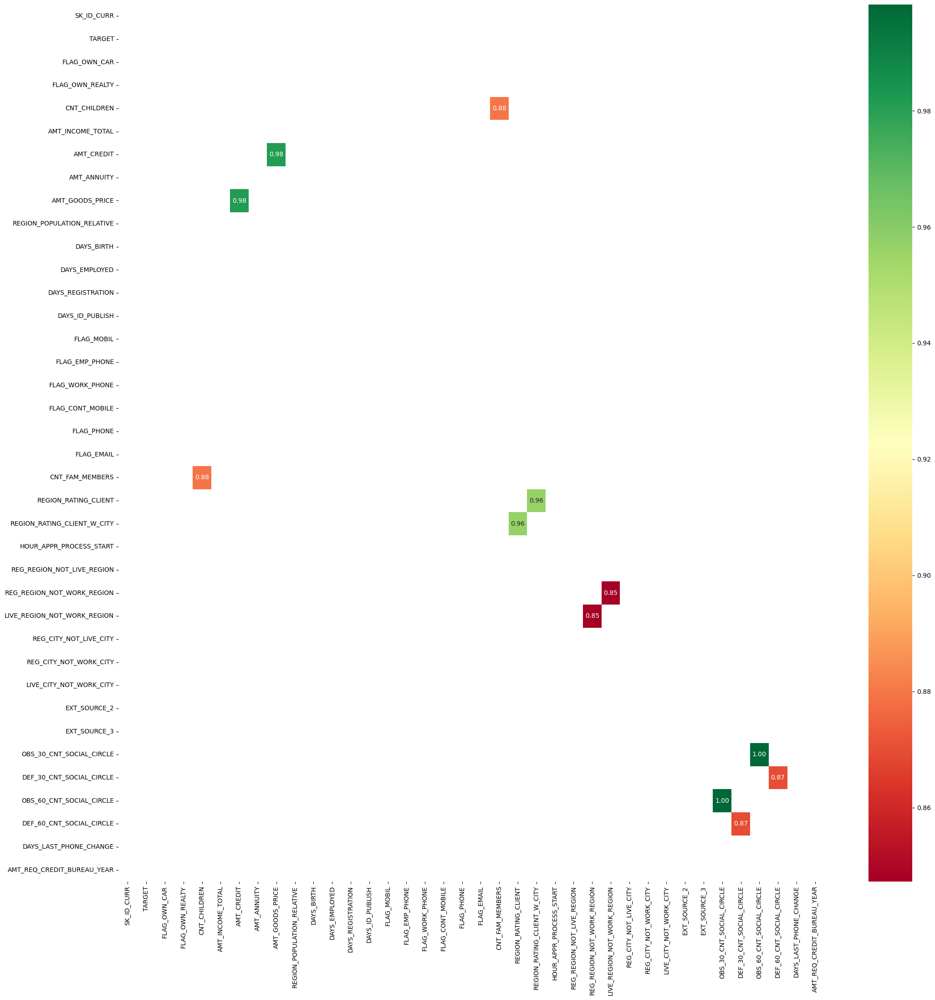

In [120]:
plt.figure(figsize=(25,25))
corr_true=numeric_df_true.corr()
sns.heatmap(data = corr_true[(corr_true >= 0.8) & (corr_true < 0.9999)], annot = True, cmap = "RdYlGn", cbar = True, fmt='.2f')
plt.show()

## Top 10 highly correlated columns with payment difficulty

In [121]:
corr_true[corr_true <= 0.99].unstack().sort_values(ascending = False).head(22)

AMT_CREDIT                   AMT_GOODS_PRICE                0.981604
AMT_GOODS_PRICE              AMT_CREDIT                     0.981604
REGION_RATING_CLIENT         REGION_RATING_CLIENT_W_CITY    0.956477
REGION_RATING_CLIENT_W_CITY  REGION_RATING_CLIENT           0.956477
CNT_CHILDREN                 CNT_FAM_MEMBERS                0.879487
CNT_FAM_MEMBERS              CNT_CHILDREN                   0.879487
DEF_30_CNT_SOCIAL_CIRCLE     DEF_60_CNT_SOCIAL_CIRCLE       0.869761
DEF_60_CNT_SOCIAL_CIRCLE     DEF_30_CNT_SOCIAL_CIRCLE       0.869761
REG_REGION_NOT_WORK_REGION   LIVE_REGION_NOT_WORK_REGION    0.847260
LIVE_REGION_NOT_WORK_REGION  REG_REGION_NOT_WORK_REGION     0.847260
LIVE_CITY_NOT_WORK_CITY      REG_CITY_NOT_WORK_CITY         0.778110
REG_CITY_NOT_WORK_CITY       LIVE_CITY_NOT_WORK_CITY        0.778110
AMT_ANNUITY                  AMT_CREDIT                     0.751563
AMT_CREDIT                   AMT_ANNUITY                    0.751563
AMT_GOODS_PRICE              AMT_A

## Correlation of customers doing payment on time

In [122]:
numeric_df_false = df_false.select_dtypes(include=['number'])
categorical_df_false = df_false.select_dtypes(include=['category', 'object'])

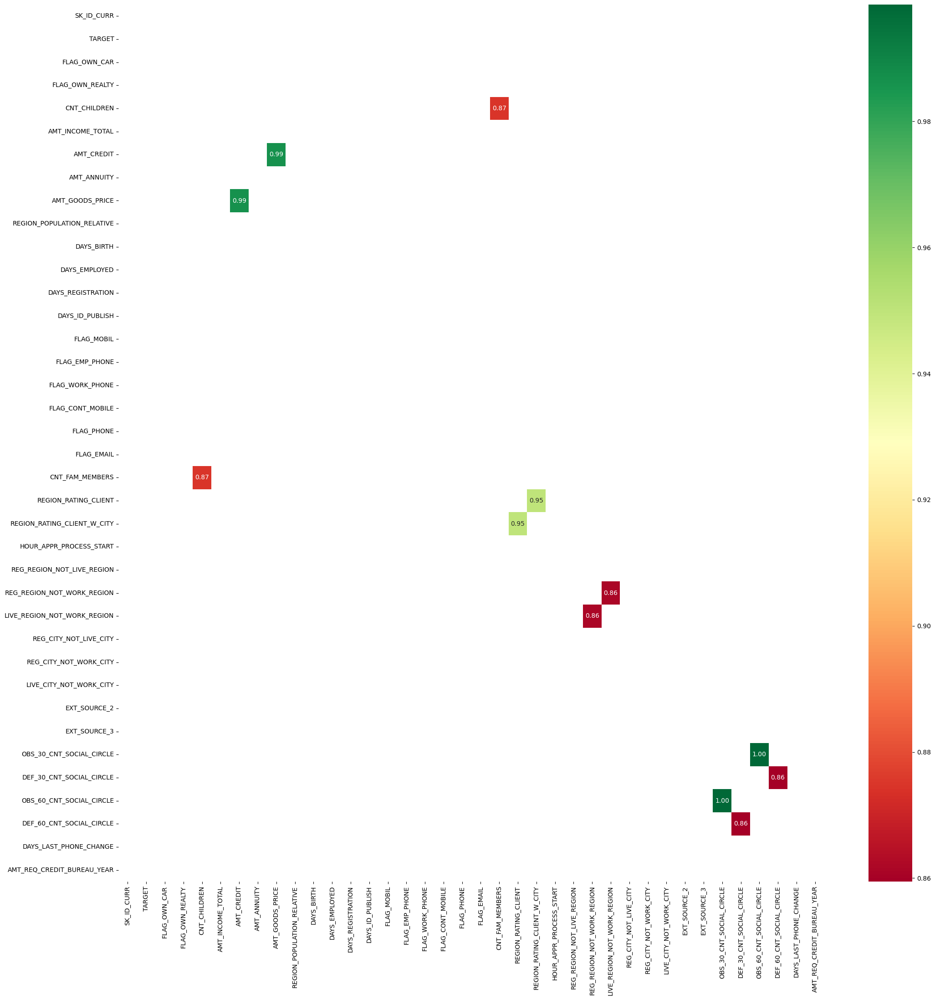

In [123]:
plt.figure(figsize=(25,25))
corr_false=numeric_df_false.corr()
sns.heatmap(data = corr_false[(corr_true >= 0.8) & (corr_false < 0.9999)], annot = True, cmap = "RdYlGn", cbar = True, fmt='.2f')
plt.show()

In [124]:
corr_false[corr_false <= 0.99].unstack().sort_values(ascending = False).head(22)

AMT_GOODS_PRICE              AMT_CREDIT                     0.986121
AMT_CREDIT                   AMT_GOODS_PRICE                0.986121
REGION_RATING_CLIENT_W_CITY  REGION_RATING_CLIENT           0.949905
REGION_RATING_CLIENT         REGION_RATING_CLIENT_W_CITY    0.949905
CNT_FAM_MEMBERS              CNT_CHILDREN                   0.874151
CNT_CHILDREN                 CNT_FAM_MEMBERS                0.874151
LIVE_REGION_NOT_WORK_REGION  REG_REGION_NOT_WORK_REGION     0.861303
REG_REGION_NOT_WORK_REGION   LIVE_REGION_NOT_WORK_REGION    0.861303
DEF_30_CNT_SOCIAL_CIRCLE     DEF_60_CNT_SOCIAL_CIRCLE       0.859458
DEF_60_CNT_SOCIAL_CIRCLE     DEF_30_CNT_SOCIAL_CIRCLE       0.859458
LIVE_CITY_NOT_WORK_CITY      REG_CITY_NOT_WORK_CITY         0.830488
REG_CITY_NOT_WORK_CITY       LIVE_CITY_NOT_WORK_CITY        0.830488
AMT_ANNUITY                  AMT_GOODS_PRICE                0.786046
AMT_GOODS_PRICE              AMT_ANNUITY                    0.786046
AMT_ANNUITY                  AMT_C

## AMT_CREDIT vs  AMT_GOODS_PRICE 

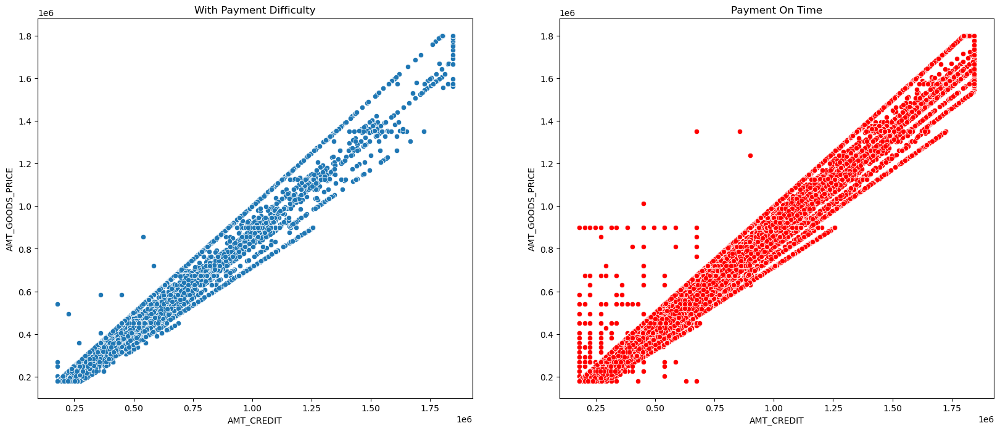

In [125]:
plt.subplots(1,2,figsize=(20,8))
plt.subplot(1,2,1)
sns.scatterplot(x='AMT_CREDIT',y='AMT_GOODS_PRICE',data=df_true)
plt.title('With Payment Difficulty')

plt.subplot(1,2,2)
sns.scatterplot(x='AMT_CREDIT',y='AMT_GOODS_PRICE',data=df_false,color='Red')
plt.title('Payment On Time')
plt.show()

* High Correlation Observed: The graph shows a high correlation between AMT_CREDIT (loan amount) and AMT_GOODS_PRICE (price of goods).* 
Logical Relationship: It makes sense logically; as the price of goods increases, the loan amount needed also increases
* Cause and Effect: Therefore, we can conclude that an increase in AMT_GOODS_PRICE causes an increase in AMT_CREDIT.T.

## AMT_ANNUITY vs AMT_CREDIT                       

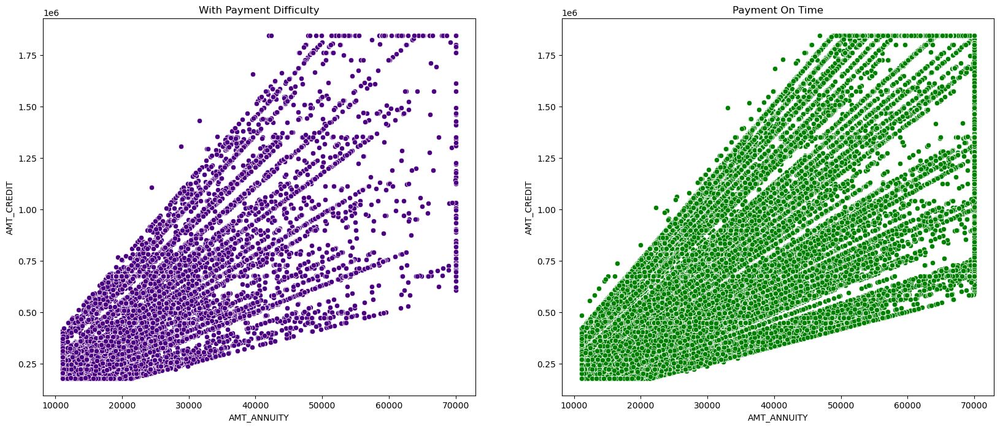

In [126]:
plt.subplots(1,2,figsize=(20,8))
plt.subplot(1,2,1)
sns.scatterplot(x='AMT_ANNUITY',y= 'AMT_CREDIT',data=df_true,color='Indigo')
plt.title('With Payment Difficulty')

plt.subplot(1,2,2)
sns.scatterplot(x='AMT_ANNUITY',y= 'AMT_CREDIT',data=df_false,color='Green')
plt.title('Payment On Time')
plt.show()

* High Correlation Observed: The graph shows a high correlation between AMT_CREDIT (loan amount) and AMT_ANNUITY.
* Logical Relationship: It makes sense logically; as the amount of loan increases, the installment amount needed also increases.
* Cause and Effect: Therefore, we can conclude that an increase in AMT_CREDIT causes an increase in AMT_ANNUITY.

## AMT_GOODS_PRICE    vs  AMT_ANNUITY                   

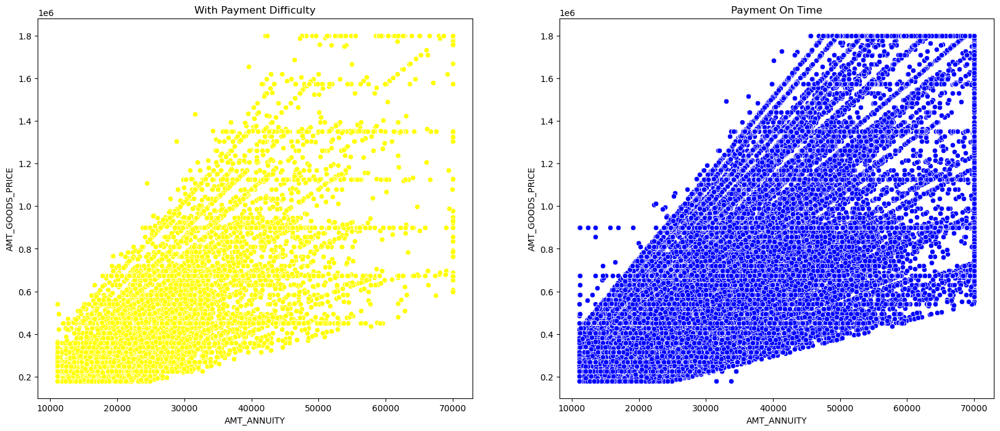

In [127]:
plt.subplots(1,2,figsize=(20,8))
plt.subplot(1,2,1)
sns.scatterplot(x='AMT_ANNUITY',y= 'AMT_GOODS_PRICE',data=df_true,color='Yellow')
plt.title('With Payment Difficulty')

plt.subplot(1,2,2)
sns.scatterplot(x='AMT_ANNUITY',y= 'AMT_GOODS_PRICE',data=df_false,color='Blue')
plt.title('Payment On Time')
plt.show()

* High Correlation Observed: The graph shows a high correlation between AMT_GOODS_PRICE and AMT_ANNUITY.
* Logical Relationship: It makes sense logically; as the price of goods increases, the installment amount needed also increases.
* Cause and Effect: Therefore, we can conclude that an increase in AMT_GOODS_PRICE causes an increase in AMT_ANNUITY.

##  AMT_INCOME_TOTAL      vs       AMT_ANNUITY  

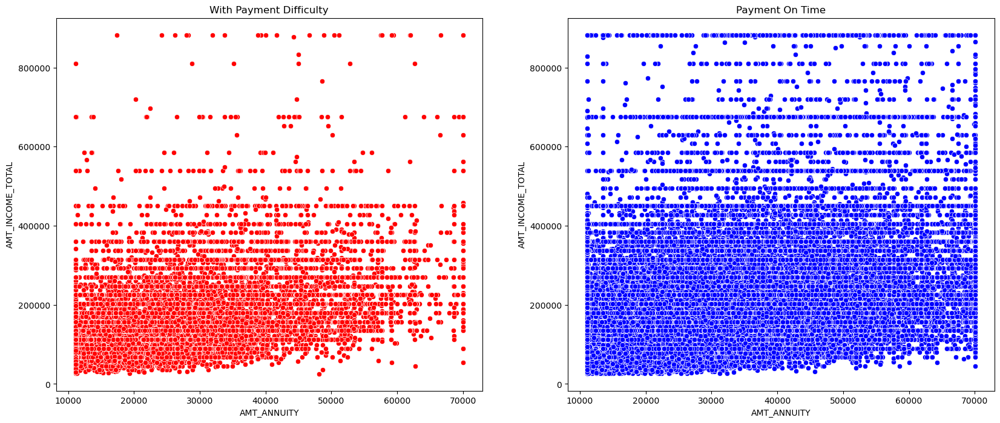

In [128]:
plt.subplots(1,2,figsize=(20,8))
plt.subplot(1,2,1)
sns.scatterplot(x='AMT_ANNUITY',y= 'AMT_INCOME_TOTAL',data=df_true,color='Red')
plt.title('With Payment Difficulty')

plt.subplot(1,2,2)
sns.scatterplot(x='AMT_ANNUITY',y= 'AMT_INCOME_TOTAL',data=df_false,color='Blue')
plt.title('Payment On Time')
plt.show()

* Customers with income greater than 400000 mostly doing payments on time

## MULTIVARIATE ANALYSIS

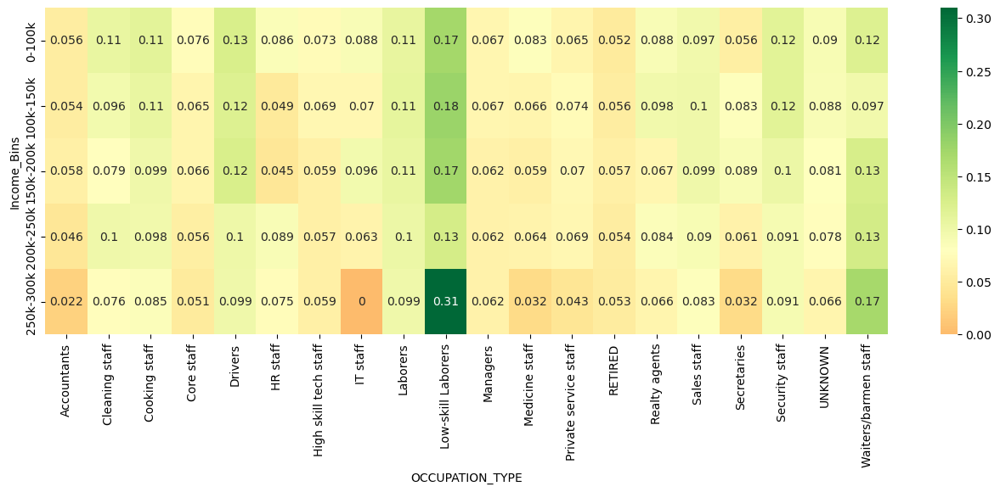

In [129]:
plt.figure(figsize=(16,5))
res=pd.pivot_table(data=df,index='Income_Bins',columns='OCCUPATION_TYPE',values='TARGET')
sns.heatmap(res,annot=True,cmap='RdYlGn',center=0.08)
plt.show()

In [130]:
data=df[(df['OCCUPATION_TYPE']=='Low-skill Laborers')&(df['Income_Bins']=='250k-300k')]
data.shape

(42, 54)

* Low-skill laborers and waiters/barmen staff  with income in range 250k-300k facing maximum percentage of payment difficulty seems not true income range provided is incorrect.

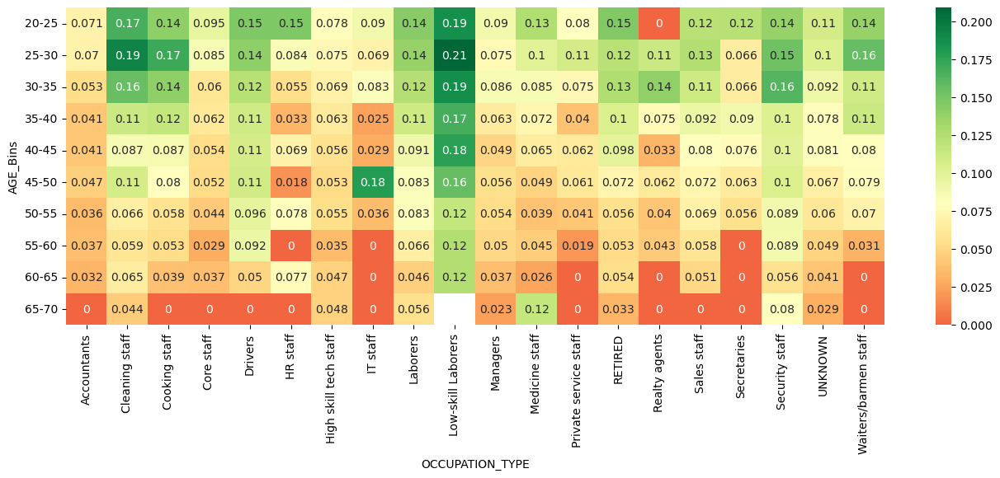

In [131]:
plt.figure(figsize=(16,5))
res=pd.pivot_table(data=df,index='AGE_Bins',columns='OCCUPATION_TYPE',values='TARGET')
sns.heatmap(res,annot=True,cmap='RdYlGn',center=0.08)
plt.show()

* Customers with age greater 40 are mostly doing their payments on time in the all the occupation type while custmors with age less than 40 in specific occupation type like cleaning staff, cooking staff,drivers, Laborers, low-skill laborers, security staff, waiters, sales staff are facing difficulty in doing payments on time

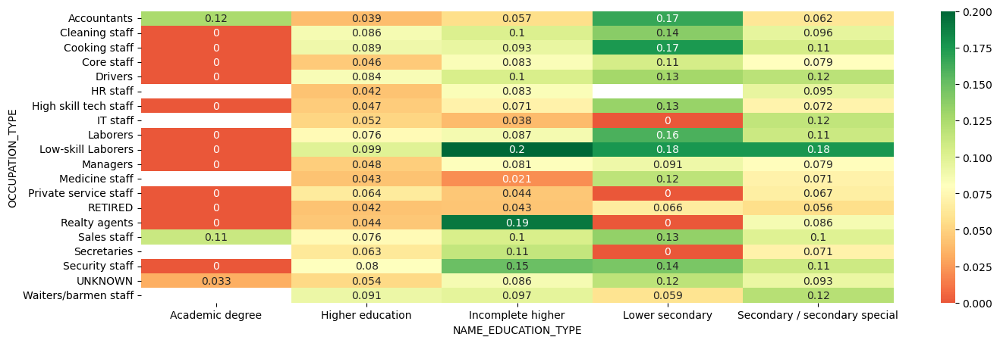

In [132]:
plt.figure(figsize=(16,5))
res=pd.pivot_table(data=df,index='OCCUPATION_TYPE',columns='NAME_EDUCATION_TYPE',values='TARGET')
sns.heatmap(res,annot=True,cmap='RdYlGn',center=0.08)
plt.show()

* Customers with higher education doing payment on time where customers with lower secondary education mostly facing payment difficulty

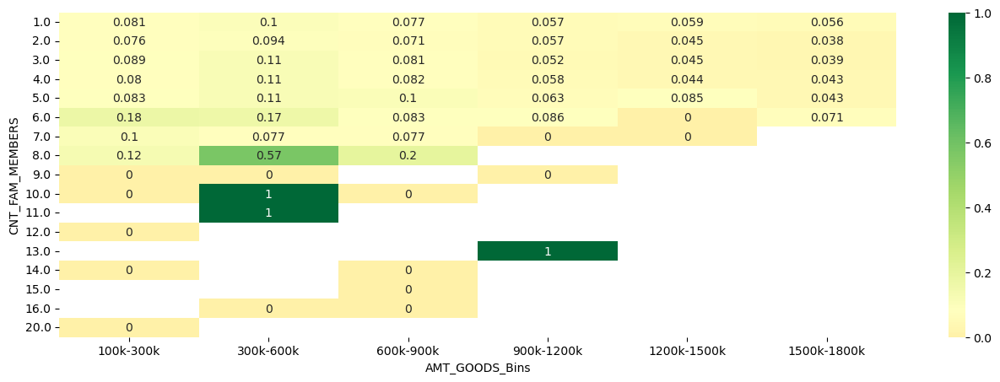

In [133]:
plt.figure(figsize=(16,5))
res=pd.pivot_table(data=df,index='CNT_FAM_MEMBERS',columns='AMT_GOODS_Bins',values='TARGET')
sns.heatmap(res,annot=True,cmap='RdYlGn',center=0.08)
plt.show()

* Customers with family members greater than 4 shows more payment difficulty

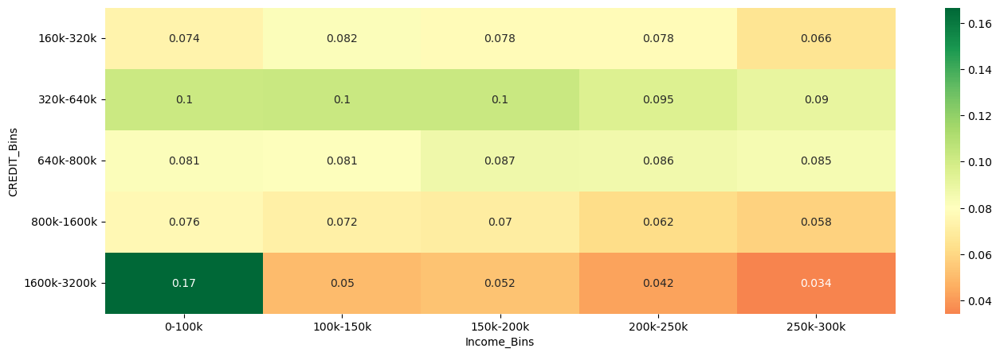

In [134]:
plt.figure(figsize=(16,5))
res=pd.pivot_table(data=df,index='CREDIT_Bins',columns='Income_Bins',values='TARGET')
sns.heatmap(res,annot=True,cmap='RdYlGn',center=0.08)
plt.show()

* In CREDIT_Bins column range 320k-640k irrespective of income bin customers are facing payment difficlulty.
* In other cases we can see there decrease in the payment difficulty as the income increases

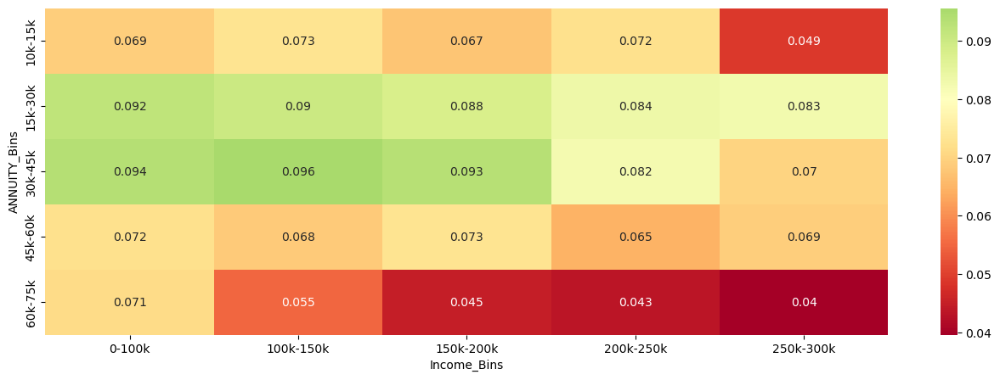

In [135]:
plt.figure(figsize=(16,5))
res=pd.pivot_table(data=df,index='ANNUITY_Bins',columns='Income_Bins',values='TARGET')
sns.heatmap(res,annot=True,cmap='RdYlGn',center=0.08)
plt.show()

* In ANNUITY_Bins range 15k-45k customers are facing payment difficulty
* In ANNUITY_Bins range 60k-70k customers facing payment diffculty for income range 0-100k.

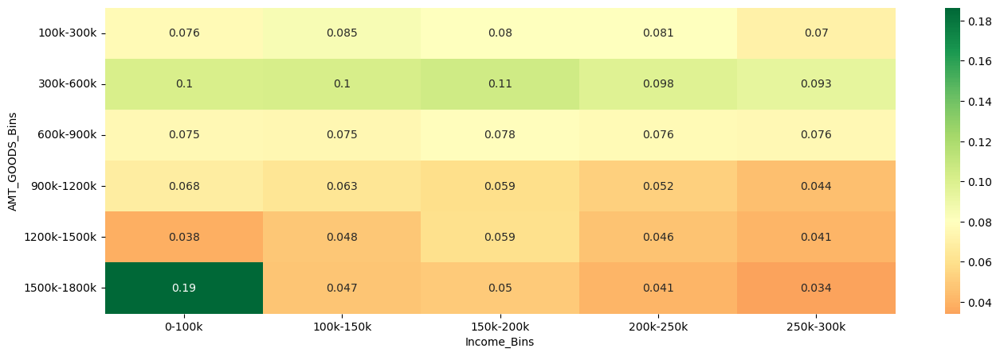

In [136]:
plt.figure(figsize=(16,5))
res=pd.pivot_table(data=df,index='AMT_GOODS_Bins',columns='Income_Bins',values='TARGET')
sns.heatmap(res,annot=True,cmap='RdYlGn',center=0.08)
plt.show()

* We can see as the price of goods increases, percentage of payment difficulty decreases
* In AMT_GOODS_Bins range 300k-600k there is maximum number of payment difficulty irrespective of income range

## Analysis of continous numeric columns range lies between 0 and 1 due to normalization

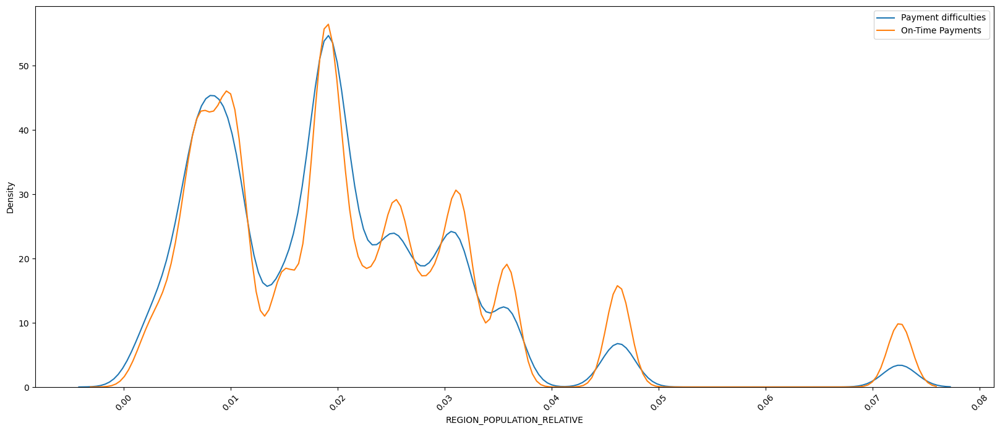

In [137]:
plt.figure(figsize = [20,8])
sns.distplot(df_true['REGION_POPULATION_RELATIVE'],label = 'Payment difficulties', hist=False)
sns.distplot(df_false['REGION_POPULATION_RELATIVE'],label = 'On-Time Payments', hist=False)
plt.ticklabel_format(style='plain', axis='x')
plt.xticks(rotation = 45)
plt.legend()
plt.show()

* As the relative population density increases , payment diffculty decreases 

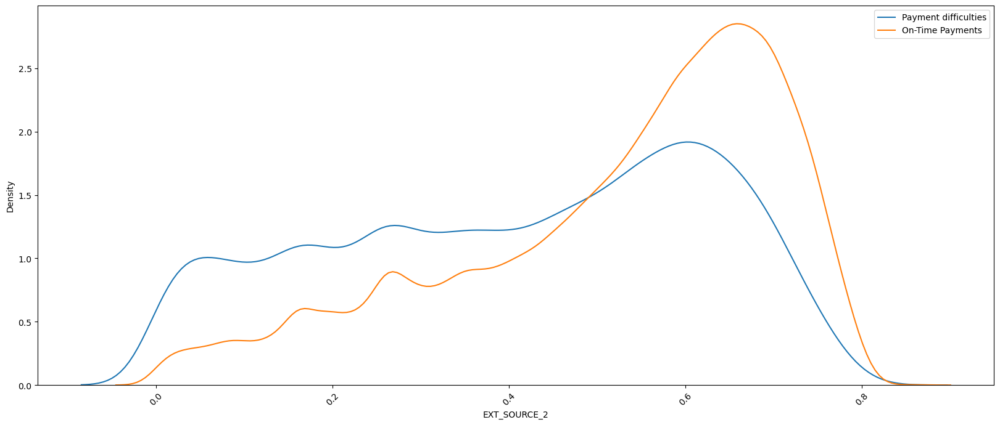

In [138]:
plt.figure(figsize = [20,8])
sns.distplot(df_true['EXT_SOURCE_2'],label = 'Payment difficulties', hist=False)
sns.distplot(df_false['EXT_SOURCE_2'],label = 'On-Time Payments', hist=False)
plt.ticklabel_format(style='plain', axis='x')
plt.xticks(rotation = 45)
plt.legend()
plt.show()

* As the credit score increases, percentage of payment on time also increases

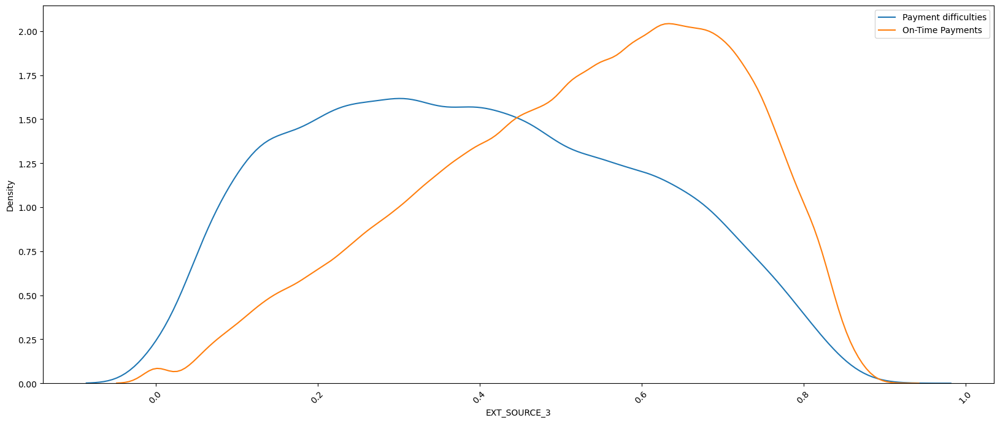

In [139]:
plt.figure(figsize = [20,8])
sns.distplot(df_true['EXT_SOURCE_3'],label = 'Payment difficulties', hist=False)
sns.distplot(df_false['EXT_SOURCE_3'],label = 'On-Time Payments', hist=False)
plt.ticklabel_format(style='plain', axis='x')
plt.xticks(rotation = 45)
plt.legend()
plt.show()

* As the credit score increases, percentage of payment on time also increases

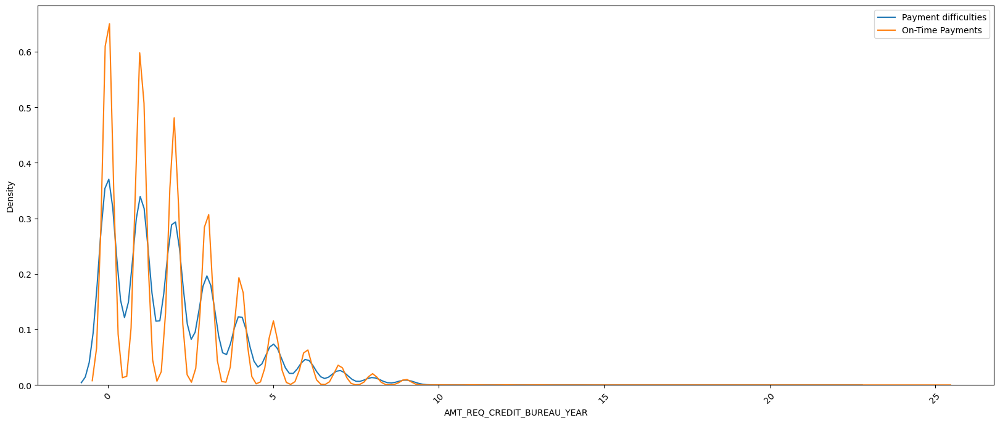

In [140]:
plt.figure(figsize = [20,8])
sns.distplot(df_true['AMT_REQ_CREDIT_BUREAU_YEAR'],label = 'Payment difficulties', hist=False)
sns.distplot(df_false['AMT_REQ_CREDIT_BUREAU_YEAR'],label = 'On-Time Payments', hist=False)
plt.ticklabel_format(style='plain', axis='x')
plt.xticks(rotation = 45)
plt.legend()
plt.show()

* Where the number of inquires are less payments are on time
* As the number of inquires increase , percentage decrease in the payment on time

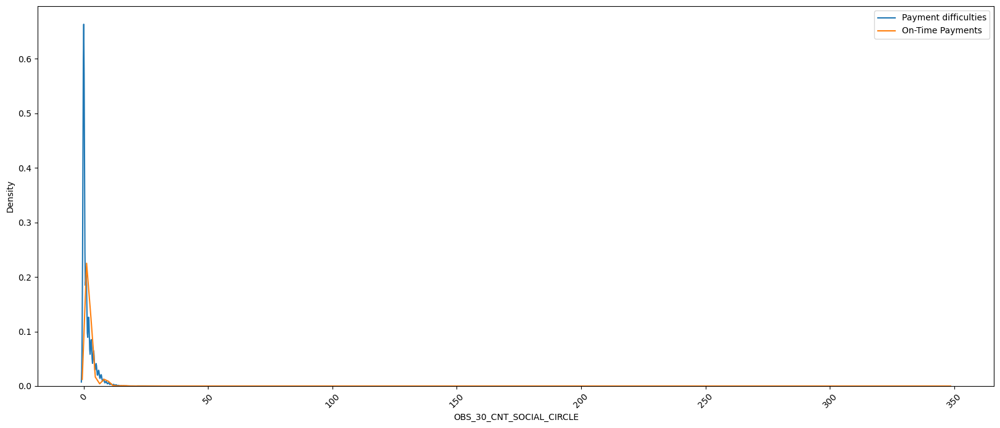

In [141]:
plt.figure(figsize = [20,8])
sns.distplot(df_true['OBS_30_CNT_SOCIAL_CIRCLE'],label = 'Payment difficulties', hist=False)
sns.distplot(df_false['OBS_30_CNT_SOCIAL_CIRCLE'],label = 'On-Time Payments', hist=False)
plt.ticklabel_format(style='plain', axis='x')
plt.xticks(rotation = 45)
plt.legend()
plt.show()

* Customers with smaller social circle are not doing payments on time

## Previous application data sheet

In [142]:
df_p=pd.read_csv('previous_application.csv')
df_p.head()

,SK_ID_PREV,SK_ID_CURR,NAME_CONTRACT_TYPE,AMT_ANNUITY,AMT_APPLICATION,AMT_CREDIT,AMT_DOWN_PAYMENT,AMT_GOODS_PRICE,WEEKDAY_APPR_PROCESS_START,HOUR_APPR_PROCESS_START,FLAG_LAST_APPL_PER_CONTRACT,NFLAG_LAST_APPL_IN_DAY,RATE_DOWN_PAYMENT,RATE_INTEREST_PRIMARY,RATE_INTEREST_PRIVILEGED,NAME_CASH_LOAN_PURPOSE,NAME_CONTRACT_STATUS,DAYS_DECISION,NAME_PAYMENT_TYPE,CODE_REJECT_REASON,NAME_TYPE_SUITE,NAME_CLIENT_TYPE,NAME_GOODS_CATEGORY,NAME_PORTFOLIO,NAME_PRODUCT_TYPE,CHANNEL_TYPE,SELLERPLACE_AREA,NAME_SELLER_INDUSTRY,CNT_PAYMENT,NAME_YIELD_GROUP,PRODUCT_COMBINATION,DAYS_FIRST_DRAWING,DAYS_FIRST_DUE,DAYS_LAST_DUE_1ST_VERSION,DAYS_LAST_DUE,DAYS_TERMINATION,NFLAG_INSURED_ON_APPROVAL
0,2030495,271877,Consumer loans,1730.430,17145.0,17145.0,0.0,17145.0,SATURDAY,15,Y,1,0.0,0.182832,0.867336,XAP,Approved,-73,Cash through the bank,XAP,NaN,Repeater,Mobile,POS,XNA,Country-wide,35,Connectivity,12.0,middle,POS mobile with interest,365243.0,-42.0,300.0,-42.0,-37.0,0.0
1,2802425,108129,Cash loans,25188.615,607500.0,679671.0,NaN,607500.0,THURSDAY,11,Y,1,NaN,NaN,NaN,XNA,Approved,-164,XNA,XAP,Unaccompanied,Repeater,XNA,Cash,x-sell,Contact center,-1,XNA,36.0,low_action,Cash X-Sell: low,365243.0,-134.0,916.0,365243.0,365243.0,1.0
2,2523466,122040,Cash loans,15060.735,112500.0,136444.5,NaN,112500.0,TUESDAY,11,Y,1,NaN,NaN,NaN,XNA,Approved,-301,Cash through the bank,XAP,"Spouse, partner",Repeater,XNA,Cash,x-sell,Credit and cash offices,-1,XNA,12.0,high,Cash X-Sell: high,365243.0,-271.0,59.0,365243.0,365243.0,1.0
3,2819243,176158,Cash loans,47041.335,450000.0,470790.0,NaN,450000.0,MONDAY,7,Y,1,NaN,NaN,NaN,XNA,Approved,-512,Cash through the bank,XAP,NaN,Repeater,XNA,Cash,x-sell,Credit and cash offices,-1,XNA,12.0,middle,Cash X-Sell: middle,365243.0,-482.0,-152.0,-182.0,-177.0,1.0
4,1784265,202054,Cash loans,31924.395,337500.0,404055.0,NaN,337500.0,THURSDAY,9,Y,1,NaN,NaN,NaN,Repairs,Refused,-781,Cash through the bank,HC,NaN,Repeater,XNA,Cash,walk-in,Credit and cash offices,-1,XNA,24.0,high,Cash Street: high,NaN,NaN,NaN,NaN,NaN,NaN


In [143]:
df_p.info(verbose=True)

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1670214 entries, 0 to 1670213
Data columns (total 37 columns):
 #   Column                       Non-Null Count    Dtype  
---  ------                       --------------    -----  
 0   SK_ID_PREV                   1670214 non-null  int64  
 1   SK_ID_CURR                   1670214 non-null  int64  
 2   NAME_CONTRACT_TYPE           1670214 non-null  object 
 3   AMT_ANNUITY                  1297979 non-null  float64
 4   AMT_APPLICATION              1670214 non-null  float64
 5   AMT_CREDIT                   1670213 non-null  float64
 6   AMT_DOWN_PAYMENT             774370 non-null   float64
 7   AMT_GOODS_PRICE              1284699 non-null  float64
 8   WEEKDAY_APPR_PROCESS_START   1670214 non-null  object 
 9   HOUR_APPR_PROCESS_START      1670214 non-null  int64  
 10  FLAG_LAST_APPL_PER_CONTRACT  1670214 non-null  object 
 11  NFLAG_LAST_APPL_IN_DAY       1670214 non-null  int64  
 12  RATE_DOWN_PAYMENT            774370 non-nu

## Checking Datatype correct or not

In [144]:
df_p.dtypes

SK_ID_PREV                       int64
SK_ID_CURR                       int64
NAME_CONTRACT_TYPE              object
AMT_ANNUITY                    float64
AMT_APPLICATION                float64
AMT_CREDIT                     float64
AMT_DOWN_PAYMENT               float64
AMT_GOODS_PRICE                float64
WEEKDAY_APPR_PROCESS_START      object
HOUR_APPR_PROCESS_START          int64
FLAG_LAST_APPL_PER_CONTRACT     object
NFLAG_LAST_APPL_IN_DAY           int64
RATE_DOWN_PAYMENT              float64
RATE_INTEREST_PRIMARY          float64
RATE_INTEREST_PRIVILEGED       float64
NAME_CASH_LOAN_PURPOSE          object
NAME_CONTRACT_STATUS            object
DAYS_DECISION                    int64
NAME_PAYMENT_TYPE               object
CODE_REJECT_REASON              object
NAME_TYPE_SUITE                 object
NAME_CLIENT_TYPE                object
NAME_GOODS_CATEGORY             object
NAME_PORTFOLIO                  object
NAME_PRODUCT_TYPE               object
CHANNEL_TYPE             

In all the columns datatype is correct not need of typecasting

## Percentage of null values in each column

In [145]:
df_p.isnull().mean()*100

SK_ID_PREV                      0.000000
SK_ID_CURR                      0.000000
NAME_CONTRACT_TYPE              0.000000
AMT_ANNUITY                    22.286665
AMT_APPLICATION                 0.000000
AMT_CREDIT                      0.000060
AMT_DOWN_PAYMENT               53.636480
AMT_GOODS_PRICE                23.081773
WEEKDAY_APPR_PROCESS_START      0.000000
HOUR_APPR_PROCESS_START         0.000000
FLAG_LAST_APPL_PER_CONTRACT     0.000000
NFLAG_LAST_APPL_IN_DAY          0.000000
RATE_DOWN_PAYMENT              53.636480
RATE_INTEREST_PRIMARY          99.643698
RATE_INTEREST_PRIVILEGED       99.643698
NAME_CASH_LOAN_PURPOSE          0.000000
NAME_CONTRACT_STATUS            0.000000
DAYS_DECISION                   0.000000
NAME_PAYMENT_TYPE               0.000000
CODE_REJECT_REASON              0.000000
NAME_TYPE_SUITE                49.119754
NAME_CLIENT_TYPE                0.000000
NAME_GOODS_CATEGORY             0.000000
NAME_PORTFOLIO                  0.000000
NAME_PRODUCT_TYP

## Dropping the columns having percentage value >40

In [146]:
missing_percentage = df_p.isnull().mean() * 100
columns_to_drop = missing_percentage[missing_percentage <40].index
df_p = df_p[columns_to_drop]

In [147]:
df_p.isnull().mean()*100

SK_ID_PREV                      0.000000
SK_ID_CURR                      0.000000
NAME_CONTRACT_TYPE              0.000000
AMT_ANNUITY                    22.286665
AMT_APPLICATION                 0.000000
AMT_CREDIT                      0.000060
AMT_GOODS_PRICE                23.081773
WEEKDAY_APPR_PROCESS_START      0.000000
HOUR_APPR_PROCESS_START         0.000000
FLAG_LAST_APPL_PER_CONTRACT     0.000000
NFLAG_LAST_APPL_IN_DAY          0.000000
NAME_CASH_LOAN_PURPOSE          0.000000
NAME_CONTRACT_STATUS            0.000000
DAYS_DECISION                   0.000000
NAME_PAYMENT_TYPE               0.000000
CODE_REJECT_REASON              0.000000
NAME_CLIENT_TYPE                0.000000
NAME_GOODS_CATEGORY             0.000000
NAME_PORTFOLIO                  0.000000
NAME_PRODUCT_TYPE               0.000000
CHANNEL_TYPE                    0.000000
SELLERPLACE_AREA                0.000000
NAME_SELLER_INDUSTRY            0.000000
CNT_PAYMENT                    22.286366
NAME_YIELD_GROUP

## Columns with the null values percentage between 0 and 40

In [148]:
(df_p.isnull().mean()*100)[((df_p.isnull().mean()*100)>0)&((df_p.isnull().mean()*100)<40)]

AMT_ANNUITY            22.286665
AMT_CREDIT              0.000060
AMT_GOODS_PRICE        23.081773
CNT_PAYMENT            22.286366
PRODUCT_COMBINATION     0.020716
dtype: float64

The percentage of null values in the columns AMT_ANNUITY, AMT_GOODS_PRICE, and CNT_PAYMENT is very high, around 22%. Imputing such a large number of values can create discrepancies in the results.

Where as in column PRODUCT_COMBINATION is very small dropping those rows will not create much difference on output

In [149]:
df_p = df_p.dropna(subset=['PRODUCT_COMBINATION'])

## Dealing with invalid values

In [150]:
df_p['NAME_CASH_LOAN_PURPOSE'].value_counts(normalize='True')*100

NAME_CASH_LOAN_PURPOSE
XAP                                 55.232809
XNA                                 40.597101
Repairs                              1.423166
Other                                0.934685
Urgent needs                         0.503752
Buying a used car                    0.172948
Building a house or an annex         0.161270
Everyday expenses                    0.144682
Medicine                             0.130190
Payments on other loans              0.115638
Education                            0.094199
Journey                              0.074197
Purchase of electronic equipment     0.063538
Buying a new car                     0.060604
Wedding / gift / holiday             0.057609
Buying a home                        0.051801
Car repairs                          0.047728
Furniture                            0.044854
Buying a holiday home / land         0.031919
Business development                 0.025511
Gasification / water supply          0.017965
Buying a ga

* XAP and XNA are aroung 97% but there is no specific information regarding will not make any changes keep it as it is.

In [151]:
df_p['DAYS_DECISION'].value_counts()

DAYS_DECISION
-245     2444
-238     2390
-210     2375
-273     2349
-196     2315
         ... 
-2882     163
-2922     162
-2921     158
-2902     148
-1          2
Name: count, Length: 2922, dtype: int64

In [152]:
df_p['DAYS_DECISION']=df_p['DAYS_DECISION'].abs()

In [153]:
df_p['DAYS_DECISION']=(df_p['DAYS_DECISION']/365).astype('int32')

* DAY_DECISION are negative values making them positive and days into year 

## Categorical columns

In [154]:
df_p.select_dtypes(include = "object").columns

Index(['NAME_CONTRACT_TYPE', 'WEEKDAY_APPR_PROCESS_START',
       'FLAG_LAST_APPL_PER_CONTRACT', 'NAME_CASH_LOAN_PURPOSE',
       'NAME_CONTRACT_STATUS', 'NAME_PAYMENT_TYPE', 'CODE_REJECT_REASON',
       'NAME_CLIENT_TYPE', 'NAME_GOODS_CATEGORY', 'NAME_PORTFOLIO',
       'NAME_PRODUCT_TYPE', 'CHANNEL_TYPE', 'NAME_SELLER_INDUSTRY',
       'NAME_YIELD_GROUP', 'PRODUCT_COMBINATION'],
      dtype='object')

## Numerical columns

In [155]:
df_p.select_dtypes(include=["int64","float64"]).columns

Index(['SK_ID_PREV', 'SK_ID_CURR', 'AMT_ANNUITY', 'AMT_APPLICATION',
       'AMT_CREDIT', 'AMT_GOODS_PRICE', 'HOUR_APPR_PROCESS_START',
       'NFLAG_LAST_APPL_IN_DAY', 'SELLERPLACE_AREA', 'CNT_PAYMENT'],
      dtype='object')

## Handling the outliers

## AMT_ANNUITY

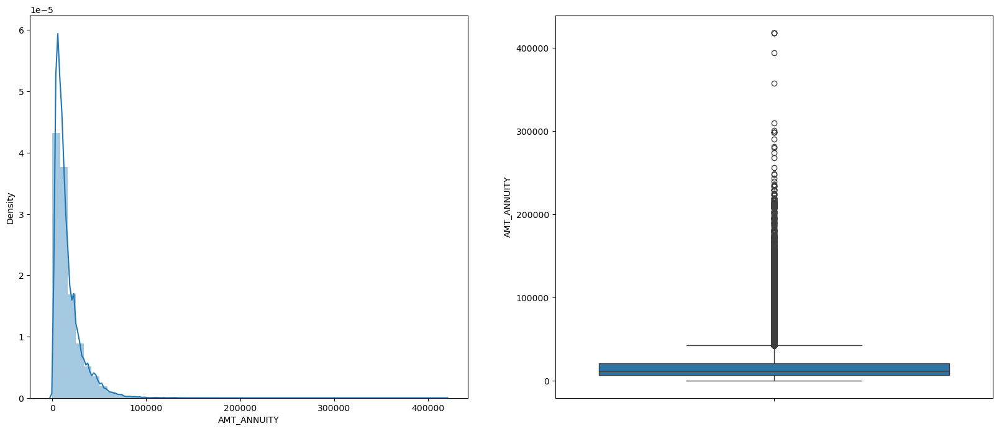

In [156]:
plt.subplots(1,2 ,figsize = (20,8))
plt.subplot(121)
sns.distplot(df_p['AMT_ANNUITY'])
plt.subplot(122)
sns.boxplot(df_p['AMT_ANNUITY'])
plt.show()

In [157]:
upper_limit=df_p['AMT_ANNUITY'].quantile(0.99)
lower_limit=df_p['AMT_ANNUITY'].quantile(0.1)
print(upper_limit)
print(lower_limit)

69685.78859999991
3817.53


In [158]:
df_p.loc[df_p['AMT_ANNUITY']>upper_limit,'AMT_ANNUITY']=upper_limit
df_p.loc[df_p['AMT_ANNUITY']<lower_limit,'AMT_ANNUITY']=lower_limit

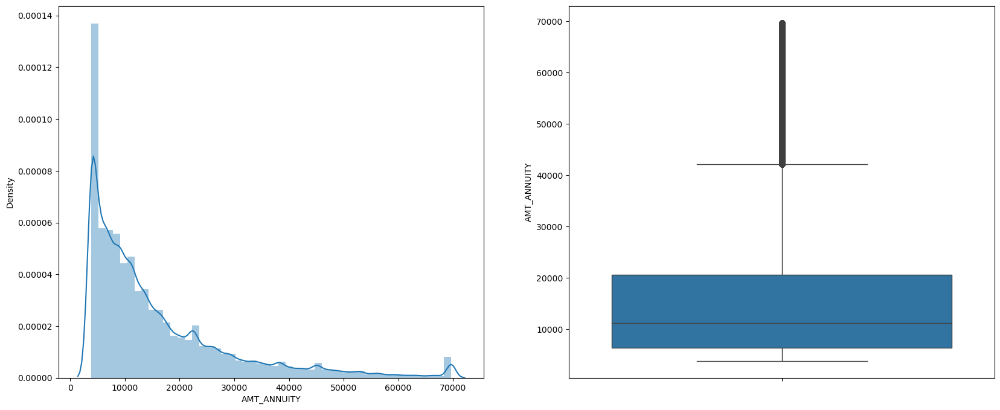

In [159]:
plt.subplots(1,2 ,figsize = (20,8))
plt.subplot(121)
sns.distplot(df_p['AMT_ANNUITY'])
plt.subplot(122)
sns.boxplot(df_p['AMT_ANNUITY'])
plt.show()

## AMT_APPLICATION

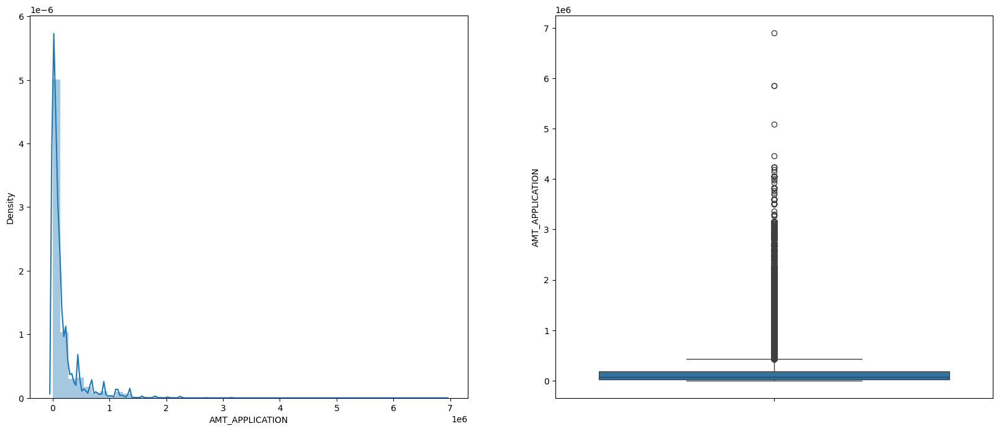

In [160]:
plt.subplots(1,2 ,figsize = (20,8))
plt.subplot(121)
sns.distplot(df_p['AMT_APPLICATION'])
plt.subplot(122)
sns.boxplot(df_p['AMT_APPLICATION'])
plt.show()

In [161]:
upper_limit=df_p['AMT_APPLICATION'].quantile(0.99)
lower_limit=df_p['AMT_APPLICATION'].quantile(0.1)
print(upper_limit)
print(lower_limit)

1350000.0
0.0


In [162]:
df_p.loc[df_p['AMT_APPLICATION']>upper_limit,'AMT_APPLICATION']=upper_limit
df_p.loc[df_p['AMT_APPLICATION']<lower_limit,'AMT_APPLICATION']=lower_limit

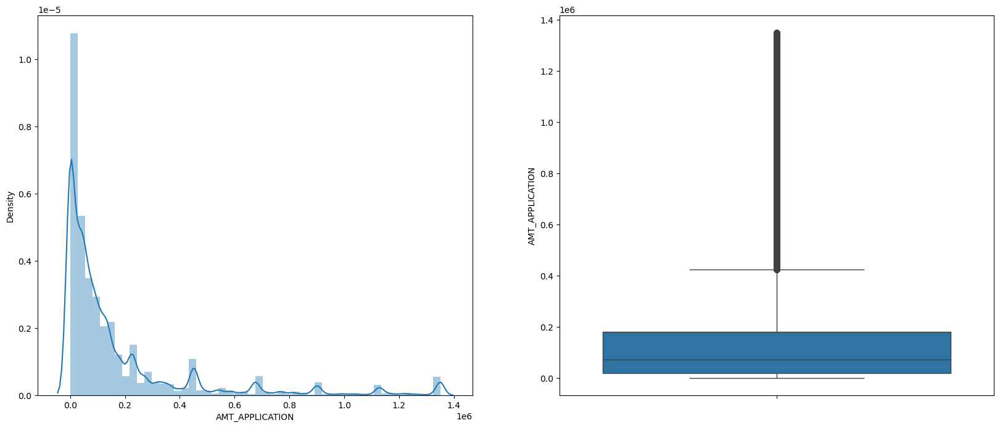

In [163]:
plt.subplots(1,2 ,figsize = (20,8))
plt.subplot(121)
sns.distplot(df_p['AMT_APPLICATION'])
plt.subplot(122)
sns.boxplot(df_p['AMT_APPLICATION'])
plt.show()

## AMT_CREDIT

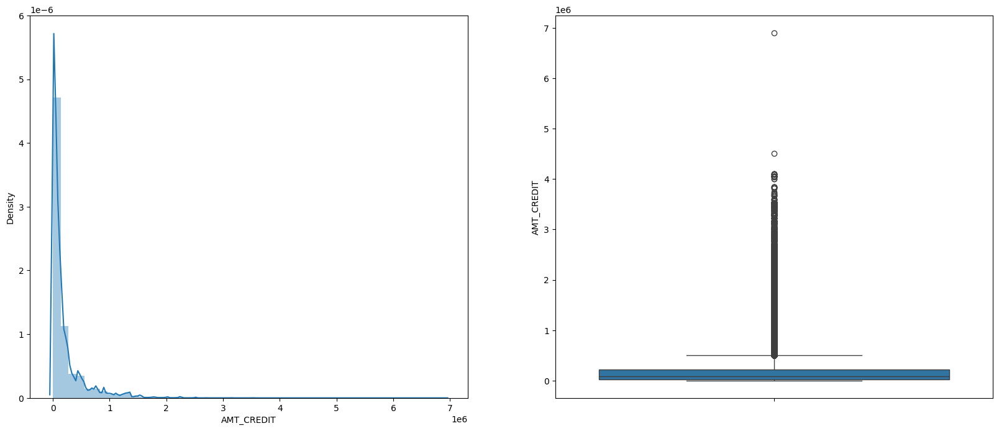

In [164]:
plt.subplots(1,2 ,figsize = (20,8))
plt.subplot(121)
sns.distplot(df_p['AMT_CREDIT'])
plt.subplot(122)
sns.boxplot(df_p['AMT_CREDIT'])
plt.show()

In [165]:
upper_limit=df_p['AMT_CREDIT'].quantile(0.99)
lower_limit=df_p['AMT_CREDIT'].quantile(0.1)
print(upper_limit)
print(lower_limit)

1515415.5
0.0


In [166]:
df_p.loc[df_p['AMT_CREDIT']>upper_limit,'AMT_CREDIT']=upper_limit
df_p.loc[df_p['AMT_CREDIT']<lower_limit,'AMT_CREDIT']=lower_limit

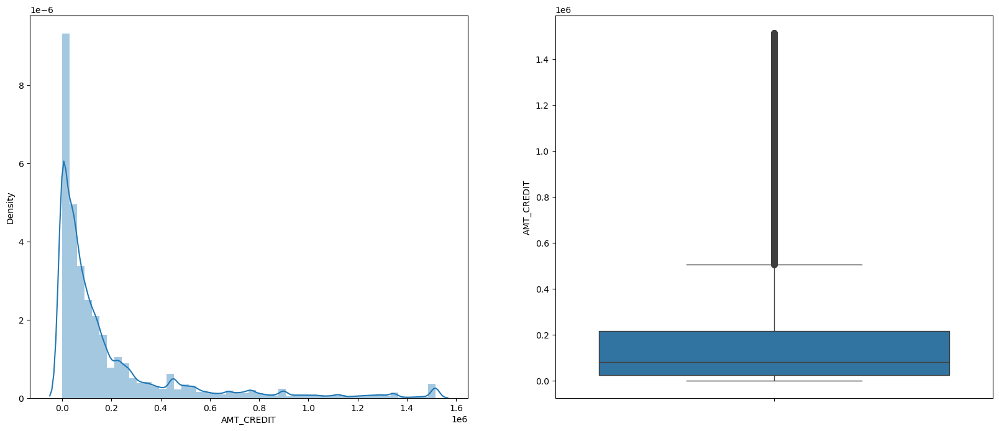

In [167]:
plt.subplots(1,2 ,figsize = (20,8))
plt.subplot(121)
sns.distplot(df_p['AMT_CREDIT'])
plt.subplot(122)
sns.boxplot(df_p['AMT_CREDIT'])
plt.show()

## AMT_GOODS_PRICE

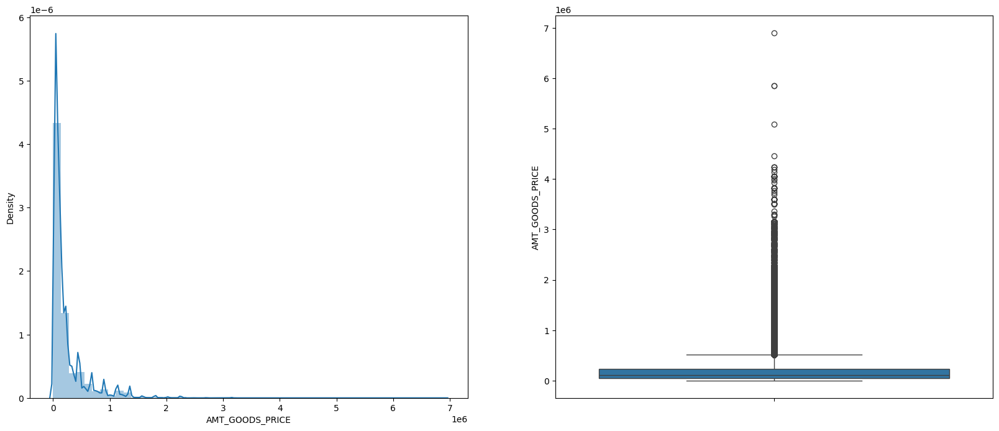

In [168]:
plt.subplots(1,2 ,figsize = (20,8))
plt.subplot(121)
sns.distplot(df_p['AMT_GOODS_PRICE'])
plt.subplot(122)
sns.boxplot(df_p['AMT_GOODS_PRICE'])
plt.show()

In [169]:
upper_limit=df_p['AMT_GOODS_PRICE'].quantile(0.99)
lower_limit=df_p['AMT_GOODS_PRICE'].quantile(0.1)
print(upper_limit)
print(lower_limit)

1395000.0
30555.0


In [170]:
df_p.loc[df_p['AMT_GOODS_PRICE']>upper_limit,'AMT_GOODS_PRICE']=upper_limit
df_p.loc[df_p['AMT_GOODS_PRICE']<lower_limit,'AMT_GOODS_PRICE']=lower_limit

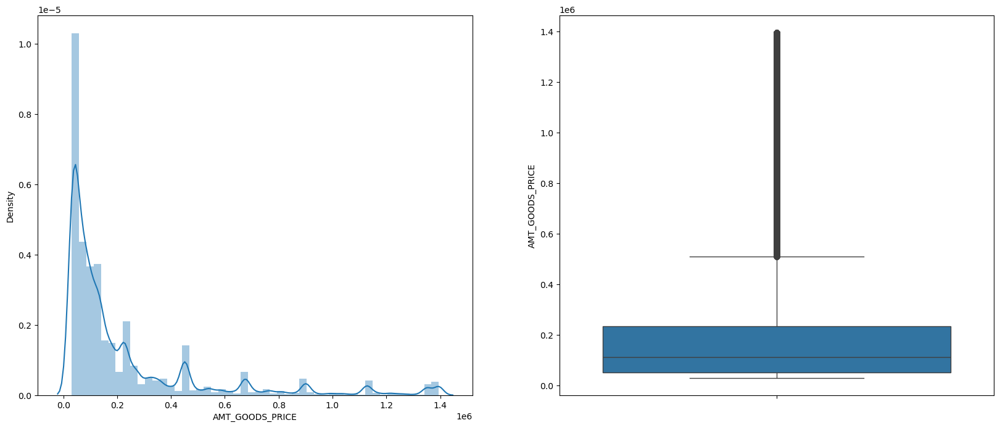

In [171]:
plt.subplots(1,2 ,figsize = (20,8))
plt.subplot(121)
sns.distplot(df_p['AMT_GOODS_PRICE'])
plt.subplot(122)
sns.boxplot(df_p['AMT_GOODS_PRICE'])
plt.show()

## CNT_PAYMENT

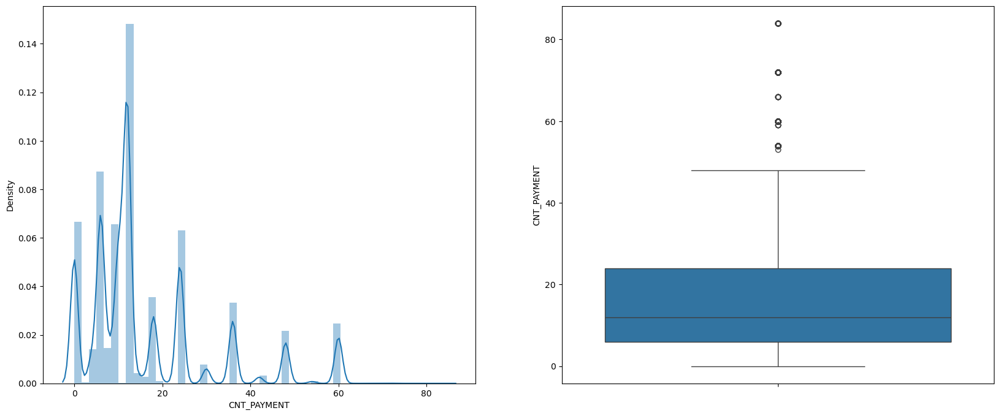

In [172]:
plt.subplots(1,2 ,figsize = (20,8))
plt.subplot(121)
sns.distplot(df_p['CNT_PAYMENT'])
plt.subplot(122)
sns.boxplot(df_p['CNT_PAYMENT'])
plt.show()

In [173]:
upper_limit=df_p['CNT_PAYMENT'].quantile(0.99)
lower_limit=df_p['CNT_PAYMENT'].quantile(0.1)
print(upper_limit)
print(lower_limit)

60.0
0.0


In [174]:
df_p.loc[df_p['CNT_PAYMENT']>upper_limit,'CNT_PAYMENT']=upper_limit
df_p.loc[df_p['CNT_PAYMENT']<lower_limit,'CNT_PAYMENT']=lower_limit

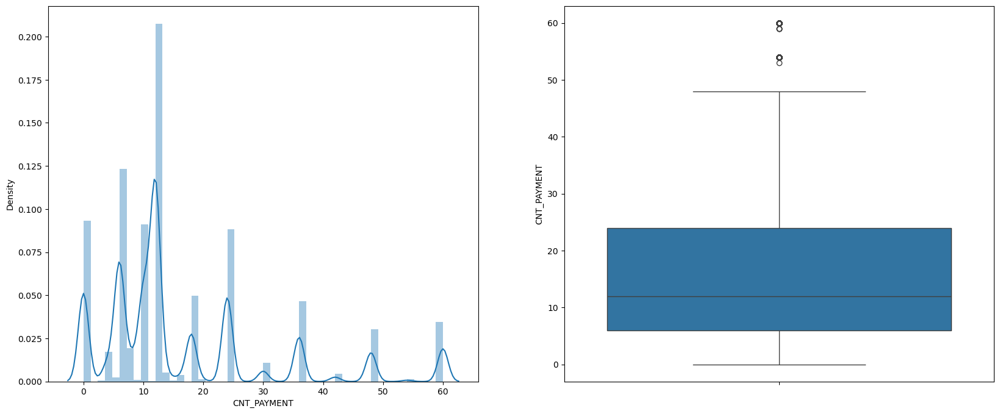

In [175]:
plt.subplots(1,2 ,figsize = (20,8))
plt.subplot(121)
sns.distplot(df_p['CNT_PAYMENT'])
plt.subplot(122)
sns.boxplot(df_p['CNT_PAYMENT'])
plt.show()

## Bining continous numeric columns

## AMT_CREDIT

In [176]:
df_p['AMT_CREDIT'].max()

1515415.5

In [177]:
df_p['AMT_CREDIT'].min()

0.0

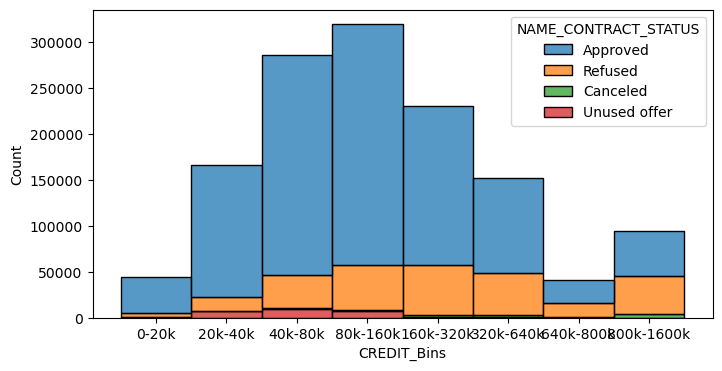

In [178]:
bins = [0,20000,40000,80000 ,160000, 320000, 640000, 800000,1600000]
# Create bin labels
bin_labels = [ '0-20k', '20k-40k', '40k-80k','80k-160k','160k-320k', '320k-640k', '640k-800k','800k-1600k']
# Bin the data using pd.cut
df_p['CREDIT_Bins'] = pd.cut(df_p['AMT_CREDIT'], bins=bins, labels=bin_labels)
# Print the resulting DataFrame to verify
# Plotting the histogram of the binned data
plt.figure(figsize=(8,4))
sns.histplot(data=df_p,x='CREDIT_Bins',hue='NAME_CONTRACT_STATUS',multiple='stack')
plt.show()

*  In the column CREDIT_Bins, the threshold range is 160k-320k. Customers having credits higher than this range have lower chances of approval, whereas those with credits lower than this range have increased chances of approval.

## AMT_GOODS_PRICE

In [179]:
df_p['AMT_GOODS_PRICE'].max()

1395000.0

In [180]:
df_p['AMT_GOODS_PRICE'].min()

30555.0

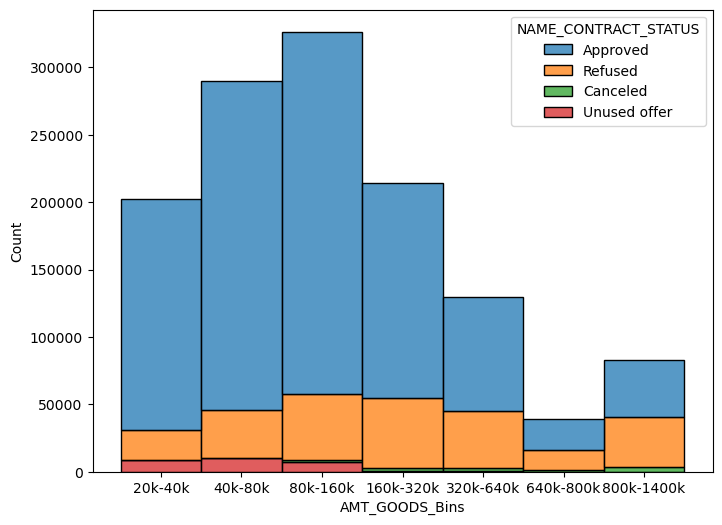

In [181]:
bins = [20000,40000,80000 ,160000, 320000, 640000, 800000,1400000]
# Create bin labels
bin_labels = ['20k-40k', '40k-80k','80k-160k','160k-320k', '320k-640k', '640k-800k','800k-1400k']
# Bin the data using pd.cut
df_p['AMT_GOODS_Bins'] = pd.cut(df_p['AMT_GOODS_PRICE'], bins=bins, labels=bin_labels)
# Print the resulting DataFrame to verify
# Plotting the histogram of the binned data
plt.figure(figsize=(8, 6))
sns.histplot(data=df_p,x='AMT_GOODS_Bins',hue='NAME_CONTRACT_STATUS',multiple='stack')
plt.show()

* The AMT_GOODS_PRICE column represents the price of the asset for which the loan has been taken. The threshold range is 160k-320k. Customers with goods prices lower than this range have higher chances of approval, whereas customers with goods prices greater than this range have lower chances of loan approval.

## AMT_ANNUITY

In [182]:
df_p['AMT_ANNUITY'].max()

69685.78859999991

In [183]:
df_p['AMT_ANNUITY'].min()

3817.53

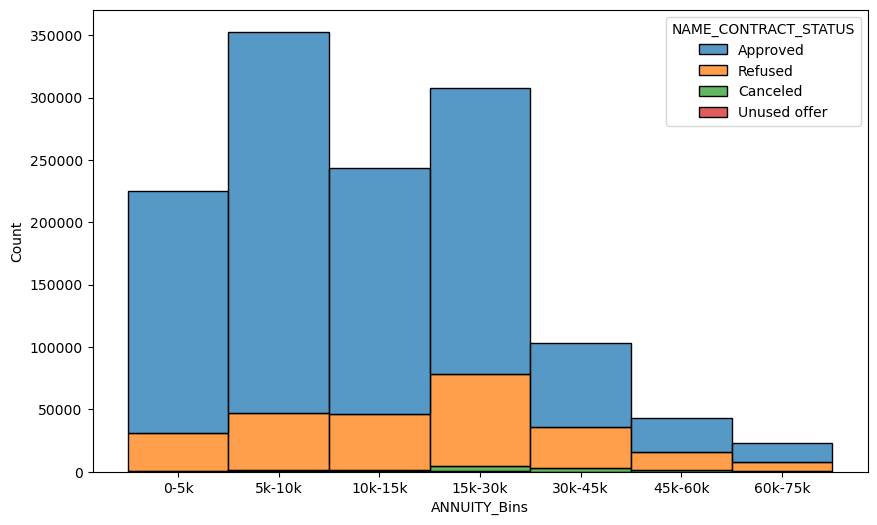

In [184]:
bins = [0,5000 ,10000, 15000,30000 ,45000,60000,75000]
# Create bin labels
bin_labels = ['0-5k','5k-10k' ,'10k-15k', '15k-30k', '30k-45k','45k-60k', '60k-75k']
# Bin the data using pd.cut
df_p['ANNUITY_Bins'] = pd.cut(df_p['AMT_ANNUITY'], bins=bins, labels=bin_labels)
# Print the resulting DataFrame to verify
# Plotting the histogram of the binned data
plt.figure(figsize=(10, 6))
sns.histplot(data=df_p,x='ANNUITY_Bins',hue='NAME_CONTRACT_STATUS',multiple='stack')
plt.show()

* The AMT_ANNUITY column represents the amount that a customer has to pay on a monthly basis to repay their loan. Customers with an EMI less than 15,000 receive more approvals than those with an EMI greater than 15,000. Customers, especially those in the range of 15,000-30,000, have received the maximum number of refusals.

## CNT_PAYMENT

In [185]:
df_p['CNT_PAYMENT'].max()

60.0

In [186]:
df_p['CNT_PAYMENT'].min()

0.0

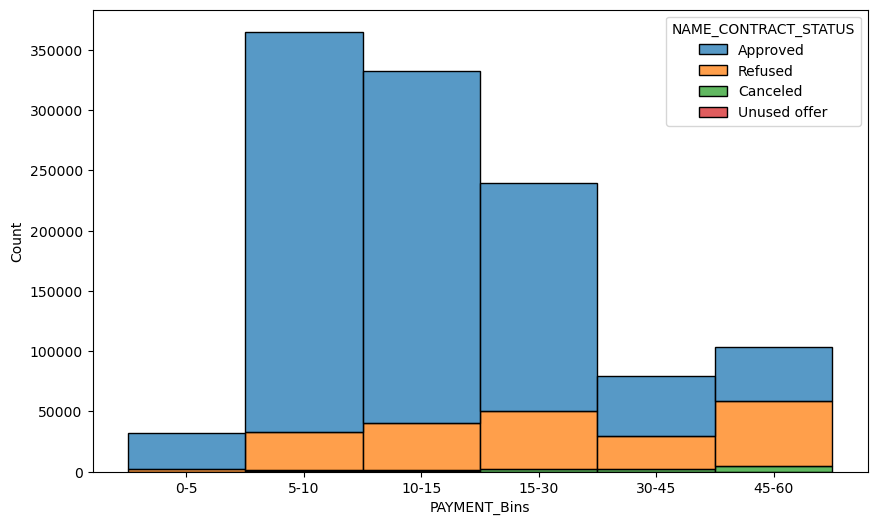

In [187]:
bins = [0,5 ,10, 15,30 ,45,60]
# Create bin labels
bin_labels = ['0-5','5-10' ,'10-15', '15-30', '30-45','45-60']
# Bin the data using pd.cut
df_p['PAYMENT_Bins'] = pd.cut(df_p['CNT_PAYMENT'], bins=bins, labels=bin_labels)
# Print the resulting DataFrame to verify
# Plotting the histogram of the binned data
plt.figure(figsize=(10, 6))
sns.histplot(data=df_p,x='PAYMENT_Bins',hue='NAME_CONTRACT_STATUS',multiple='stack')
plt.show()

* The CNT_PAYMENT column represents the duration of loan repayment. For longer repayment durations, the refusal rate is higher. There are more approvals for loan durations of less than 10 years, meaning the shorter the loan repayment period, the higher the chance of loan approval.

## AMT_APPLICATION

In [188]:
df_p['AMT_APPLICATION'].max()

1350000.0

In [189]:
df_p['AMT_APPLICATION'].min()

0.0

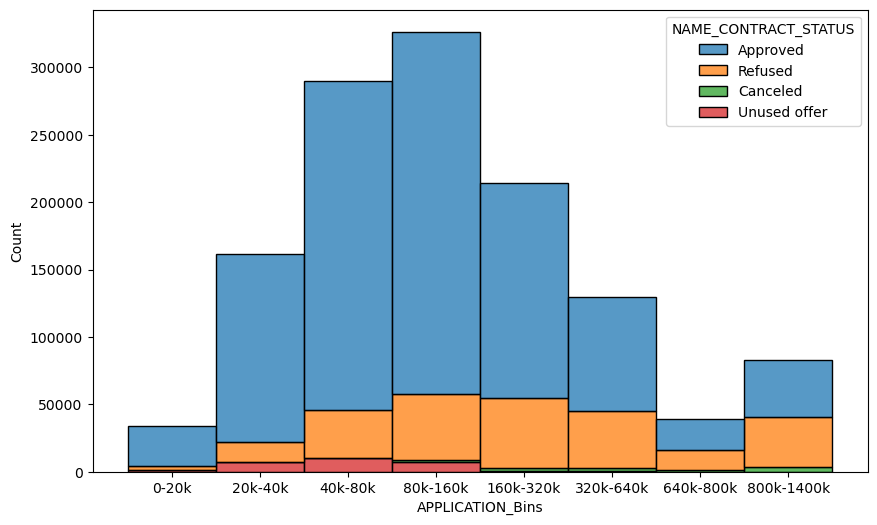

In [190]:
bins = [0,20000,40000,80000 ,160000, 320000, 640000, 800000,1400000]
bin_labels = ['0-20k','20k-40k', '40k-80k','80k-160k','160k-320k', '320k-640k', '640k-800k','800k-1400k']
df_p['APPLICATION_Bins'] = pd.cut(df_p['AMT_APPLICATION'], bins=bins, labels=bin_labels)
plt.figure(figsize=(10, 6))
sns.histplot(data=df_p,x='APPLICATION_Bins',hue='NAME_CONTRACT_STATUS',multiple='stack')
plt.show()

* The AMT_APPLICATION column represents the amount of the loan requested by the customer at the time of application. Refusals are more common for amounts greater than 160k.

## Merging both the dataframes current_application and previous_application

In [191]:
df_merge = df.merge(df_p, left_on='SK_ID_CURR', right_on='SK_ID_CURR', how='inner')

In [192]:
df_merge.shape

(1404813, 84)

In [193]:
df.shape

(304531, 54)

In [194]:
df_p.shape

(1669868, 31)

In [195]:
df_merge.head()

,SK_ID_CURR,TARGET,NAME_CONTRACT_TYPE_x,CODE_GENDER,FLAG_OWN_CAR,FLAG_OWN_REALTY,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT_x,AMT_ANNUITY_x,AMT_GOODS_PRICE_x,NAME_TYPE_SUITE,NAME_INCOME_TYPE,NAME_EDUCATION_TYPE,NAME_FAMILY_STATUS,NAME_HOUSING_TYPE,REGION_POPULATION_RELATIVE,DAYS_BIRTH,DAYS_EMPLOYED,DAYS_REGISTRATION,DAYS_ID_PUBLISH,FLAG_MOBIL,FLAG_EMP_PHONE,FLAG_WORK_PHONE,FLAG_CONT_MOBILE,FLAG_PHONE,FLAG_EMAIL,OCCUPATION_TYPE,CNT_FAM_MEMBERS,REGION_RATING_CLIENT,REGION_RATING_CLIENT_W_CITY,WEEKDAY_APPR_PROCESS_START_x,HOUR_APPR_PROCESS_START_x,REG_REGION_NOT_LIVE_REGION,REG_REGION_NOT_WORK_REGION,LIVE_REGION_NOT_WORK_REGION,REG_CITY_NOT_LIVE_CITY,REG_CITY_NOT_WORK_CITY,LIVE_CITY_NOT_WORK_CITY,ORGANIZATION_TYPE,EXT_SOURCE_2,EXT_SOURCE_3,OBS_30_CNT_SOCIAL_CIRCLE,DEF_30_CNT_SOCIAL_CIRCLE,OBS_60_CNT_SOCIAL_CIRCLE,DEF_60_CNT_SOCIAL_CIRCLE,DAYS_LAST_PHONE_CHANGE,AMT_REQ_CREDIT_BUREAU_YEAR,Income_Bins,CREDIT_Bins_x,ANNUITY_Bins_x,AGE_Bins,EMPLOYED_Bins,AMT_GOODS_Bins_x,SK_ID_PREV,NAME_CONTRACT_TYPE_y,AMT_ANNUITY_y,AMT_APPLICATION,AMT_CREDIT_y,AMT_GOODS_PRICE_y,WEEKDAY_APPR_PROCESS_START_y,HOUR_APPR_PROCESS_START_y,FLAG_LAST_APPL_PER_CONTRACT,NFLAG_LAST_APPL_IN_DAY,NAME_CASH_LOAN_PURPOSE,NAME_CONTRACT_STATUS,DAYS_DECISION,NAME_PAYMENT_TYPE,CODE_REJECT_REASON,NAME_CLIENT_TYPE,NAME_GOODS_CATEGORY,NAME_PORTFOLIO,NAME_PRODUCT_TYPE,CHANNEL_TYPE,SELLERPLACE_AREA,NAME_SELLER_INDUSTRY,CNT_PAYMENT,NAME_YIELD_GROUP,PRODUCT_COMBINATION,CREDIT_Bins_y,AMT_GOODS_Bins_y,ANNUITY_Bins_y,PAYMENT_Bins,APPLICATION_Bins
0,100002,1,Cash loans,M,0,1,0,202500.0,406597.5,24700.5,351000.0,Unaccompanied,Working,Secondary / secondary special,Single / not married,House / apartment,0.018801,25,1,9,-2120,1,1,0,1,1,0,Laborers,1.0,2,2,WEDNESDAY,10,0,0,0,0,0,0,Business Entity Type 3,0.262949,0.139376,2.0,2.0,2.0,2.0,-1134.0,1.0,200k-250k,320k-640k,15k-30k,20-25,0-5,300k-600k,1038818,Consumer loans,9251.7750,179055.0,179055.0,179055.0,SATURDAY,9,Y,1,XAP,Approved,1,XNA,XAP,New,Vehicles,POS,XNA,Stone,500,Auto technology,24.0,low_normal,POS other with interest,160k-320k,160k-320k,5k-10k,15-30,160k-320k
1,100003,0,Cash loans,F,0,0,0,270000.0,1293502.5,35698.5,1129500.0,Family,State servant,Higher education,Married,House / apartment,0.003541,45,3,3,-291,1,1,0,1,1,0,Core staff,2.0,1,1,MONDAY,11,0,0,0,0,0,0,School,0.622246,NaN,1.0,0.0,1.0,0.0,-828.0,0.0,250k-300k,800k-1600k,30k-45k,40-45,0-5,900k-1200k,1810518,Cash loans,69685.7886,900000.0,1035882.0,900000.0,FRIDAY,12,Y,1,XNA,Approved,2,XNA,XAP,Repeater,XNA,Cash,x-sell,Credit and cash offices,-1,XNA,12.0,low_normal,Cash X-Sell: low,800k-1600k,800k-1400k,60k-75k,10-15,800k-1400k
2,100003,0,Cash loans,F,0,0,0,270000.0,1293502.5,35698.5,1129500.0,Family,State servant,Higher education,Married,House / apartment,0.003541,45,3,3,-291,1,1,0,1,1,0,Core staff,2.0,1,1,MONDAY,11,0,0,0,0,0,0,School,0.622246,NaN,1.0,0.0,1.0,0.0,-828.0,0.0,250k-300k,800k-1600k,30k-45k,40-45,0-5,900k-1200k,2636178,Consumer loans,64567.6650,337500.0,348637.5,337500.0,SUNDAY,17,Y,1,XAP,Approved,2,Cash through the bank,XAP,Refreshed,Furniture,POS,XNA,Stone,1400,Furniture,6.0,middle,POS industry with interest,320k-640k,320k-640k,60k-75k,5-10,320k-640k
3,100003,0,Cash loans,F,0,0,0,270000.0,1293502.5,35698.5,1129500.0,Family,State servant,Higher education,Married,House / apartment,0.003541,45,3,3,-291,1,1,0,1,1,0,Core staff,2.0,1,1,MONDAY,11,0,0,0,0,0,0,School,0.622246,NaN,1.0,0.0,1.0,0.0,-828.0,0.0,250k-300k,800k-1600k,30k-45k,40-45,0-5,900k-1200k,2396755,Consumer loans,6737.3100,68809.5,68053.5,68809.5,SATURDAY,15,Y,1,XAP,Approved,6,Cash through the bank,XAP,Refreshed,Consumer Electronics,POS,XNA,Country-wide,200,Consumer electronics,12.0,middle,POS household with interest,40k-80k,40k-80k,5k-10k,10-15,40k-80k
4,100004,0,Revolving loans,M,1,1,0,67500.0,180000.0,11101.5,180000.0,Unaccompanied,Working,Secondary / secondary special,Single / not married,House / apartment,0.010032,52,0,11,-2531,1,1,1,1,1,0,Laborers,1.0,2,2,MONDAY,9,0,0,0,0,0,0,Government,0.555912,0.7

## Data imbalance

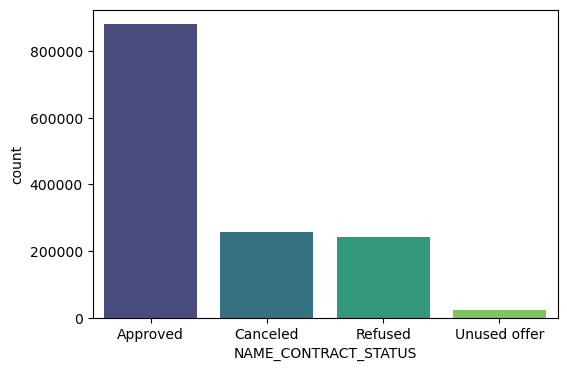

In [196]:
plt.figure(figsize=(6,4))
sns.countplot(x=df_merge['NAME_CONTRACT_STATUS'],palette='viridis')
plt.show()

* The target column NAME_CONTRACT_STATUS shows that a large number of customers received loan approval compared to those who were refused.

## UNIVARIATE ANALYSIS

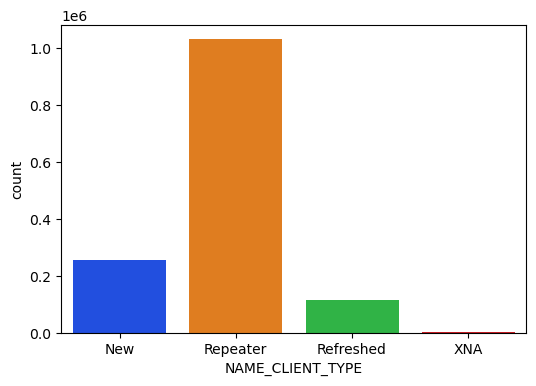

In [197]:
plt.figure(figsize=(6,4))
sns.countplot(x=df_merge['NAME_CLIENT_TYPE'],palette='bright')
plt.show()

* Repeater are more as compared to new customers 

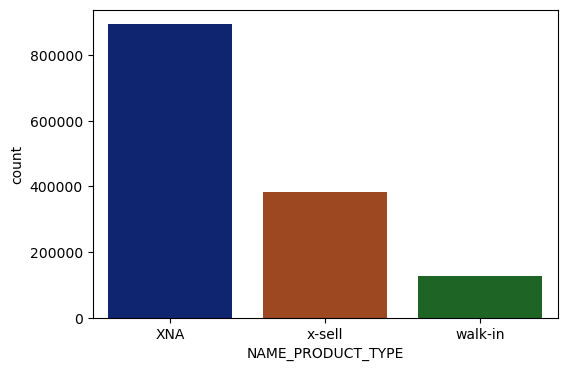

In [198]:
plt.figure(figsize=(6,4))
sns.countplot(x=df_merge['NAME_PRODUCT_TYPE'],palette='dark')
plt.show()

* NAME_PRODUCT_TYPE representing the type of loan here data inside this column not giving much clearity about the product type

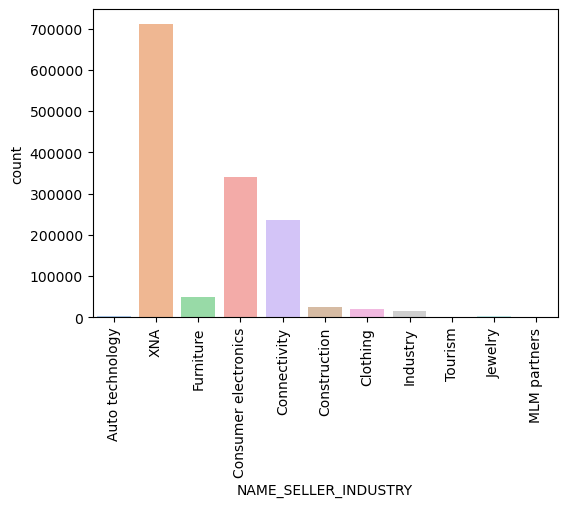

In [199]:
plt.figure(figsize=(6,4))
sns.countplot(x=df_merge['NAME_SELLER_INDUSTRY'],palette='pastel')
plt.xticks(rotation=90)
plt.show()

* Count of XNA is maximum

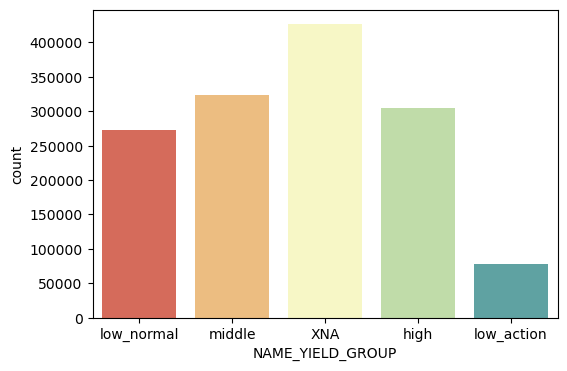

In [200]:
plt.figure(figsize=(6,4))
sns.countplot(x=df_merge['NAME_YIELD_GROUP'],palette='Spectral')
plt.show()

* Count of XNA is maximum followed by middle yield group

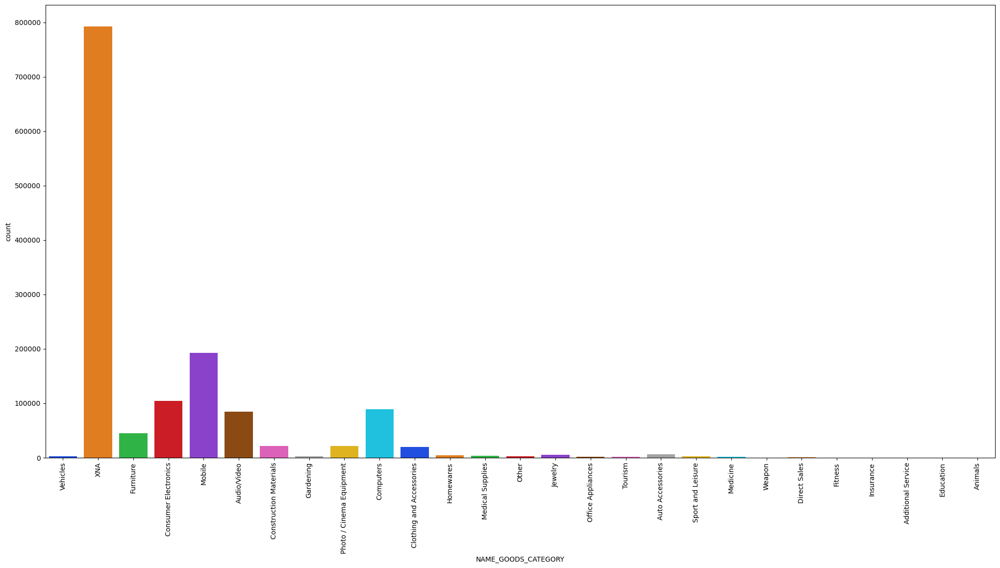

In [201]:
plt.figure(figsize=(25,12))
sns.countplot(x=df_merge['NAME_GOODS_CATEGORY'],palette='bright')
plt.xticks(rotation=90)
plt.show()

* Count of XNA is maximum followed by mobile and computer

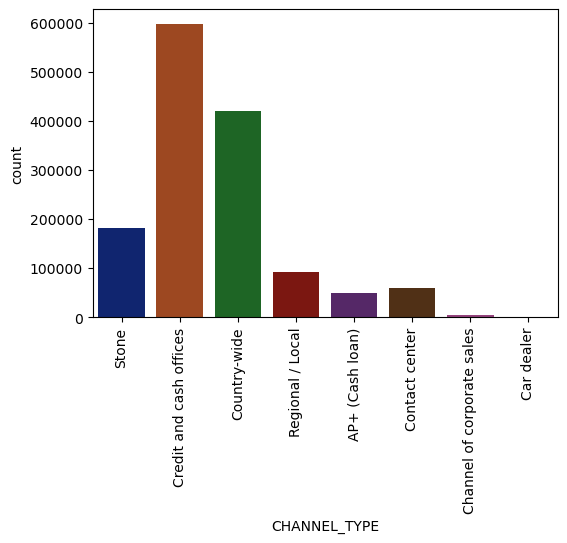

In [202]:
plt.figure(figsize=(6,4))
sns.countplot(x=df_merge['CHANNEL_TYPE'],palette='dark')
plt.xticks(rotation=90)
plt.show()

* Count of Credit and cash offices is maximum followed by Country-wide.

## BIVARIATE ANALYSIS

## NAME_CLIENT_TYPE

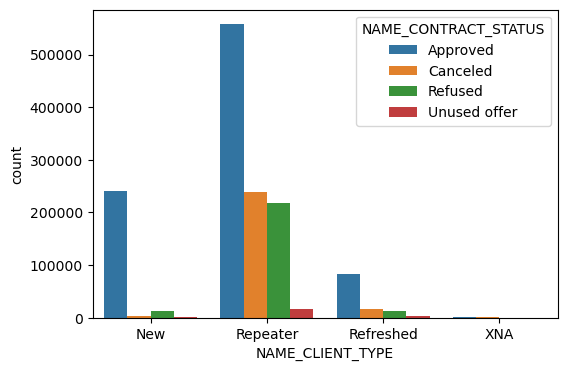

In [203]:
plt.figure(figsize=(6,4))
sns.countplot(data=df_merge,x='NAME_CLIENT_TYPE',hue='NAME_CONTRACT_STATUS',dodge=True)
plt.show()

* Repeaters got maximum number of approvals followed by new customers

In [204]:
df_merge.groupby('NAME_CLIENT_TYPE')['NAME_CONTRACT_STATUS'].value_counts(normalize='True')*100

NAME_CLIENT_TYPE  NAME_CONTRACT_STATUS
New               Approved                93.399996
                  Refused                  4.765159
                  Canceled                 1.114110
                  Unused offer             0.720735
Refreshed         Approved                72.128174
                  Canceled                14.010830
                  Refused                 10.904614
                  Unused offer             2.956382
Repeater          Approved                54.030088
                  Canceled                23.077236
                  Refused                 21.208755
                  Unused offer             1.683921
XNA               Canceled                51.827676
                  Approved                28.133159
                  Refused                 18.211488
                  Unused offer             1.827676
Name: proportion, dtype: float64

* New customers approval percentage is around 93% followed by refreshed customers around 72%.

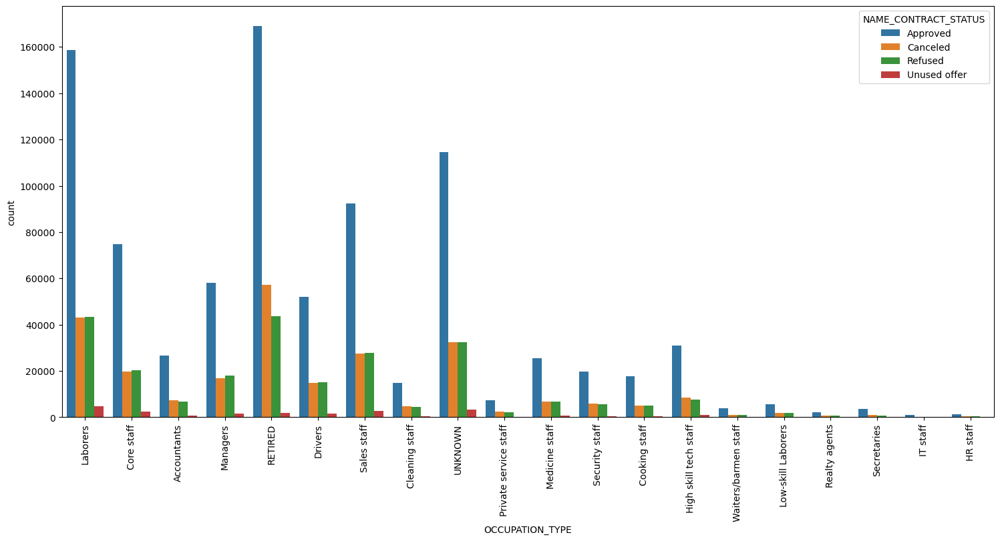

In [205]:
plt.figure(figsize=(18,8))
sns.countplot(data=df_merge,x='OCCUPATION_TYPE',hue='NAME_CONTRACT_STATUS',dodge=True)
plt.xticks(rotation=90)
plt.show()

* Retired customers received maximum number of approvals

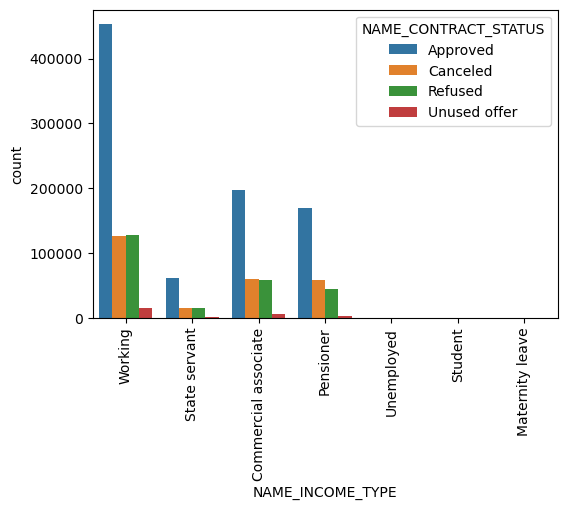

In [206]:
plt.figure(figsize=(6,4))
sns.countplot(data=df_merge,x='NAME_INCOME_TYPE',hue='NAME_CONTRACT_STATUS',dodge=True)
plt.xticks(rotation=90)
plt.show()

* Working income type applicants count is maximum

In [207]:
df_merge.groupby('NAME_INCOME_TYPE')['NAME_CONTRACT_STATUS'].value_counts(normalize='True')*100

NAME_INCOME_TYPE      NAME_CONTRACT_STATUS
Commercial associate  Approved                61.765710
                      Canceled                18.588923
                      Refused                 18.065710
                      Unused offer             1.579658
Maternity leave       Approved                62.500000
                      Refused                 18.750000
                      Canceled                12.500000
                      Unused offer             6.250000
Pensioner             Approved                62.203496
                      Canceled                21.080856
                      Refused                 16.012388
                      Unused offer             0.703259
State servant         Approved                65.271917
                      Canceled                16.610195
                      Refused                 16.508972
                      Unused offer             1.608916
Student               Approved                83.333333
     

* Students have maximum percentage of approvals  followed by state servant and working income type applicants. Uemployed applicants has received maximum number of refusals.

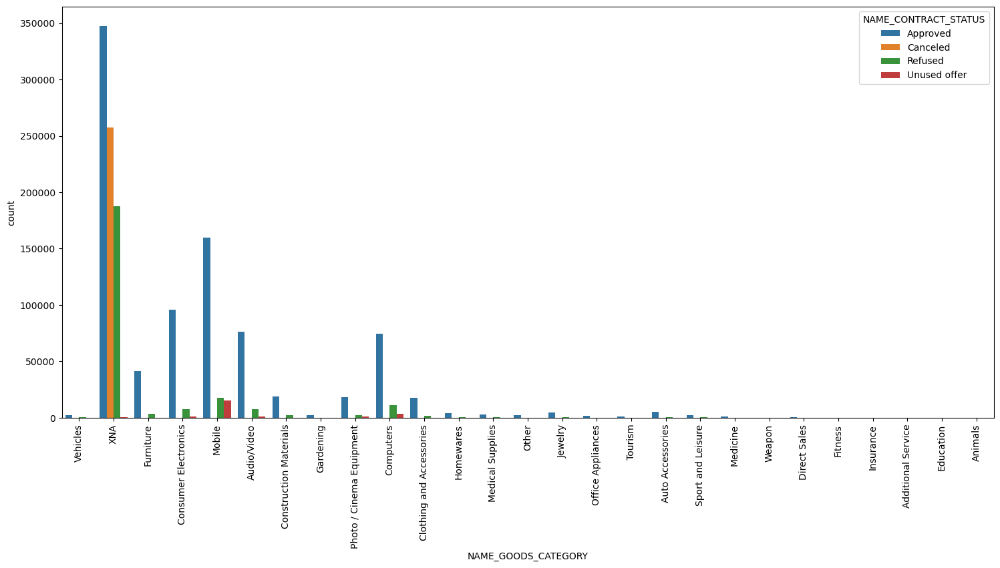

In [208]:
plt.figure(figsize=(18,8))
sns.countplot(data=df_merge,x='NAME_GOODS_CATEGORY',hue='NAME_CONTRACT_STATUS',dodge=True)
plt.xticks(rotation=90)
plt.show()

* XNA received maximum numbers of approvals and refusals.

In [209]:
df_merge.groupby('NAME_GOODS_CATEGORY')['NAME_CONTRACT_STATUS'].value_counts(normalize='True')*100

NAME_GOODS_CATEGORY       NAME_CONTRACT_STATUS
Additional Service        Approved                 88.888889
                          Refused                  11.111111
Animals                   Approved                100.000000
Audio/Video               Approved                 89.963040
                          Refused                   9.037619
                          Unused offer              0.971091
                          Canceled                  0.028250
Auto Accessories          Approved                 88.912201
                          Refused                   9.167205
                          Unused offer              1.888315
                          Canceled                  0.032279
Clothing and Accessories  Approved                 91.192217
                          Refused                   8.437146
                          Unused offer              0.370637
Computers                 Approved                 83.219462
                          Refused     

* There is not much dependency on good category for the loan approval.

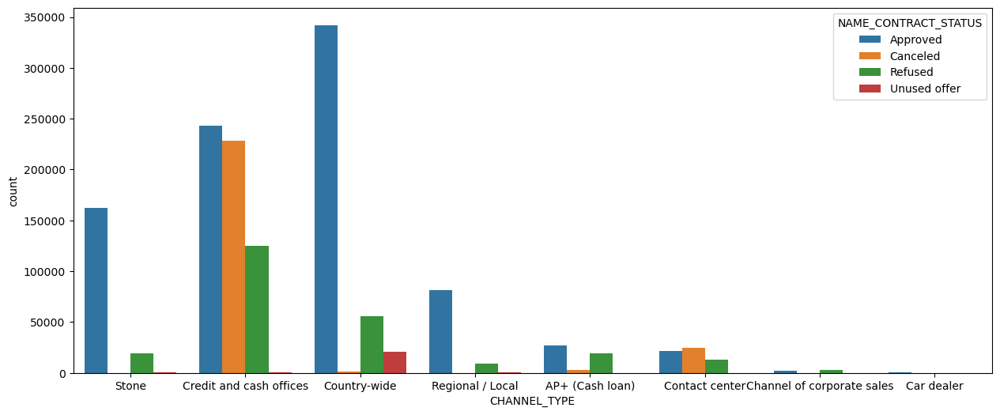

In [210]:
plt.figure(figsize=(15,6))
sns.countplot(data=df_merge,x='CHANNEL_TYPE',hue='NAME_CONTRACT_STATUS',dodge=True)
plt.show()

* Country-wide counts of loan approvals are maximum

In [211]:
df_merge.groupby('CHANNEL_TYPE')['NAME_CONTRACT_STATUS'].value_counts(normalize='True')*100

CHANNEL_TYPE                NAME_CONTRACT_STATUS
AP+ (Cash loan)             Approved                54.633009
                            Refused                 38.854420
                            Canceled                 6.502433
                            Unused offer             0.010138
Car dealer                  Approved                65.260546
                            Refused                 26.550868
                            Canceled                 8.188586
Channel of corporate sales  Refused                 54.741379
                            Approved                43.065967
                            Canceled                 2.192654
Contact center              Canceled                41.505439
                            Approved                36.720684
                            Refused                 21.773877
Country-wide                Approved                81.476577
                            Refused                 13.264903
                     

* Channel corporate sales have maximum number of refusal around 54%.Pecentage of approvals are maximum in Regional/Local channel,also contact center channel have around 41% of cancellation of loan.

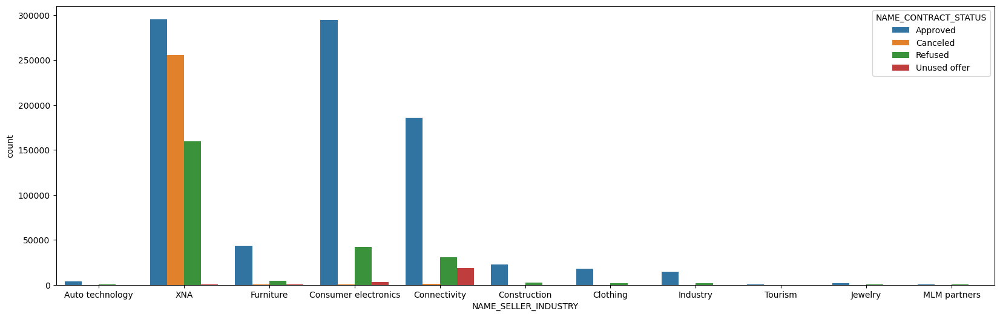

In [212]:
plt.figure(figsize=(20,6))
sns.countplot(data=df_merge,x='NAME_SELLER_INDUSTRY',hue='NAME_CONTRACT_STATUS',dodge=True)
plt.show()

* XNA received the maximum number of loan approvals followed by consumer electronic

In [213]:
df_merge.groupby('NAME_SELLER_INDUSTRY')['NAME_CONTRACT_STATUS'].value_counts(normalize='True')*100

NAME_SELLER_INDUSTRY  NAME_CONTRACT_STATUS
Auto technology       Approved                90.530210
                      Refused                  9.346486
                      Unused offer             0.098644
                      Canceled                 0.024661
Clothing              Approved                90.325850
                      Refused                  9.354888
                      Unused offer             0.314194
                      Canceled                 0.005068
Connectivity          Approved                78.466275
                      Refused                 13.031968
                      Unused offer             8.011605
                      Canceled                 0.490153
Construction          Approved                89.578213
                      Refused                 10.152224
                      Unused offer             0.237850
                      Canceled                 0.031713
Consumer electronics  Approved                86.727817
     

* MLM partners,XNA and connectivity seller industry response is not as good as of other industries.

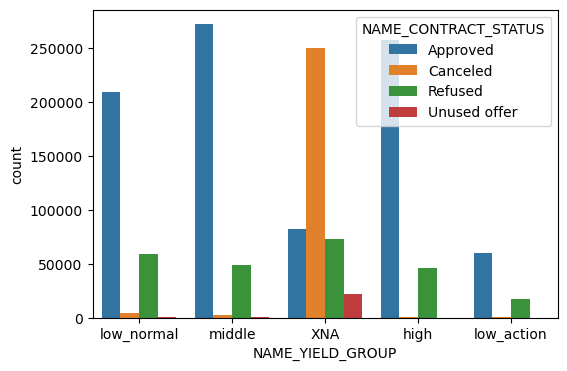

In [214]:
plt.figure(figsize=(6,4))
sns.countplot(data=df_merge,x='NAME_YIELD_GROUP',hue='NAME_CONTRACT_STATUS',dodge=True)
plt.show()

* The middle and high groups received the maximum number of loan approvals, whereas XNA received the most refusals.

In [215]:
df_merge.groupby('NAME_YIELD_GROUP')['NAME_CONTRACT_STATUS'].value_counts(normalize='True')*100

NAME_YIELD_GROUP  NAME_CONTRACT_STATUS
XNA               Canceled                58.481352
                  Approved                19.270897
                  Refused                 17.123773
                  Unused offer             5.123979
high              Approved                84.615587
                  Refused                 15.101063
                  Canceled                 0.263956
                  Unused offer             0.019394
low_action        Approved                77.129378
                  Refused                 21.828368
                  Canceled                 1.042254
low_normal        Approved                76.626805
                  Refused                 21.682313
                  Canceled                 1.488767
                  Unused offer             0.202115
middle            Approved                84.101859
                  Refused                 15.039820
                  Canceled                 0.807540
                  Unused 

* High and low-normal yield group percentage of approvals are highest

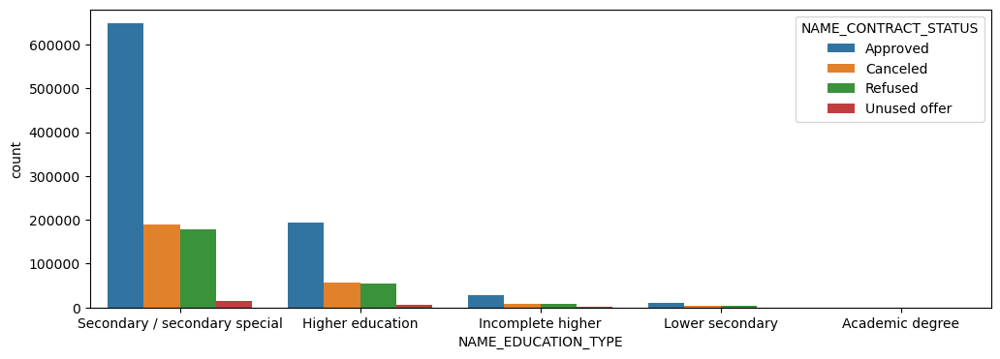

In [216]:
plt.figure(figsize=(12,4))
sns.countplot(data=df_merge,x='NAME_EDUCATION_TYPE',hue='NAME_CONTRACT_STATUS',dodge=True)
plt.show()

* The secondary/secondary special category received the most approvals, whereas higher education received the least percentage of refusals.

In [217]:
df_merge.groupby('NAME_EDUCATION_TYPE')['NAME_CONTRACT_STATUS'].value_counts(normalize='True')*100

NAME_EDUCATION_TYPE            NAME_CONTRACT_STATUS
Academic degree                Approved                72.193437
                               Refused                 15.716753
                               Canceled                11.053541
                               Unused offer             1.036269
Higher education               Approved                62.343998
                               Canceled                18.234419
                               Refused                 17.276509
                               Unused offer             2.145074
Incomplete higher              Approved                61.215952
                               Refused                 19.102724
                               Canceled                17.511572
                               Unused offer             2.169753
Lower secondary                Approved                63.663505
                               Canceled                18.036530
                               Refused

* Applicants with academic degree has maximum percentage of approval.

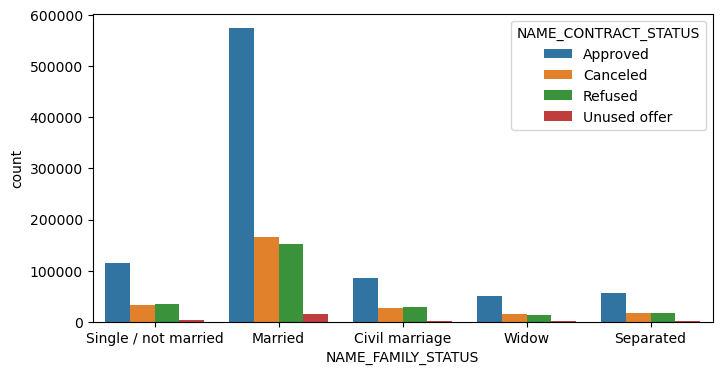

In [218]:
plt.figure(figsize=(8,4))
sns.countplot(data=df_merge,x='NAME_FAMILY_STATUS',hue='NAME_CONTRACT_STATUS',dodge=True)
plt.show()

* Married customers loan approvals counts are maximum

In [219]:
df_merge.groupby('NAME_FAMILY_STATUS')['NAME_CONTRACT_STATUS'].value_counts(normalize='True')*100

NAME_FAMILY_STATUS    NAME_CONTRACT_STATUS
Civil marriage        Approved                60.665409
                      Refused                 19.729950
                      Canceled                18.233273
                      Unused offer             1.371367
Married               Approved                63.364634
                      Canceled                18.356542
                      Refused                 16.699748
                      Unused offer             1.579076
Separated             Approved                62.144652
                      Canceled                18.079245
                      Refused                 18.029662
                      Unused offer             1.746441
Single / not married  Approved                61.554413
                      Refused                 18.362531
                      Canceled                17.898108
                      Unused offer             2.184948
Widow                 Approved                61.885241
     

* Family status has not much effect on loan approval 

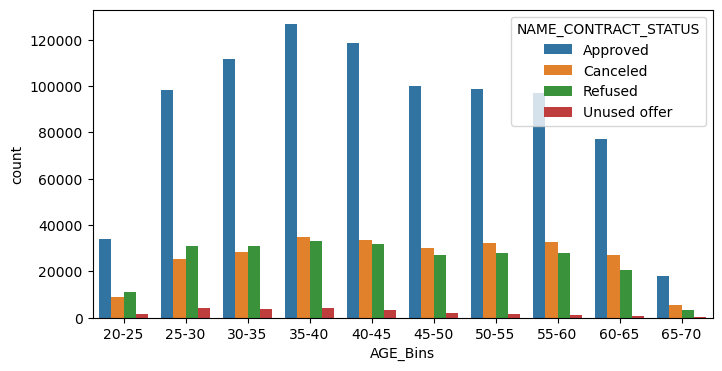

In [220]:
plt.figure(figsize=(8,4))
sns.countplot(data=df_merge,x='AGE_Bins',hue='NAME_CONTRACT_STATUS',dodge=True)
plt.show()

* Loan approvals are highest in the age range between 35 and 45, and the number of approvals decreases after age 60.

In [221]:
df_merge.groupby('AGE_Bins')['NAME_CONTRACT_STATUS'].value_counts(normalize='True')*100

AGE_Bins  NAME_CONTRACT_STATUS
20-25     Approved                61.446629
          Refused                 19.969029
          Canceled                15.787957
          Unused offer             2.796384
25-30     Approved                62.202035
          Refused                 19.451669
          Canceled                15.849578
          Unused offer             2.496717
30-35     Approved                63.840496
          Refused                 17.735441
          Canceled                16.286133
          Unused offer             2.137930
35-40     Approved                63.806105
          Canceled                17.425646
          Refused                 16.741507
          Unused offer             2.026741
40-45     Approved                63.442233
          Canceled                17.892881
          Refused                 16.879391
          Unused offer             1.785495
45-50     Approved                62.859885
          Canceled                18.896541
 

* Percentage of approvals are maximum in the age range of between 30-45 and also suprisingly between 65-70 age range.

## Analysing columns having highest correlation

In [222]:
numeric_df_merge = df_merge.select_dtypes(include=['number'])
categorical_df_merge = df_merge.select_dtypes(include=['category', 'object'])

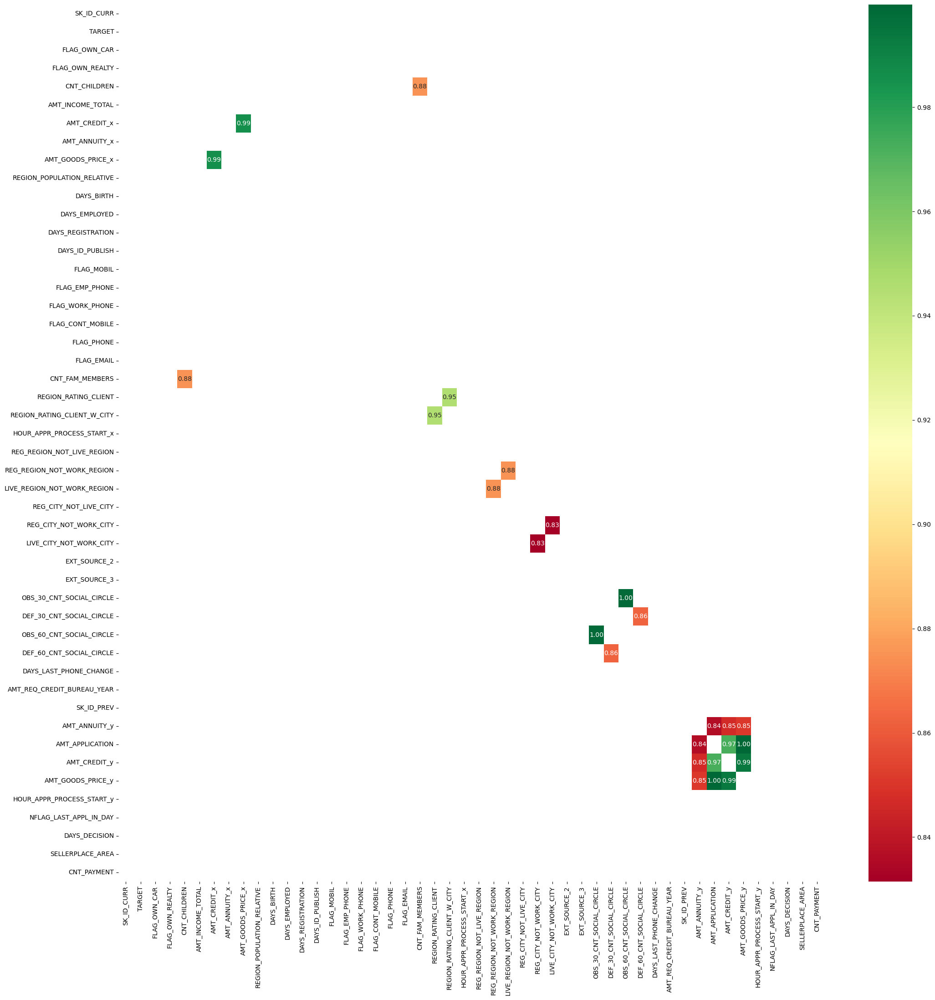

In [223]:
plt.figure(figsize=(25,25))
corr_merge=numeric_df_merge.corr()
sns.heatmap(data = corr_merge[(corr_merge >= 0.8) & (corr_merge < 0.9999)], annot = True, cmap = "RdYlGn", cbar = True, fmt='.2f')
plt.show()

## Top 10 correlation between the numerical columns of a merged data 

In [224]:
corr_merge[corr_merge <= 0.99].unstack().sort_values(ascending = False).head(22)

AMT_CREDIT_x                 AMT_GOODS_PRICE_x              0.985344
AMT_GOODS_PRICE_x            AMT_CREDIT_x                   0.985344
AMT_CREDIT_y                 AMT_APPLICATION                0.972672
AMT_APPLICATION              AMT_CREDIT_y                   0.972672
REGION_RATING_CLIENT         REGION_RATING_CLIENT_W_CITY    0.945427
REGION_RATING_CLIENT_W_CITY  REGION_RATING_CLIENT           0.945427
LIVE_REGION_NOT_WORK_REGION  REG_REGION_NOT_WORK_REGION     0.875290
REG_REGION_NOT_WORK_REGION   LIVE_REGION_NOT_WORK_REGION    0.875290
CNT_FAM_MEMBERS              CNT_CHILDREN                   0.875138
CNT_CHILDREN                 CNT_FAM_MEMBERS                0.875138
DEF_60_CNT_SOCIAL_CIRCLE     DEF_30_CNT_SOCIAL_CIRCLE       0.862865
DEF_30_CNT_SOCIAL_CIRCLE     DEF_60_CNT_SOCIAL_CIRCLE       0.862865
AMT_GOODS_PRICE_y            AMT_ANNUITY_y                  0.850754
AMT_ANNUITY_y                AMT_GOODS_PRICE_y              0.850754
AMT_CREDIT_y                 AMT_A

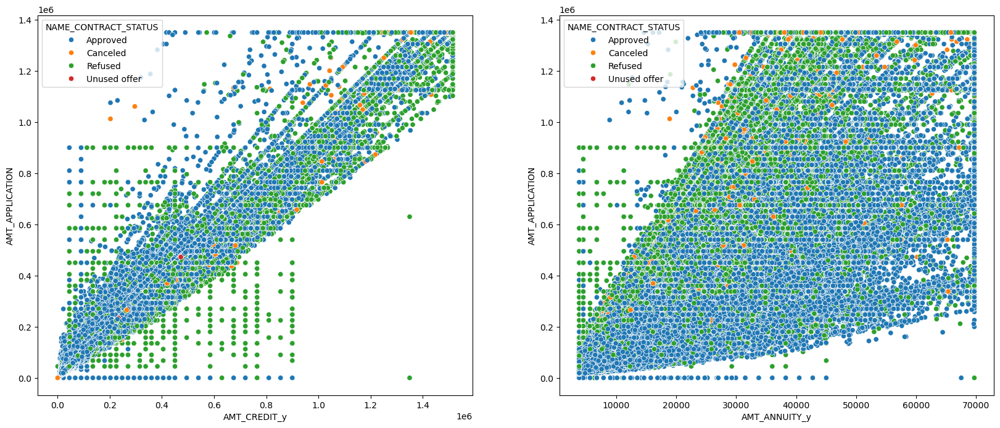

In [225]:
plt.subplots(1,2,figsize=(20,8))
plt.subplot(1,2,1)
sns.scatterplot(x='AMT_CREDIT_y',y= 'AMT_APPLICATION',data=df_merge,hue='NAME_CONTRACT_STATUS',color='Green')
plt.subplot(1,2,2)
sns.scatterplot(x='AMT_ANNUITY_y',y= 'AMT_APPLICATION',data=df_merge,hue='NAME_CONTRACT_STATUS',color='blue')
plt.show()

* High Correlation Observed: The graph shows a high correlation between AMT_APPLICATION and AMT_CREDIT_y.
* Logical Relationship: It makes sense logically; as the loan amount asked increases, the amount of loan sanctioned also increases.
* Cause and Effect: Therefore, we can conclude that an increase in AMT_APPLICATION causes an increase in AMT_CREDIT_y.

* High Correlation Observed: The graph shows a high correlation between AMT_APPLICATION and AMT_ANNUITY_y.
* Logical Relationship: It makes sense logically; as the amount of loan asked increases,the installment amount needed also increases.
* Cause and Effect: Therefore, we can conclude that an increase in AMT_APPLICAATION causes an increase in AMT_ANNUITY_y.

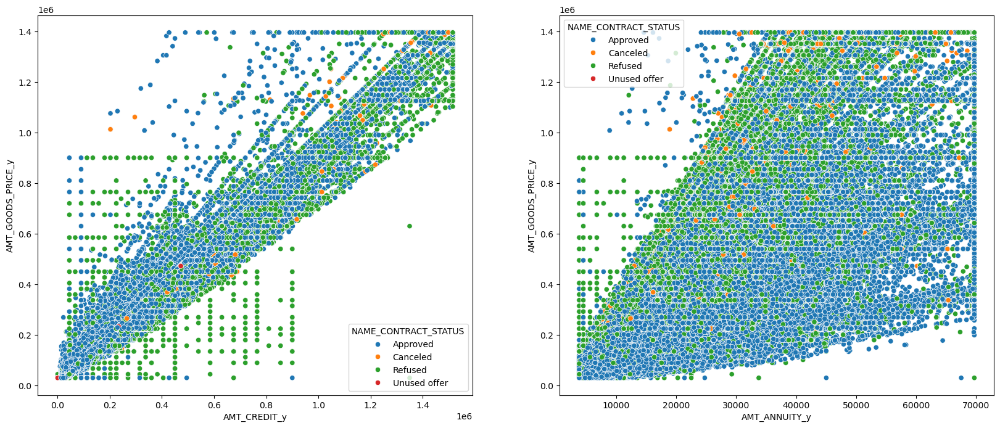

In [226]:
plt.subplots(1,2,figsize=(20,8))
plt.subplot(1,2,1)
sns.scatterplot(x='AMT_CREDIT_y',y= 'AMT_GOODS_PRICE_y',data=df_merge,hue='NAME_CONTRACT_STATUS',color='Orange')
plt.subplot(1,2,2)
sns.scatterplot(x='AMT_ANNUITY_y',y= 'AMT_GOODS_PRICE_y',data=df_merge,hue='NAME_CONTRACT_STATUS',color='Green')
plt.show()

* High Correlation Observed: The graph shows a high correlation between AMT_GOODS_PRICE_y and AMT_CREDIT_y.
* Logical Relationship: It makes sense logically; as the price of goods increases, the amount of loan also increases.
* Cause and Effect: Therefore, we can conclude that an increase in AMT_GOODS_PRICE causes an increase in AMT_CREDIT_y.

* High Correlation Observed: The graph shows a high correlation between AMT_GOODS_PRICE_y and AMT_ANNUITY_y.
* Logical Relationship: It makes sense logically; as the price of goods increases, the installment amount needed also increases.
* Cause and Effect: Therefore, we can conclude that an increase in AMT_GOODS_PRICE causes an increase in AMT_ANNUITY_y.

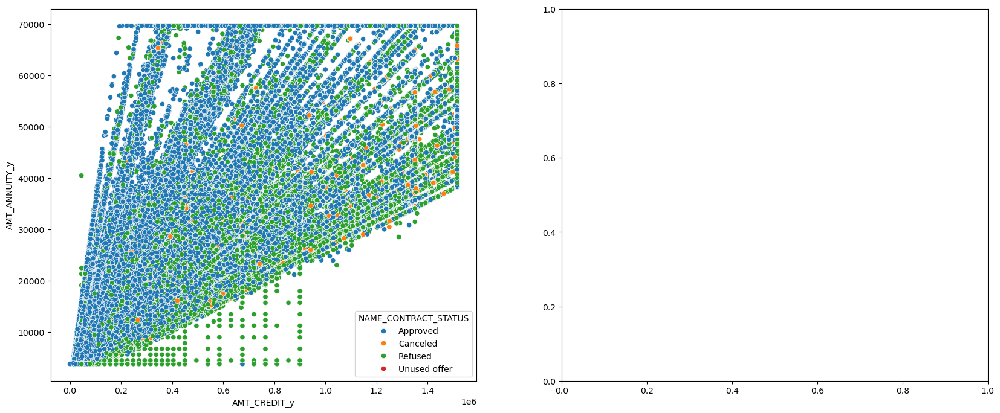

In [227]:
plt.subplots(1,2,figsize=(20,8))
plt.subplot(1,2,1)
sns.scatterplot(x='AMT_CREDIT_y',y= 'AMT_ANNUITY_y',data=df_merge,hue='NAME_CONTRACT_STATUS',color='Green')
plt.show()

* High Correlation Observed: The graph shows a high correlation between AMT_ANNUITY_y and AMT_CREDIT_y.
* Logical Relationship: It makes sense logically; as the amount of loan increases, the installment amount also increases.
* Cause and Effect: Therefore, we can conclude that an increase in AMT_GOODS_PRICE causes an increase in AMT_ANNUITY.

## Conclusion

* Customers in occupations such as Accountant, retired, and students tend to make payments on time.
* Customers with higher education or academic degrees are favorable targets for lenders.
* Customers who have been employed for more than 10 years should be considered.
* Customers aged over 40 are considered reliable borrowers.
* Customers in occupations such as drivers and low-skill laborers often face difficulties in making payments on time.
* It is advisable to avoid working-class and unemployed customers.
* Customers who have been employed for less than 10 years should not be considered for loans.
* Customers under the age of 30 frequently encounter difficulties in making payments
* Customers with lower secondary education tend not to make payments on time.
* Single or not married customers should be avoided.                           
